In [1]:
#Author: Hana Jaafari
#Date: 09/22/2020
#Purpose: The purpose of this script is to compare the experimental ddG values with dAWSEM values for families
#featured in pseudogene analysis; PF00034 and PF01248 had pdbs lsited in "High quality thermodynamic.." (2016 paper).
#In order to do so, this script will run short simulations to minimize the energies of the pdb file with and without the
#experimental mutation, and do the same for shuffled pdb files.
import os
import pandas as pd
import subprocess
import glob
import matplotlib.pyplot as plt
import traceback
import numpy as np
import seaborn as sns
import scipy
import statsmodels.api as sm
pd.set_option('display.max_columns', None)

root_directory="/Volumes/Seagate_Extra_Files/Time-Devolution-Calc"

morcos_S1_ddG_ddAWSEM_directory=f"{root_directory}/AWSEM_Energy_Calculations/\
03_29_2021_Experimental_ddG_ddAWSEM_ddDCA_Analysis/12_05_2022_Morcos_S1_Point_Mutations_ddG_ddAWSEM"

morcos_S6_ddG_ddAWSEM_directory=f"{root_directory}/AWSEM_Energy_Calculations/\
03_29_2021_Experimental_ddG_ddAWSEM_ddDCA_Analysis/09_15_2021_Morcos_S6_Point_Mutations_ddG_ddAWSEM_Uniprot_Corrected"

all_single_mutation_S6_ddG_ddAWSEM_directory=f"{root_directory}/AWSEM_Energy_Calculations/\
03_29_2021_Experimental_ddG_ddAWSEM_ddDCA_Analysis/03_25_2022_Morcos_S6_Point_Mutations_ddG_ddAWSEM_All_Single_Mutations_Corrected_k_contact=4.184"

protherm_database_directory=f"{root_directory}/ProTherm_Database"
database_mapping_directory=f"{root_directory}/Database_Mapping"

In [2]:
pdb_uniprot_mapping=pd.read_csv(f"{database_mapping_directory}/pdb_chain_uniprot.csv",sep=",")

# Plotting Parameters

In [3]:
plt.rcParams["legend.title_fontsize"] = 30
plt.rcParams['legend.fontsize'] = 30
plt.rcParams['axes.labelsize'] = 40
plt.rcParams['axes.titlesize'] = 40
plt.rcParams['xtick.labelsize'] = 40
plt.rcParams['ytick.labelsize'] = 40
plt.rcParams["legend.markerscale"] = 3
###
bins=30

# PDZ Experimental ddG Values
The unfolding ddG values can be found in the article's table 1: https://www.pnas.org/content/104/1/128

In [4]:
pdz_experimental_ddG={"16_A":2.14,"18_A":3.52,"21_S":0.05,"25_A":2.41,"27_V":1.58,"29_A":3.23,"30_S":0.23,
                 "33_A": -0.21,"33_G":0.1,"35_S":0.1,"35_G":-0.31,"42_V":0.72,"44_A":3.66,"46_G":0.88,
                 "47_V":0.11,"52_G":2.22,"53_G":2.39,"59_V":1.08,"65_A":4.01,"66_A":2.34,"68_A":2.17,
                 "73_A":3.07,"79_A":-0.67,"79_G":1.21,"81_G":1.86,"83_A":0.82,"83_G":1.28,"85_A":4.20,
                 "92_A":1.56,"94_A":4.50,"96_A":3.36}

# Picking Protherm with Different Criteria

## Downloading Protherm and Protherm DB Databases

In [5]:
def ddg_stability_measurement(x):
    for column in ["ddG_H2O_Uncorrected","ddG_H2O_Corrected"]:
        if float(x[column])<=0.5 and float(x[column])>=-0.5:
            x[f"Stability_{column.split('_')[-1]}"]="Neutral"
        elif float(x[column])<-0.5:
            x[f"Stability_{column.split('_')[-1]}"]="Stabilizing"
        elif float(x[column])>0.5:
            x[f"Stability_{column.split('_')[-1]}"]="Destabilizing"
        else:
            x[f"Stability_{column.split('_')[-1]}"]=np.nan
    return x

In [6]:
if not os.path.exists(f"{protherm_database_directory}/All_ProTherm_Database_Filtered_Corrected.csv"):
    all_protherm_analyzed_ddG_data=pd.read_csv(f"{protherm_database_directory}/All_ProTherm_Database.csv",
                                               encoding="ISO-8859-1",engine="python",header=0)

    all_protherm_analyzed_ddG_data=all_protherm_analyzed_ddG_data.loc[~(all_protherm_analyzed_ddG_data["ddG_H2O"].str.contains("<",na=False))]
    #Uncorrected ddG will include entries with kJ/mol (instead of kcal/mol) to compare with Nick's results.
    all_protherm_analyzed_ddG_data["ddG_H2O_Uncorrected"] = -(all_protherm_analyzed_ddG_data['ddG_H2O'].str.split().str[0]).astype(float)

    all_protherm_analyzed_ddG_data["ddG_H2O_Corrected"]=np.where(all_protherm_analyzed_ddG_data["ddG_H2O"].str.contains("kJ"),
                                                                 -(((all_protherm_analyzed_ddG_data["ddG_H2O"].str.split().str[0]).astype(float))/4.184),
                                                                 -(all_protherm_analyzed_ddG_data["ddG_H2O"].str.split().str[0]).astype(float))
    all_protherm_analyzed_ddG_data=all_protherm_analyzed_ddG_data.apply(ddg_stability_measurement,axis=1)
    ###
    all_protherm_analyzed_ddG_data[["pH","T","NO_MOLECULE"]]=all_protherm_analyzed_ddG_data[["pH","T","NO_MOLECULE"]].apply(pd.to_numeric,
                                                                                                                            errors="coerce", downcast='float')
    all_protherm_analyzed_ddG_data["MUTATED_CHAIN"]=all_protherm_analyzed_ddG_data["MUTATED_CHAIN"].astype(str)
    all_protherm_analyzed_ddG_data.to_csv(f"{protherm_database_directory}/All_ProTherm_Database_Filtered_Corrected.csv")
else:
    all_protherm_analyzed_ddG_data=pd.read_csv(f"{protherm_database_directory}/All_ProTherm_Database_Filtered_Corrected.csv",
                                               encoding="ISO-8859-1",engine="python",header=0)

## Picking All Single Mutation ProTherm Entries

In [7]:
if not os.path.exists(f"{protherm_database_directory}/Protherm_Single_Mutations_Data.txt"):
    all_protherm_single_mutations_data=all_protherm_analyzed_ddG_data.loc[~((all_protherm_analyzed_ddG_data["MUTATION"].str.contains(",")) | (all_protherm_analyzed_ddG_data["MUTATION"].str.contains("wild")))]
    all_protherm_single_mutations_data=all_protherm_single_mutations_data.dropna(subset=["MUTATION"])

    all_protherm_single_mutations_data["MUTATED_CHAIN"]=np.where((all_protherm_single_mutations_data["MUTATED_CHAIN"].str.contains("nan")) | 
                                                       (all_protherm_single_mutations_data["MUTATED_CHAIN"].str.contains("_")) | 
                                                       (all_protherm_single_mutations_data["MUTATED_CHAIN"].str.contains("-")),
                                                       "A",all_protherm_single_mutations_data["MUTATED_CHAIN"])

    all_protherm_single_mutations_data=all_protherm_single_mutations_data.apply(ddg_stability_measurement,axis=1)
    all_protherm_single_mutations_data=all_protherm_single_mutations_data.loc[all_protherm_single_mutations_data["NO_MOLECULE"]==1]

    all_protherm_single_mutations_data.to_csv(f"{protherm_database_directory}/Protherm_Single_Mutations_Data.txt")
else:
    all_protherm_single_mutations_data=pd.read_csv(f"{protherm_database_directory}/Protherm_Single_Mutations_Data.txt")
    ###
    #Reference mutated proteins or proteins requiring metal ions to stabilize are removed.
    remark_phrases_to_avoid_list=["pseudo","Zn","ferredoxin","repressor","B12 Q","twitchin"]
    pdbs_to_avoid_list=["1CEY","1AKK","1BP2","1C2R","1CSP","1CYC","1CYO","1FEP","1HFY","1I5T","1B26",
                       "1IGV","1MJC","1MSI","1P2P","1UWO","1YCC","1YEA","1ZNJ","2ADA","3D2A","451C","5AZU"]
    all_protherm_single_mutations_data=all_protherm_single_mutations_data.loc[~all_protherm_single_mutations_data["REMARKS"].str.contains('|'.join(remark_phrases_to_avoid_list),na=False)]
    all_protherm_single_mutations_data=all_protherm_single_mutations_data.loc[~all_protherm_single_mutations_data["PDB_wild"].str.contains('|'.join(pdbs_to_avoid_list),na=False)]
    ###
    all_protherm_single_mutations_pdb_chain_dictionary=all_protherm_single_mutations_data.groupby('PDB_wild')['MUTATED_CHAIN'].apply(list).to_dict()

## Picking Protherm Entries from Morcos Uniprot IDs

In [8]:
if not os.path.exists(f"{protherm_database_directory}/Protherm_Uniprot_Mapped_PDB_ddG_Data.txt"):
    morcos_protherm_analyzed_ddG_data=pd.DataFrame()
    #Morcos's analyzed Protherm uniprot ids
    with open(f"{protherm_database_directory}/Morcos_Sent_ProTherm_Database/Protherm_uniprot.dat","r") as f:
        for uniprot_name in f:
            try:
                pdb_experimental_data=all_protherm_analyzed_ddG_data.loc[all_protherm_analyzed_ddG_data["SWISSPROT_ID"].str.contains(uniprot_name.replace("\n",""),na=False)]
                morcos_protherm_analyzed_ddG_data=morcos_protherm_analyzed_ddG_data.append(pdb_experimental_data)
            except:
                traceback.print_exc()
                continue
    #Picking entries with point mutations
    morcos_protherm_analyzed_ddG_data=morcos_protherm_analyzed_ddG_data.loc[~((morcos_protherm_analyzed_ddG_data["MUTATION"].str.contains(",")) | (morcos_protherm_analyzed_ddG_data["MUTATION"].str.contains("wild")))]
    morcos_protherm_analyzed_ddG_data=morcos_protherm_analyzed_ddG_data.dropna(subset=["MUTATION"])
    ###
    morcos_protherm_analyzed_ddG_data["MUTATED_CHAIN"]=np.where((morcos_protherm_analyzed_ddG_data["MUTATED_CHAIN"].str.contains("nan")) | 
                                                       (morcos_protherm_analyzed_ddG_data["MUTATED_CHAIN"].str.contains("_")) | 
                                                       (morcos_protherm_analyzed_ddG_data["MUTATED_CHAIN"].str.contains("-")),
                                                       "A",morcos_protherm_analyzed_ddG_data["MUTATED_CHAIN"])
    morcos_protherm_analyzed_ddG_data=morcos_protherm_analyzed_ddG_data.loc[morcos_protherm_analyzed_ddG_data["NO_MOLECULE"]==1]
    morcos_protherm_analyzed_ddG_data=morcos_protherm_analyzed_ddG_data.apply(ddg_stability_measurement,axis=1)
    
    morcos_protherm_analyzed_ddG_data.to_csv(f"{protherm_database_directory}/Protherm_Uniprot_Mapped_PDB_ddG_Data.txt")
else:
    morcos_protherm_analyzed_ddG_data=pd.read_csv(f"{protherm_database_directory}/Protherm_Uniprot_Mapped_PDB_ddG_Data.txt")
    protherm_pdb_chain_dictionary=morcos_protherm_analyzed_ddG_data.groupby('PDB_wild')['MUTATED_CHAIN'].apply(list).to_dict()

# Extract Minimum AWSEM Energies

In [9]:
def extract_energies(protein_file,analysis_directory):
    #Find the index where the energies begin to be printed out.
    starting_index=subprocess.check_output(["grep","-n","Printing energies",protein_file])
    starting_index=int(starting_index.decode("utf-8").replace("\n","").split(":")[0])
    #Read the values of all energies
    if "Uniprot" in analysis_directory:
        names=['Steps','Q','Rg','Backbone','Rama','Contact','Burial','dbias','Rg_Bias','Fragment',
               'Membrane','ER','TBM_Q','Beta','Pap','Helical','Debye_huckel','Total']  
    else:
        names=['Steps', 'Q', 'Rg', 'Backbone', 'Rama', 'Burial', 'Contact','Fragment', 'Membrane',
               'ER','TBM_Q', 'Beta','Pap', 'Helical','Total']
    frame_output=pd.read_csv(protein_file,sep="\s+",dtype=np.float64, 
                             skiprows=[i for i in range(0,starting_index+1)],engine="python",
                             names=names)
    if "Uniprot" in analysis_directory:
        frame_output["Burial"]=frame_output["Burial"]-frame_output["Contact"]
    frame_output["HB"]=frame_output["Pap"]+frame_output["Beta"]+frame_output["Helical"]
    frame_output["Burial+Contact"]=frame_output["Burial"]+frame_output["Contact"]
    return frame_output

# Scale Individual AWSEM Energy Terms (Multiple Linear Regression)

In [10]:
def weigh_AWSEM_energy_terms(morcos_ddAWSEM_ddG_dataframe,y_label,AWSEM_terms):
    #Perform multiple linear regression on each provided AWSEM energy term. Intercept is zero.
    X=morcos_ddAWSEM_ddG_dataframe[AWSEM_terms]
    Y=morcos_ddAWSEM_ddG_dataframe[y_label]
    regr = sm.OLS(Y,X)
    results=regr.fit()
    return results

# Calculate PDB ddAWSEM and Experimental ddG

Webpage for ProTherm entry data categories: http://dna00.bio.kyutech.ac.jp/protherm/pp_data_help.html

dG_H2O is the unfolding ddG, so ddG_H20 needs to be scaled by -1.

In [11]:
def calculate_pdb_ddAWSEM(protein_identifier,chain_name,pdb_directory,ddAWSEM_calculation_type='dAWSEM'):
    native_file=glob.glob(f"{pdb_directory}/crystal_structure_openawsem_output.txt")
    shuffled_native_file=glob.glob(f"{pdb_directory}/shuffled_crystal_structure*_openawsem_output.txt")
    
    all_native_AWSEM_values=extract_energies(native_file[0],pdb_directory)
    all_shuffled_native_AWSEM_values=extract_energies(shuffled_native_file[0],pdb_directory)
    native_shuffled_dAWSEM_values=all_native_AWSEM_values.sub(all_shuffled_native_AWSEM_values,fill_value=0)
    ###
    count=0
    for output_file in glob.glob(f"{pdb_directory}/mutated_*_openawsem_output.txt"):
        if "shuffled" not in output_file:
            try:
                file_name=os.path.basename(output_file).replace(".txt","")
                mutation_index=file_name.split("_")[1]; corrected_mutation_index=file_name.split("_")[2]; 
                mutation_residue=file_name.split("_")[3]
                ###
                all_mutated_AWSEM_values=extract_energies(output_file,pdb_directory)
                all_shuffled_mutated_AWSEM_values=extract_energies(output_file.replace("mutated","mutated_shuffled"),pdb_directory)
                mutated_shuffled_dAWSEM_values=all_mutated_AWSEM_values.sub(all_shuffled_mutated_AWSEM_values,fill_value=0)
                if ddAWSEM_calculation_type=="ddAWSEM":
                    ddAWSEM_values_dataframe=mutated_shuffled_dAWSEM_values.sub(native_shuffled_dAWSEM_values,fill_value=0)
                else:
                    ddAWSEM_values_dataframe=-all_native_AWSEM_values.sub(all_mutated_AWSEM_values,fill_value=0)
                ddAWSEM_values_dataframe["PDB_wild"]=protein_identifier.split('_')[0]
                ###
                if "Single" in pdb_directory:
                    protherm_ddG_data=all_protherm_single_mutations_data
                else:
                    protherm_ddG_data=morcos_protherm_analyzed_ddG_data
                if "1GM1" not in protein_identifier:
                    all_parameters_dataframe=protherm_ddG_data.loc[((protherm_ddG_data["PDB_wild"]==protein_identifier.split('_')[0]) & 
                                                                    (protherm_ddG_data["MUTATION"].str.contains(f" {mutation_index} {mutation_residue}")) & 
                                                                    (protherm_ddG_data["MUTATED_CHAIN"]==chain_name))]
                    merged_protherm_ddAWSEM_values=ddAWSEM_values_dataframe.merge(all_parameters_dataframe,
                                                                                  on="PDB_wild")
                else:
                    merged_protherm_ddAWSEM_values=ddAWSEM_values_dataframe
                    merged_protherm_ddAWSEM_values["Original_Mutation"]=f"{mutation_index}_{mutation_residue}"
                    merged_protherm_ddAWSEM_values["ddG_H2O_Corrected"]=merged_protherm_ddAWSEM_values["Original_Mutation"].map(pdz_experimental_ddG)
                    
                if count==0:
                    all_mutations_protherm_ddAWSEM_values=merged_protherm_ddAWSEM_values
                else:
                    all_mutations_protherm_ddAWSEM_values=all_mutations_protherm_ddAWSEM_values.append(merged_protherm_ddAWSEM_values)
                count+=1
            except Exception:
                traceback.print_exc()
                continue
    all_mutations_protherm_ddAWSEM_values=all_mutations_protherm_ddAWSEM_values.dropna(subset=["ddG_H2O_Corrected"])
    all_mutations_protherm_ddAWSEM_values.to_csv(f"{pdb_directory}/Morcos_{protein_identifier}_ddG_{ddAWSEM_calculation_type}_data.txt",index=False)
    return all_mutations_protherm_ddAWSEM_values

# Plot PDB ddAWSEM vs. ddG

In [12]:
def plot_pdb_ddAWSEM_vs_ddG(morcos_ddAWSEM_ddG_dataframe,AWSEM_terms,protein_identifier,analysis_directory,
                            ddAWSEM_calculation_type='dAWSEM',hue_parameter=None,hue_palette=None,
                            colorbar_parameter=None,colorbar_title=None):
    plt.figure(figsize=(20,20))

    ddG_ddAWSEM_regression=weigh_AWSEM_energy_terms(morcos_ddAWSEM_ddG_dataframe,y_label="ddG_H2O_Corrected",
                                                    AWSEM_terms=AWSEM_terms)
    ddAWSEM_coef=ddG_ddAWSEM_regression.params
    ###
    X=morcos_ddAWSEM_ddG_dataframe[AWSEM_terms].sum(axis=1)
    Y=morcos_ddAWSEM_ddG_dataframe["ddG_H2O_Corrected"]
    
    if hue_parameter==None:
        sns.scatterplot(x=Y,y=X,s=450,color="black",alpha=0.7)
    else:
        if colorbar_parameter:
            ax = sns.scatterplot(x="ddG_H2O_Corrected",y="Burial+Contact",s=200,hue=colorbar_parameter,alpha=0.7,
                                 palette='viridis', style=hue_parameter,data=morcos_ddAWSEM_ddG_dataframe)

            norm = plt.Normalize(morcos_ddAWSEM_ddG_dataframe[colorbar_parameter].min(), 
                                 morcos_ddAWSEM_ddG_dataframe[colorbar_parameter].max())
            sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
            sm.set_array([])

            # Remove the legend and add a colorbar
            ax.figure.colorbar(sm,label=colorbar_title)
            h, l = ax.get_legend_handles_labels()
            ax.legend(handles=[item for item in h[-2:]], labels= [item for item in l[-2:]],loc="lower right")
        else:
            sns.scatterplot(data=morcos_ddAWSEM_ddG_dataframe,x="ddG_H2O_Corrected",y="Burial+Contact",
                               hue=hue_parameter,s=200,palette=hue_palette,alpha=0.7)
            plt.legend(loc="lower right")

    rvalue,_=scipy.stats.pearsonr(X,Y)
    print(f"Pearson Coefficient={rvalue}")
    plt.text(.1, .97,f"R={rvalue:.2f}",horizontalalignment='center', verticalalignment='center',
             fontsize=40,color="blue",transform=plt.gca().transAxes) 

    AWSEM_scaling_terms_list=[]
    for i in range(len(AWSEM_terms)):
        AWSEM_scaling_terms_list.append(f"{ddAWSEM_coef[i]:.2f}({AWSEM_terms[i]})")

    plt.text(.5, .93,f"y={'+'.join(AWSEM_scaling_terms_list)}",horizontalalignment='center',
                     verticalalignment='center',fontsize=40,color="blue",transform=plt.gca().transAxes) 

    plt.grid(True)
    if ddAWSEM_calculation_type=="ddAWSEM":
        plt.ylabel(r"$\Delta \Delta H_{AWSEM}$")
    else:
        plt.ylabel(r"$\Delta H_{AWSEM}$")
    plt.xlabel(r"$\Delta \Delta$ G (kcal/mol)")

    plt.savefig(f"{analysis_directory}/Morcos_Protherm_experimental_ddG_{ddAWSEM_calculation_type}_{protein_identifier}.png",
               bbox_inches="tight")
    plt.show()
    plt.close()
    
    return ddAWSEM_coef

# Loop Over PDBs for ddAWSEM vs. ddG Plot

In [13]:
def calculate_all_pdb_ddAWSEM(select_PDBs,analysis_directory,ddAWSEM_calculation_type="dAWSEM"):
    if not select_PDBs:
        morcos_pdbs=[]
    else:
        morcos_pdbs=select_PDBs
    ###
    all_morcos_protein_values={"PDB_Name":[],"UniProt_ID":[],"ddG_Entries_Count":[]}
    ###
    if "Single" in analysis_directory:
        pdb_chain_dictionary=all_protherm_single_mutations_pdb_chain_dictionary
    elif "S1" in analysis_directory:
        pdb_chain_dictionary={"1GM1":["A"]}
    else:
        pdb_chain_dictionary=protherm_pdb_chain_dictionary
    ###
    count=0
    for original_protein_identifier in pdb_chain_dictionary:
        for chain_name in list(set(pdb_chain_dictionary[original_protein_identifier])):
            protein_identifier=f"{original_protein_identifier}_{chain_name}"
            print("####")
            print(f"Calculating {ddAWSEM_calculation_type} Values for {protein_identifier}")
            print("####")
            if not select_PDBs:
                try:
                    pdb_directory=glob.glob(f"{analysis_directory}/*{protein_identifier}_Experimental_ddG_ddAWSEM")[0]
                except:
                    continue
            else:
                pdb_directory=analysis_directory
            
            native_pdb_file=glob.glob(f"{pdb_directory}/crystal_structure_openawsem_output.txt")
            shuffled_native_pdb_file=glob.glob(f"{pdb_directory}/shuffled_crystal_structure*_openawsem_output.txt")
            if len(native_pdb_file)>0 and len(shuffled_native_pdb_file)>0 and len(glob.glob(f"{pdb_directory}/mutated_*_openawsem_output.txt"))>=2:
                if "Printing energies" in open(native_pdb_file[0],"r").read() and "Printing energies" in open(shuffled_native_pdb_file[0],"r").read():
                    morcos_protein_dataframe= calculate_pdb_ddAWSEM(protein_identifier,chain_name,pdb_directory,
                                                                   ddAWSEM_calculation_type=ddAWSEM_calculation_type)

                    all_morcos_protein_values["PDB_Name"].append(protein_identifier)
                    all_morcos_protein_values["ddG_Entries_Count"].append(len(morcos_protein_dataframe))
                    ###
                    uniprot_id=pdb_uniprot_mapping.loc[(pdb_uniprot_mapping["PDB"]==protein_identifier.split("_")[0].lower()),"SP_PRIMARY"].values[0]
                    all_morcos_protein_values["UniProt_ID"].append(uniprot_id)
                    ###
                    if count==0:
                        all_morcos_protein_dataframe=morcos_protein_dataframe
                    else:
                        all_morcos_protein_dataframe=all_morcos_protein_dataframe.append(morcos_protein_dataframe)
                    count+=1
                    print("added")
            
    all_morcos_protein_values_dataframe=pd.DataFrame(data=all_morcos_protein_values)
    return all_morcos_protein_dataframe,all_morcos_protein_values_dataframe

In [14]:
#Removing proteins that form oligomers stably, have disulfide bonds etc.
proteins_to_avoid_list=["Azurin","Cold shock protein","Antifreeze protein (Type III)","Arc repressor",
                        "Superoxide dismutase","Apolipoprotein A-I","Tryptophan synthase alpha-subunit",
                        "Beta lactoglobulin","Beta lactamase","DsbA","Ribonuclease Sa","Ribonuclease T1",
                        "Onconase","Lysozyme","Growth hormone","Granulocyte colony-stimulating factor",
                        "Dim1","Drk","Spectrin","Apolipophorin III","Thioredoxin","Sialidase","HPr Protein",
                       "Maltose-binding protein","Titin","FK506 binding protein"]

sources_to_avoid_list=["Bacillus stearothermophilus","Thermococcus celer","Thermococcus kodakaraensis",
                      "Synthetic","Thermotoga maritima","Halobacterium halobium","Thermus thermophilus"]
#Using data for 2-state folding proteins
remarks_to_avoid_list=["holo form","Zn","I -> U","N -> I","double-mutant"]

In [15]:
#Combinations of AWSEM terms to use in linear regression model vs. experimental ddG values.
awsem_term_combinations=[["Burial","Contact"],["Burial","Contact","Helical"],["Burial","Contact","Helical","Beta"],
                         ["Burial+Contact"],["Burial+Contact","Helical"],["Burial+Contact","Helical","Beta"]]

# Figure S1

In [16]:
ddAWSEM_calculation_type="dAWSEM"
###
if not os.path.exists(f"{morcos_S1_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_{ddAWSEM_calculation_type}_ddG_Values.txt"):
    pdz_morcos_protein_dataframe,pdz_morcos_protein_values_dataframe=calculate_all_pdb_ddAWSEM(select_PDBs=None,
                                                                                              analysis_directory=morcos_S1_ddG_ddAWSEM_directory,
                                                                                              ddAWSEM_calculation_type=ddAWSEM_calculation_type)
    pdz_morcos_protein_dataframe.to_csv(f"{morcos_S1_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_{ddAWSEM_calculation_type}_ddG_Values.txt")
    pdz_morcos_protein_values_dataframe.to_csv(f"{morcos_S1_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_{ddAWSEM_calculation_type}_ddG_Coefficients.txt")
else:
    pdz_morcos_protein_dataframe=pd.read_csv(f"{morcos_S1_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_{ddAWSEM_calculation_type}_ddG_Values.txt")
    pdz_morcos_protein_values_dataframe=pd.read_csv(f"{morcos_S1_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_{ddAWSEM_calculation_type}_ddG_Coefficients.txt")

## PDZ (1GM1_A) ddDCA vs. ddG

In [17]:
pdz_ddDCA_values_dataframe=pd.read_csv(f"{root_directory}/AWSEM_Energy_Calculations/03_29_2021_Experimental_ddG_ddAWSEM_ddDCA_Analysis/04_30_2021_Morcos_S1_Point_Mutations_ddG_ddDCA_PFAM_27/PF00595_1GM1_distance_threshold_16_fields_fields_full_mutated_gene_energies_1_column_gap_threshold_None_PFAM_27.txt",
                                      names=["File_Name","DCA"],sep="\s+")
pdz_ddDCA_values_dataframe["ddDCA"]=pdz_ddDCA_values_dataframe.loc[pdz_ddDCA_values_dataframe["File_Name"]=="1GM1_A_crystal_structure","DCA"].values[0]-pdz_ddDCA_values_dataframe["DCA"]
pdz_ddDCA_values_dataframe["Original_Mutation"]=pdz_ddDCA_values_dataframe["File_Name"].str.replace("mutated_","").str.replace("_crystal","")

merged_pdz_morcos_protein_dataframe=pdz_morcos_protein_dataframe.merge(pdz_ddDCA_values_dataframe,on=["Original_Mutation"])
merged_pdz_morcos_protein_dataframe.to_csv(f"{morcos_S1_ddG_ddAWSEM_directory}/1GM1_ddAWSEM_ddDCA_ddG_Values.txt")

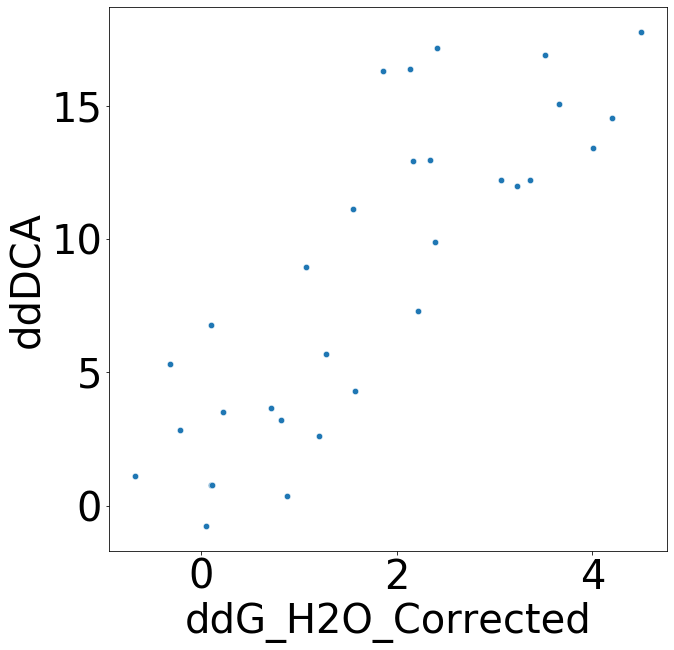

In [18]:
plt.figure(figsize=(10,10))
sns.scatterplot(data=merged_pdz_morcos_protein_dataframe,y="ddDCA",x="ddG_H2O_Corrected",s=40)

## PDZ (1GM1_A) ddAWSEM vs. ddG

In [19]:
X=pdz_morcos_protein_dataframe["ddG_H2O_Corrected"]
Y=pdz_morcos_protein_dataframe["Burial+Contact"]
regr = sm.OLS(Y,X)
results=regr.fit()
results.params, ((X*Y).sum())/(X*X).sum(),(sum((X-(Y*(1/0.71)))**2))

(ddG_H2O_Corrected    0.711552
 dtype: float64,
 0.7115518385937951,
 46.93623814719324)

In [20]:
X=pdz_morcos_protein_dataframe["ddG_H2O_Corrected"]
Y=pdz_morcos_protein_dataframe["Burial+Contact"]
regr = sm.OLS(X,Y)
results=regr.fit()
results.params, ((X*Y).sum())/(Y*Y).sum(), (sum((X-(Y*1.08))**2))

(Burial+Contact    1.083677
 dtype: float64,
 1.0836765475599606,
 36.03528704000005)

Pearson Coefficient=0.7256193094021157


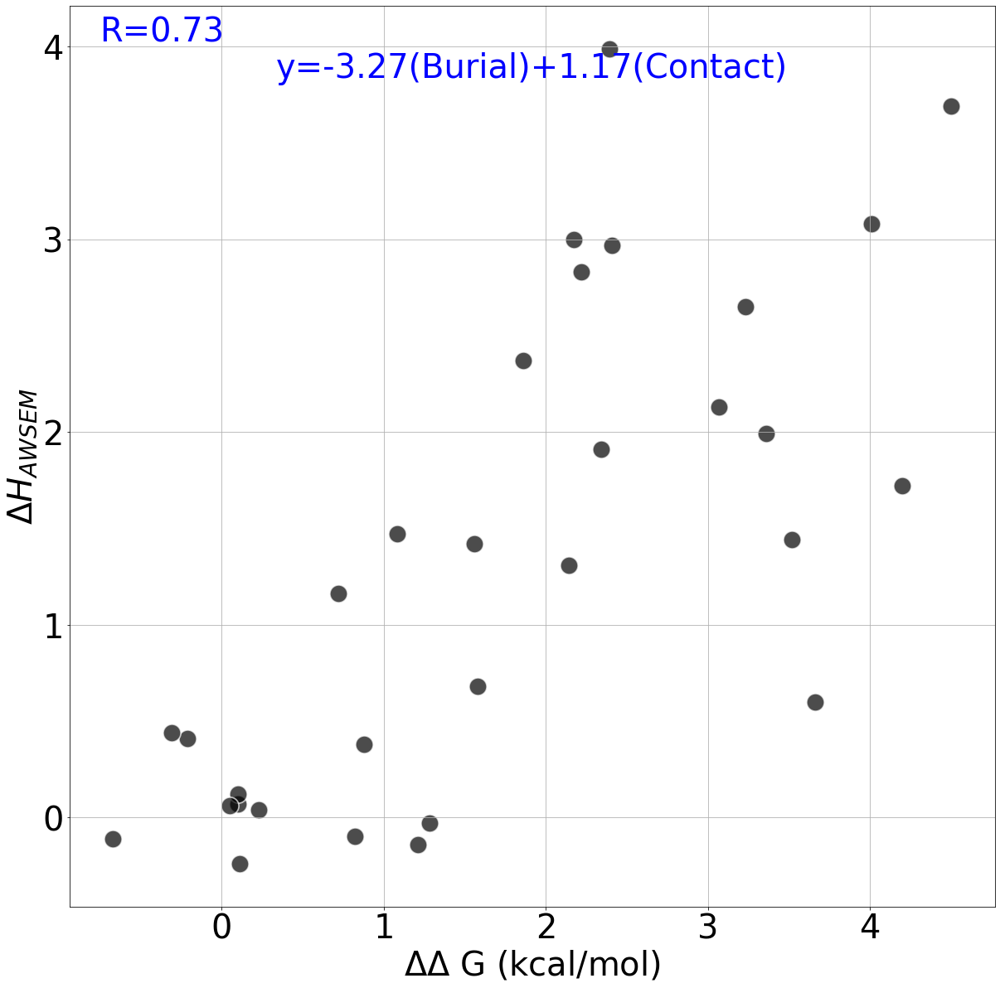

Pearson Coefficient=0.6755718471529699


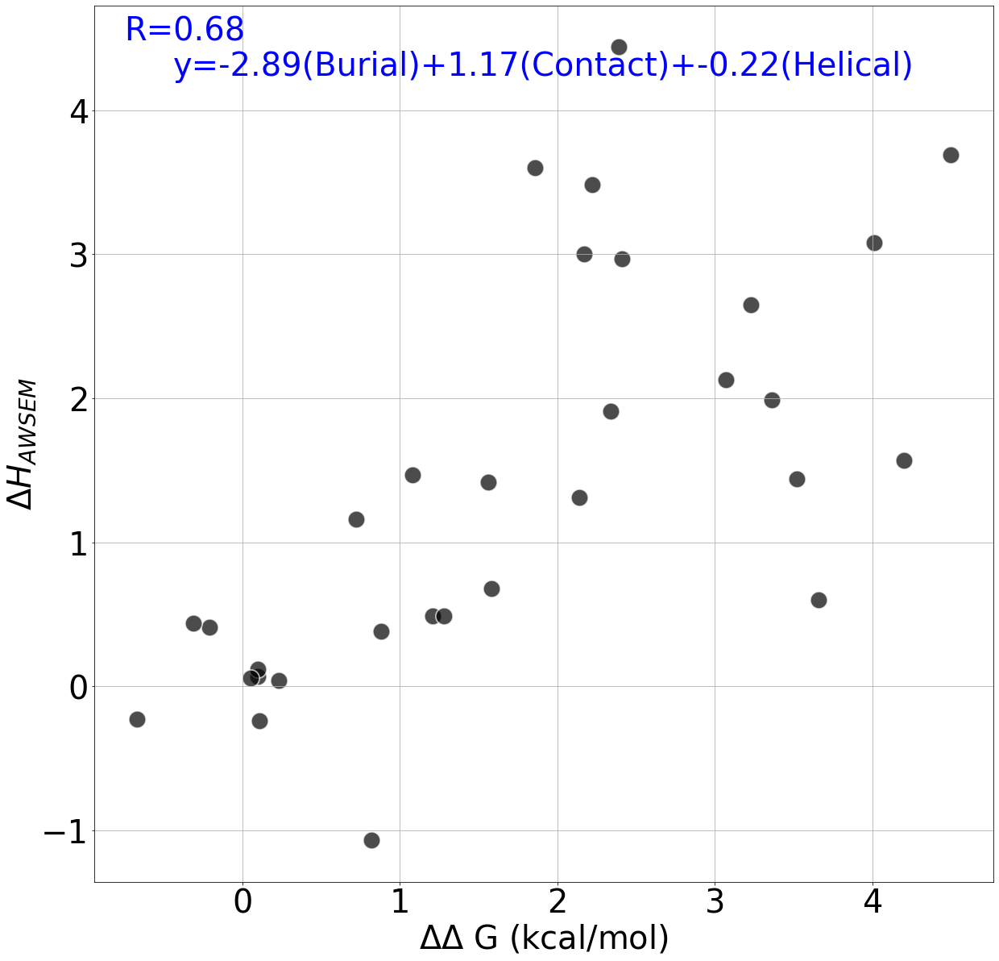

Pearson Coefficient=0.6500087899602695


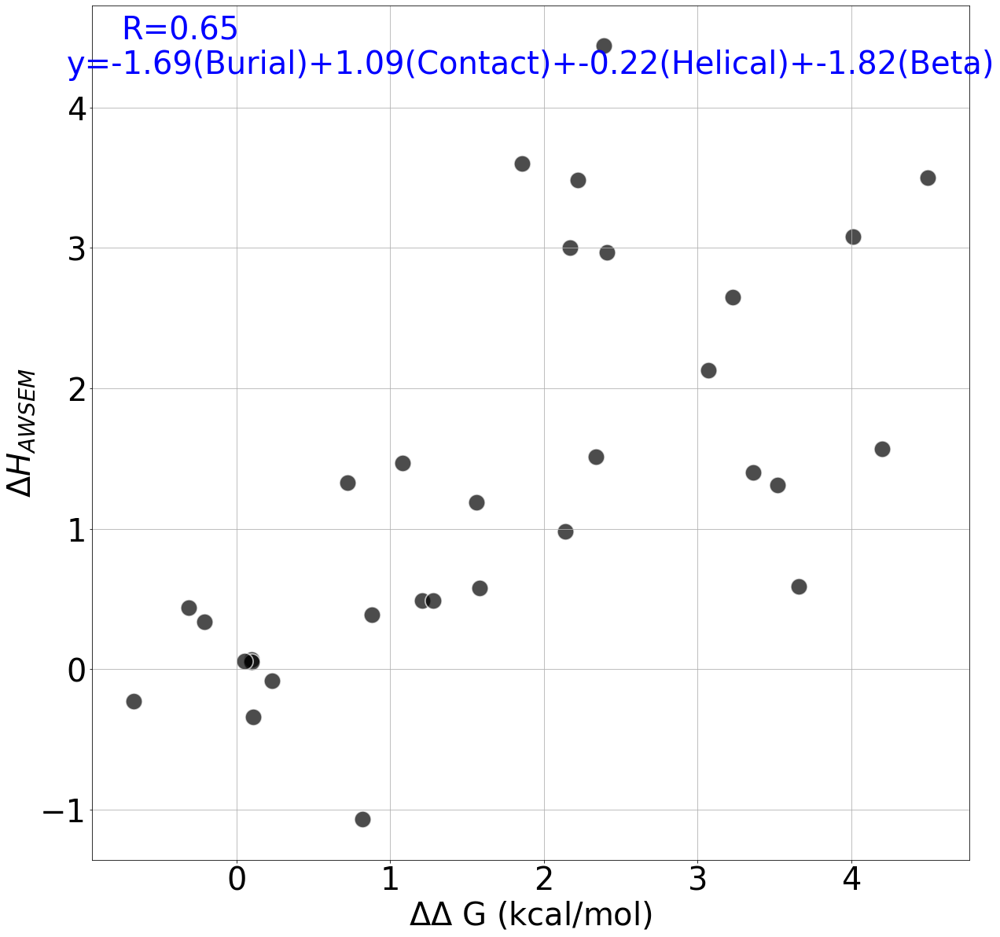

Pearson Coefficient=0.7256193094021156


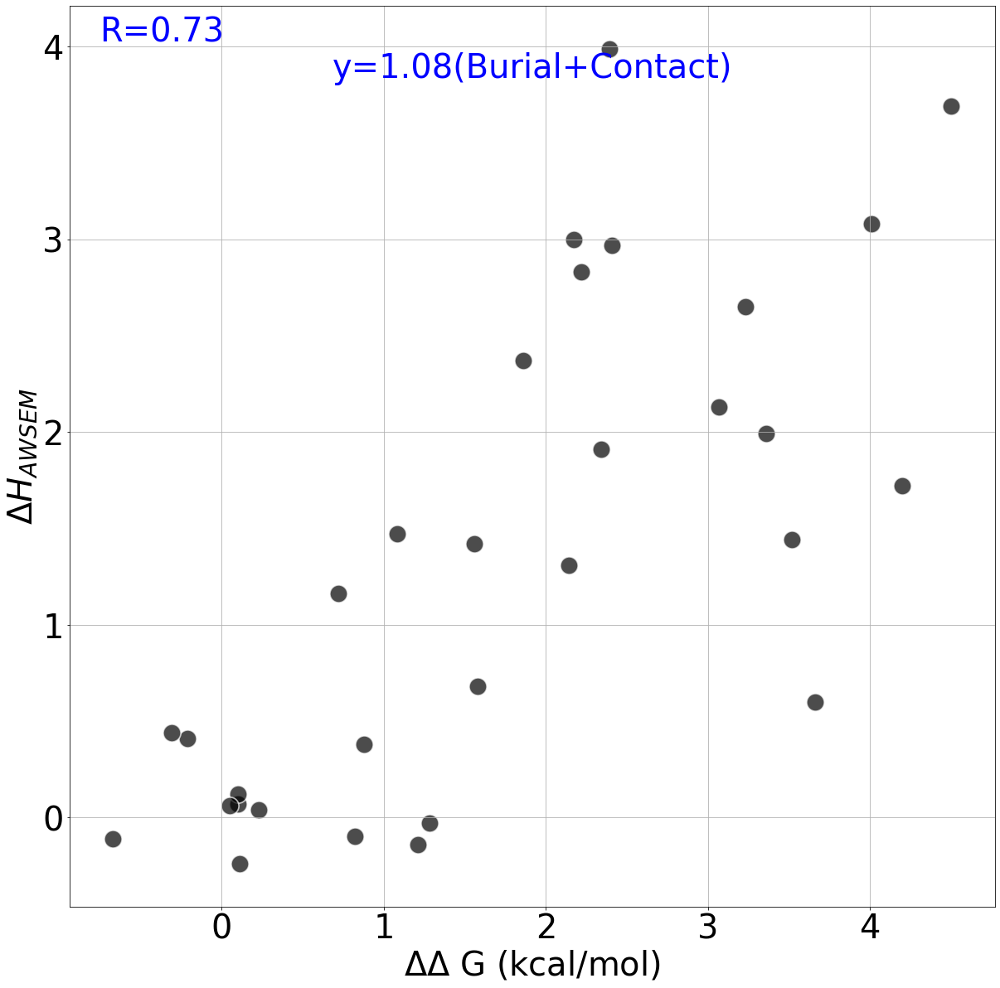

Pearson Coefficient=0.6755718471529693


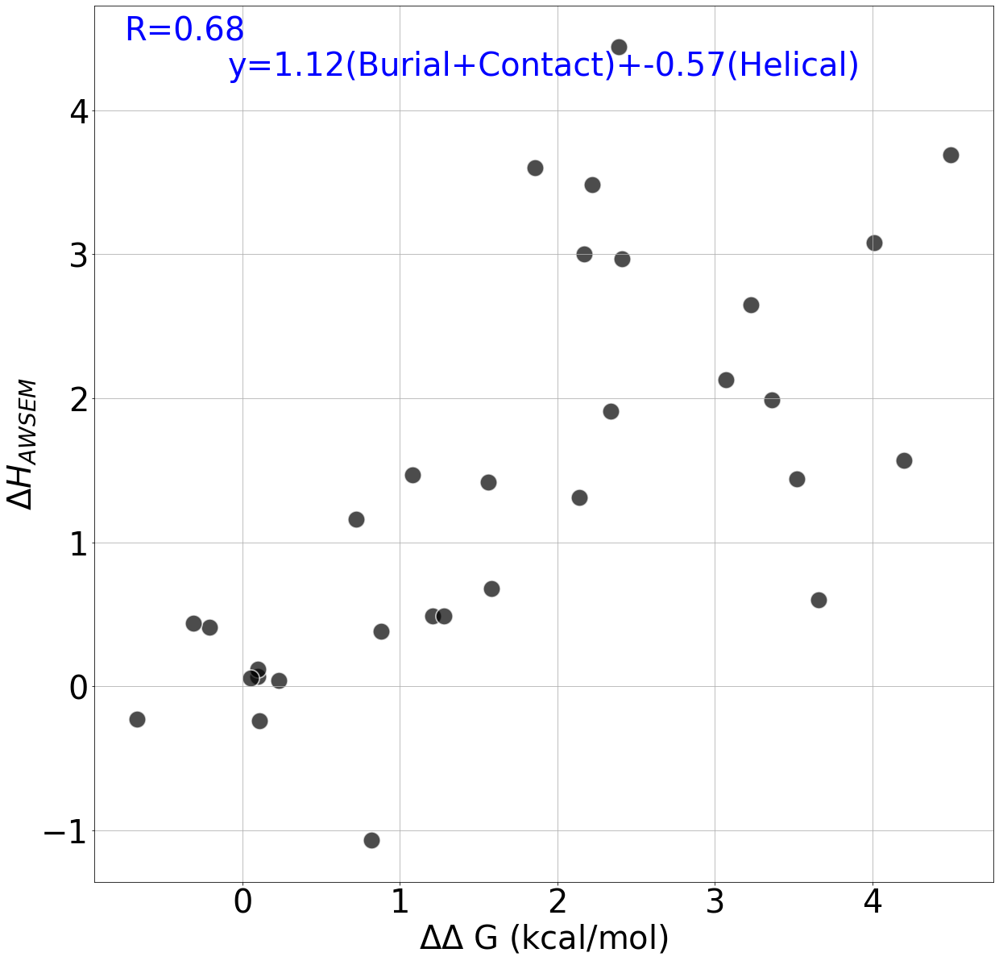

Pearson Coefficient=0.6500087899602689


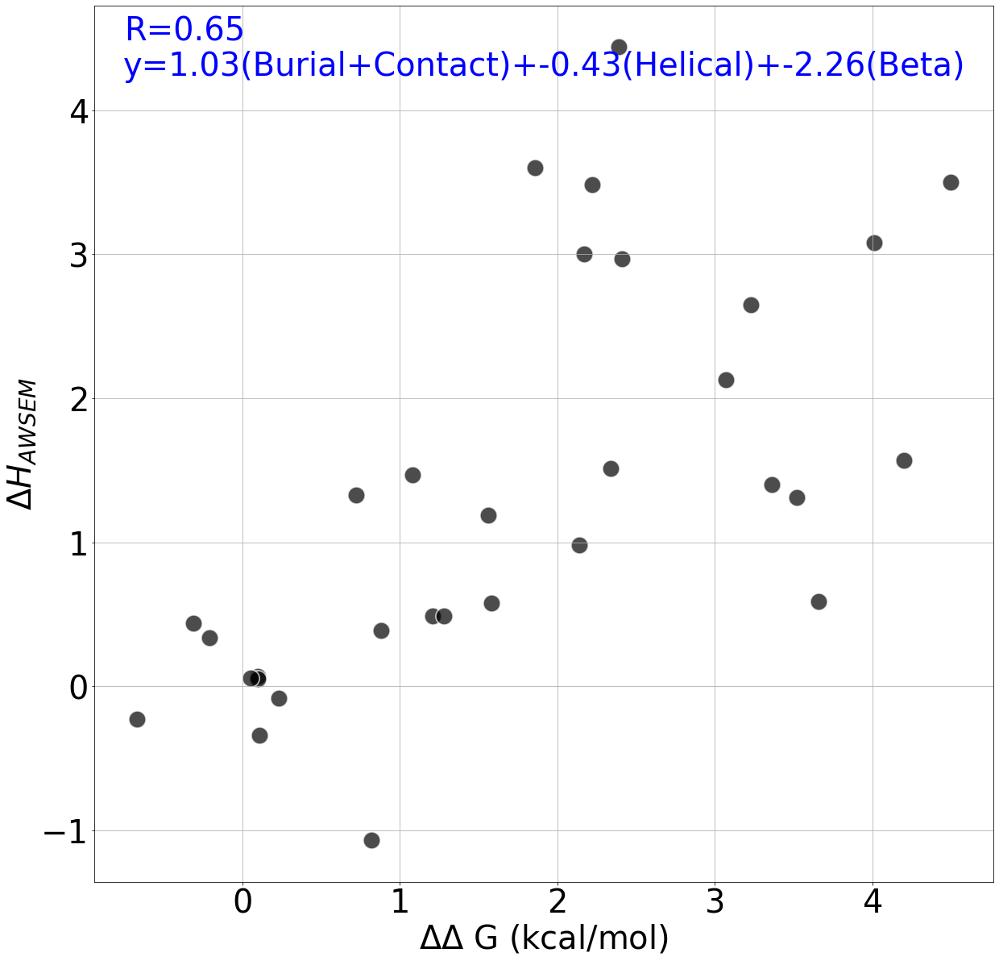

In [21]:
for awsem_terms in awsem_term_combinations:
    ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(pdz_morcos_protein_dataframe,
                                         awsem_terms,f"1GM1_{('_').join(awsem_terms)}",
                                         analysis_directory=morcos_S1_ddG_ddAWSEM_directory,
                                        ddAWSEM_calculation_type=ddAWSEM_calculation_type)

# Figure S6: ddAWSEM vs. ddG

## Using Morcos Uniprot IDs
Analyzing PDB Monomers Measured Near Physiological Conditions

In [22]:
if not os.path.exists(f"{morcos_S6_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_ddAWSEM_ddG_Values.txt"):
    all_morcos_protein_dataframe,all_morcos_protein_values_dataframe=calculate_all_pdb_ddAWSEM(select_PDBs=None,
                                                                                              analysis_directory=morcos_S6_ddG_ddAWSEM_directory)
    all_morcos_protein_dataframe.to_csv(f"{morcos_S6_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_ddAWSEM_ddG_Values.txt")
    all_morcos_protein_values_dataframe.to_csv(f"{morcos_S6_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_ddAWSEM_ddG_Coefficients.txt")
else:
    all_morcos_protein_dataframe=pd.read_csv(f"{morcos_S6_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_ddAWSEM_ddG_Values.txt")
    all_morcos_protein_values_dataframe=pd.read_csv(f"{morcos_S6_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_ddAWSEM_ddG_Coefficients.txt")

In [23]:
all_morcos_protein_dataframe_copy=all_morcos_protein_dataframe.copy()
#Renaming enteries to properly account for entry duplicates
all_morcos_protein_dataframe_copy.loc[all_morcos_protein_dataframe_copy["PROTEIN"]=="Maltose binding protein","PROTEIN"]="Maltose-binding protein"
all_morcos_protein_dataframe_copy.loc[all_morcos_protein_dataframe_copy["PROTEIN"]=="Alpha1-antitrypsin","PROTEIN"]="Alpha 1-antitrypsin"
all_morcos_protein_dataframe_copy.loc[all_morcos_protein_dataframe_copy["PROTEIN"]=="FK binding protein","PROTEIN"]="FK506 binding protein"
all_morcos_protein_dataframe_copy.loc[all_morcos_protein_dataframe_copy["PROTEIN"]=="Chymotrypsin inhibitor","PROTEIN"]="Chymotrypsin inhibitor 2"
all_morcos_protein_dataframe_copy.loc[all_morcos_protein_dataframe_copy["PROTEIN"]=="Apoflavodoxin","PROTEIN"]="Flavodoxin"
all_morcos_protein_dataframe_copy.loc[all_morcos_protein_dataframe_copy["PROTEIN"]=="Intestinal fatty acid binding protein","PROTEIN"]="Fatty acid binding protein"

all_morcos_protein_dataframe_copy=all_morcos_protein_dataframe_copy.loc[~all_morcos_protein_dataframe_copy["SOURCE"].isin(sources_to_avoid_list)]
all_morcos_protein_dataframe_copy=all_morcos_protein_dataframe_copy.loc[~all_morcos_protein_dataframe_copy["PROTEIN"].isin(proteins_to_avoid_list)]
all_morcos_protein_dataframe_copy=all_morcos_protein_dataframe_copy.loc[~all_morcos_protein_dataframe_copy["REMARKS"].isin(remarks_to_avoid_list)]
all_morcos_protein_dataframe_copy=all_morcos_protein_dataframe_copy.loc[~all_morcos_protein_dataframe_copy["REMARKS"].str.contains("intermediate",na=False)]
all_morcos_protein_dataframe_copy=all_morcos_protein_dataframe_copy.loc[~all_morcos_protein_dataframe_copy["REMARKS"].str.contains("holo",na=False)]
all_morcos_protein_dataframe_copy=all_morcos_protein_dataframe_copy.loc[~all_morcos_protein_dataframe_copy["KEY_WORDS"].str.contains("membrane",na=False)]

all_morcos_protein_dataframe_copy["PDB_Name"]=all_morcos_protein_dataframe_copy["PDB_wild"]+"_"+all_morcos_protein_dataframe_copy["MUTATED_CHAIN"]

In [24]:
all_morcos_protein_dataframe_copy_conditions=all_morcos_protein_dataframe_copy.loc[((all_morcos_protein_dataframe_copy["T"].between(20,40)) & 
                                                                                    (all_morcos_protein_dataframe_copy["pH"].between(6,8)) &
                                                                                   (all_morcos_protein_dataframe_copy["EXPERIMENTAL_METHOD"].isin(['SOLUTION NMR', 'X-RAY DIFFRACTION'])) &
                                                                                   (all_morcos_protein_dataframe_copy["STATE"].isin([np.nan, 2])))]

all_morcos_protein_dataframe_copy_conditions=all_morcos_protein_dataframe_copy_conditions.drop_duplicates(["PROTEIN","MUTATION","pH","T"])
len(all_morcos_protein_dataframe_copy_conditions)

971

Pearson Coefficient=0.33569409865134603


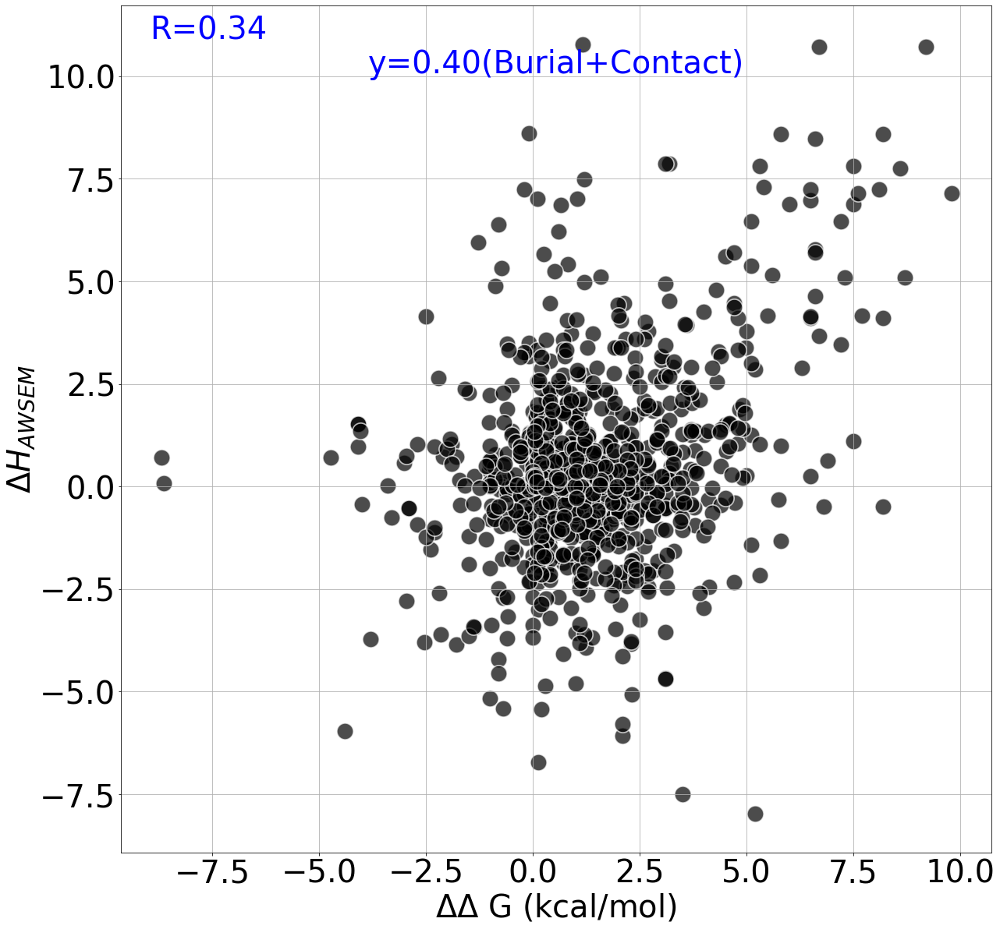

In [25]:
ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(all_morcos_protein_dataframe_copy_conditions,
                                     ["Burial+Contact"],"All_Physiological_PDBs_Burial+Contact",
                                     analysis_directory=morcos_S6_ddG_ddAWSEM_directory)

## Using All ProTherm Single Mutations
Analyzing PDB Monomers Measured Near Physiological Conditions

In [26]:
ddAWSEM_calculation_type="dAWSEM"
if not os.path.exists(f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_{ddAWSEM_calculation_type}_ddG_Values.txt"):
    all_single_mutations_protein_dataframe,all_single_mutations_protein_values_dataframe=calculate_all_pdb_ddAWSEM(select_PDBs=None,
                                                                                                                   analysis_directory=all_single_mutation_S6_ddG_ddAWSEM_directory,
                                                                                                                  ddAWSEM_calculation_type=ddAWSEM_calculation_type)
    all_single_mutations_protein_dataframe.to_csv(f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_{ddAWSEM_calculation_type}_ddG_Values.txt")
    all_single_mutations_protein_values_dataframe.to_csv(f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_{ddAWSEM_calculation_type}_ddG_Coefficients.txt")
else:
    all_single_mutations_protein_dataframe=pd.read_csv(f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_{ddAWSEM_calculation_type}_ddG_Values.txt")
    all_single_mutations_protein_values_dataframe=pd.read_csv(f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/ProTherm_Single_Mutations_{ddAWSEM_calculation_type}_ddG_Coefficients.txt")

In [27]:
all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe.copy()
#Renaming enteries to properly account for entry duplicates
all_single_mutations_protein_dataframe_copy.loc[all_single_mutations_protein_dataframe_copy["PROTEIN"]=="Maltose binding protein","PROTEIN"]="Maltose-binding protein"
all_single_mutations_protein_dataframe_copy.loc[all_single_mutations_protein_dataframe_copy["PROTEIN"]=="Alpha1-antitrypsin","PROTEIN"]="Alpha 1-antitrypsin"
all_single_mutations_protein_dataframe_copy.loc[all_single_mutations_protein_dataframe_copy["PROTEIN"]=="FK binding protein","PROTEIN"]="FK506 binding protein"
all_single_mutations_protein_dataframe_copy.loc[all_single_mutations_protein_dataframe_copy["PROTEIN"]=="Chymotrypsin inhibitor","PROTEIN"]="Chymotrypsin inhibitor 2"
all_single_mutations_protein_dataframe_copy.loc[all_single_mutations_protein_dataframe_copy["PROTEIN"]=="Apoflavodoxin","PROTEIN"]="Flavodoxin"
all_single_mutations_protein_dataframe_copy.loc[all_single_mutations_protein_dataframe_copy["PROTEIN"]=="Intestinal fatty acid binding protein","PROTEIN"]="Fatty acid binding protein"
###
all_single_mutations_protein_dataframe_copy["PDB_Name"]=all_single_mutations_protein_dataframe_copy["PDB_wild"]+"_"+all_single_mutations_protein_dataframe_copy["MUTATED_CHAIN"]
all_single_mutations_protein_dataframe_copy["Original_Residue"]=all_single_mutations_protein_dataframe_copy["MUTATION"].str.split().str[0]
all_single_mutations_protein_dataframe_copy["Mutation_Residue"]=all_single_mutations_protein_dataframe_copy["MUTATION"].str.split().str[2]
###
#Remove entries for proteins that aren't described by 2-state folding.
all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe_copy.loc[~all_single_mutations_protein_dataframe_copy["SOURCE"].isin(sources_to_avoid_list)]
all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe_copy.loc[~all_single_mutations_protein_dataframe_copy["PROTEIN"].isin(proteins_to_avoid_list)]
all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe_copy.loc[~all_single_mutations_protein_dataframe_copy["REMARKS"].isin(remarks_to_avoid_list)]
all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe_copy.loc[~all_single_mutations_protein_dataframe_copy["REMARKS"].str.contains("intermediate",na=False)]
all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe_copy.loc[~all_single_mutations_protein_dataframe_copy["REMARKS"].str.contains("holo",na=False)]
all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe_copy.loc[~all_single_mutations_protein_dataframe_copy["KEY_WORDS"].str.contains("membrane",na=False)]
all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe_copy.loc[~all_single_mutations_protein_dataframe_copy["REFERENCE"].str.contains("20798341",na=False)]
all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe_copy.loc[~all_single_mutations_protein_dataframe_copy["REFERENCE"].str.contains("16563433",na=False)]
all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe_copy.loc[~all_single_mutations_protein_dataframe_copy["REFERENCE"].str.contains("8580845",na=False)]
all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe_copy.loc[~((all_single_mutations_protein_dataframe_copy["REFERENCE"].str.contains("7577991",na=False)) 
                                                                                             & (all_single_mutations_protein_dataframe_copy["Mutation_Residue"]=="C"))]
###
#ProTherm database incorrectly quoted ddG signs.
all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"] = np.where(all_single_mutations_protein_dataframe_copy["REFERENCE"].str.contains("9231905"), -all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"], all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"])
all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"] = np.where(all_single_mutations_protein_dataframe_copy["REFERENCE"].str.contains("7490748"), -all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"], all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"])
all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"] = np.where(all_single_mutations_protein_dataframe_copy["REFERENCE"].str.contains("1404368"), -all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"], all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"])
all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"] = np.where(all_single_mutations_protein_dataframe_copy["REFERENCE"].str.contains("8422372"), -all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"], all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"])
all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"] = np.where(all_single_mutations_protein_dataframe_copy["REFERENCE"].str.contains("8660291"), -all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"], all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"])
all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"] = np.where(all_single_mutations_protein_dataframe_copy["REFERENCE"].str.contains("8399139"), -all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"], all_single_mutations_protein_dataframe_copy["ddG_H2O_Corrected"])

In [28]:
#Using AWSEM's hydorphobic and hydrophillic residue assingments.
residue_polarity_dictionary={"Hydrophillic":["R","H","K","D","E","S","T","N","Q","G","P"],
                            "Hydrophobic":["A","V","I","L","M","F","W","C","Y"]}

d = {val:key for key, lst in residue_polarity_dictionary.items() for val in lst}
all_single_mutations_protein_dataframe_copy["Original_Residue_Polarity"]=all_single_mutations_protein_dataframe_copy["Original_Residue"].map(d)
all_single_mutations_protein_dataframe_copy["Mutated_Residue_Polarity"]=all_single_mutations_protein_dataframe_copy["Mutation_Residue"].map(d)
all_single_mutations_protein_dataframe_copy["Mutation_Polarity_Change_Description"]=all_single_mutations_protein_dataframe_copy["Original_Residue_Polarity"]+">"+all_single_mutations_protein_dataframe_copy["Mutated_Residue_Polarity"]
all_single_mutations_protein_dataframe_copy["Mutation_Residue_Change"]=all_single_mutations_protein_dataframe_copy["Original_Residue"]+">"+all_single_mutations_protein_dataframe_copy["Mutation_Residue"]
###
hue_palette={"Hydrophobic>Hydrophillic":"blue","Hydrophillic>Hydrophillic":"red",
                 "Hydrophillic>Hydrophobic":"green","Hydrophobic>Hydrophobic":"orange"}

In [29]:
#Measuring residue's relative exposure using ASA
max_residue_asa_dictionary={"A":121,"R":265,"N":187,"D":187,"C":148,"Q":214,"E":214,"G":97,"H":216,"I":195,
                            "L":191,"K":230,"M":203,"F":228,"P":154,"S":143,"T":163,"W":264,"Y":255,"V":165}

all_single_mutations_protein_dataframe_copy["Max_ASA"]=all_single_mutations_protein_dataframe_copy["Original_Residue"].map(max_residue_asa_dictionary)
all_single_mutations_protein_dataframe_copy["Relative_ASA"]=all_single_mutations_protein_dataframe_copy["ASA"]/all_single_mutations_protein_dataframe_copy["Max_ASA"]

In [30]:
def residue_exposure(x):
    if 0<=float(x["Relative_ASA"])<=.2:
        x["Original_Residue_Exposure"]="Buried"
    elif .2<float(x["Relative_ASA"])<=.4:
        x["Original_Residue_Exposure"]="Partially Exposed"
    else:
        x["Original_Residue_Exposure"]="Exposed"
    return x

all_single_mutations_protein_dataframe_copy=all_single_mutations_protein_dataframe_copy.apply(residue_exposure,axis=1)

In [31]:
residue_molecular_weight_dictionary={"A":89.10,"R":174.20,"N":132.12,"D":133.11,"C":121.16,
                                    "E":147.13,"Q":146.15,"G":75.07,"H":155.16,"O":131.13,
                                    "I":131.18,"L":131.18,"K":146.19,"M":149.21,"F":165.19,
                                    "P":115.13,"U":139.11,"S":105.09,"T":119.12,"W":204.23,
                                    "Y":181.19,"V":117.15}
all_single_mutations_protein_dataframe_copy["Original_Residue_MW"]=all_single_mutations_protein_dataframe_copy["Original_Residue"].map(residue_molecular_weight_dictionary)
all_single_mutations_protein_dataframe_copy["Mutated_Residue_MW"]=all_single_mutations_protein_dataframe_copy["Mutation_Residue"].map(residue_molecular_weight_dictionary)
all_single_mutations_protein_dataframe_copy["Mutation_MW_Change"]=np.abs(all_single_mutations_protein_dataframe_copy["Original_Residue_MW"]-all_single_mutations_protein_dataframe_copy["Mutated_Residue_MW"])

### Filter 1: Duplicate Enteries with Same Experimental Conditions are Averaged

In [32]:
all_single_mutations_protein_dataframe_copy_conditions_filter_1=all_single_mutations_protein_dataframe_copy.loc[((all_single_mutations_protein_dataframe_copy["T"].between(20,40)) & 
                                                                                                        (all_single_mutations_protein_dataframe_copy["pH"].between(6,8)) &
                                                                                                        (all_single_mutations_protein_dataframe_copy["EXPERIMENTAL_METHOD"].isin(['SOLUTION NMR', 'X-RAY DIFFRACTION'])) &
                                                                                                        (all_single_mutations_protein_dataframe_copy["STATE"].isin([np.nan, 2])))]

In [33]:
all_single_mutations_protein_dataframe_copy_conditions_filter_1=all_single_mutations_protein_dataframe_copy_conditions_filter_1.groupby(["PROTEIN","MUTATION","pH","T"]).mean().reset_index()
len(all_single_mutations_protein_dataframe_copy_conditions_filter_1)

865

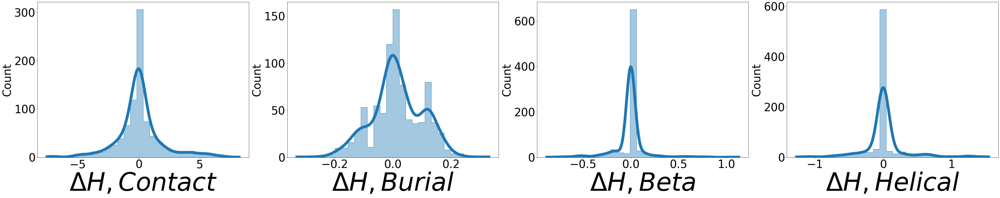

In [34]:
fig,axes=plt.subplots(1,4,figsize=(50,10))

for i,awsem_term in enumerate(["Contact","Burial","Beta","Helical"]):
    sns.histplot(data=all_single_mutations_protein_dataframe_copy_conditions_filter_1,x=awsem_term,
                 ax=axes[i],kde=True,element="step",line_kws={"linewidth":10},alpha=0.4,bins=bins)
    if ddAWSEM_calculation_type=="ddAWSEM":
        axes[i].set_xlabel(fr"$\Delta \Delta H,{awsem_term}$",fontsize=90)
    else:
        axes[i].set_xlabel(fr"$\Delta H,{awsem_term}$",fontsize=90)

plt.tight_layout()
plt.savefig(f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/{ddAWSEM_calculation_type}_Terms_Histograms_Average_Duplicates.png")

Pearson Coefficient=0.3563842174745317


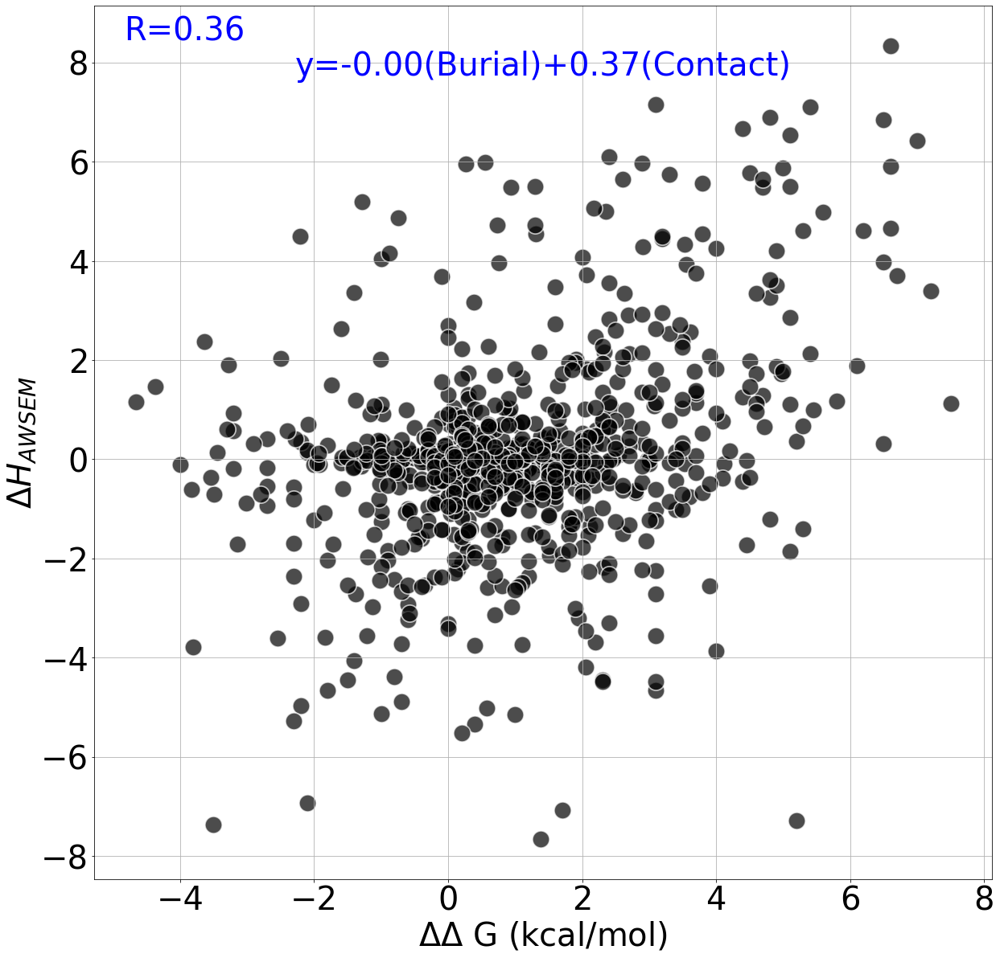

Pearson Coefficient=0.3592517946586658


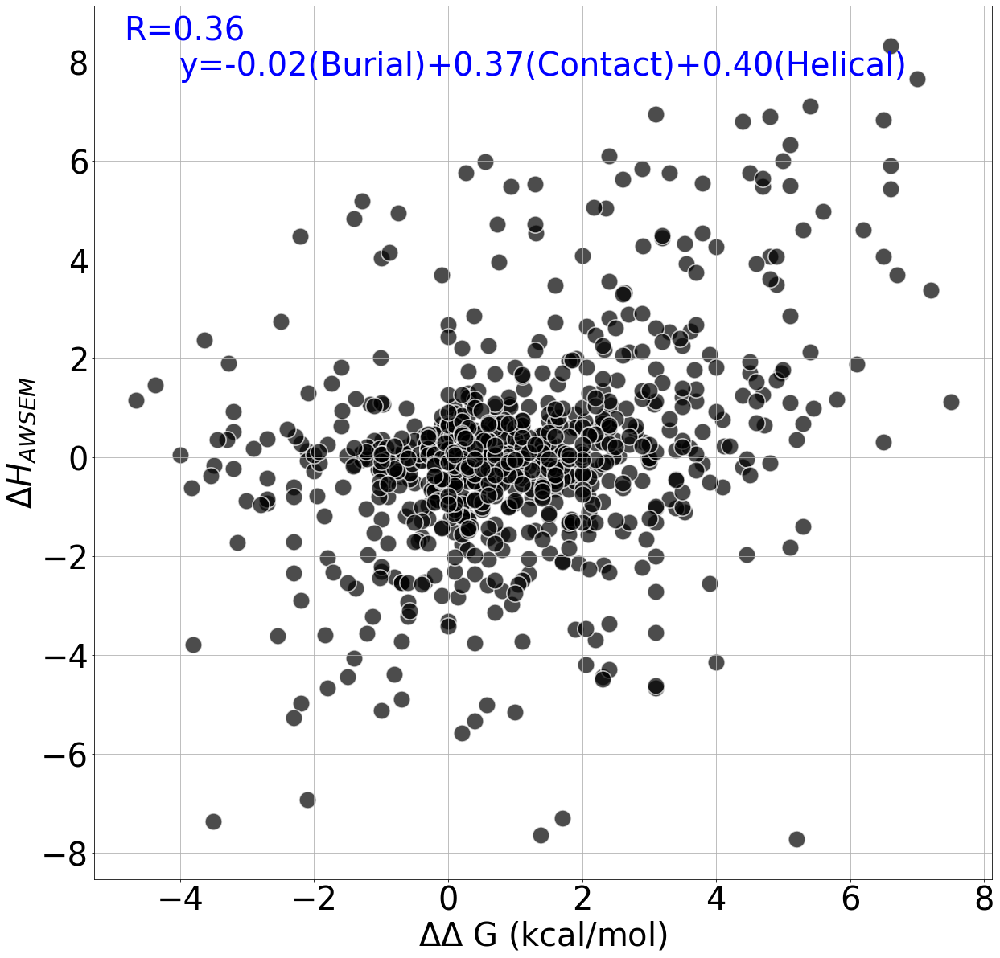

Pearson Coefficient=0.34836587851908546


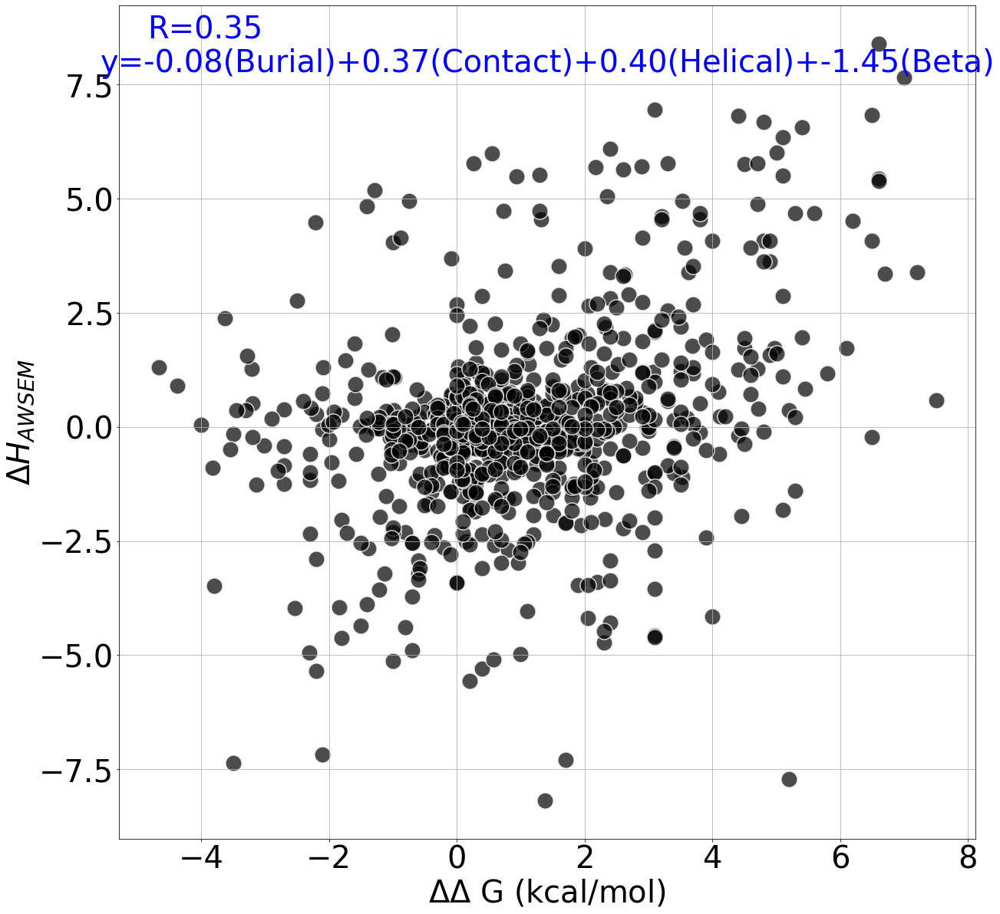

Pearson Coefficient=0.35638421747453103


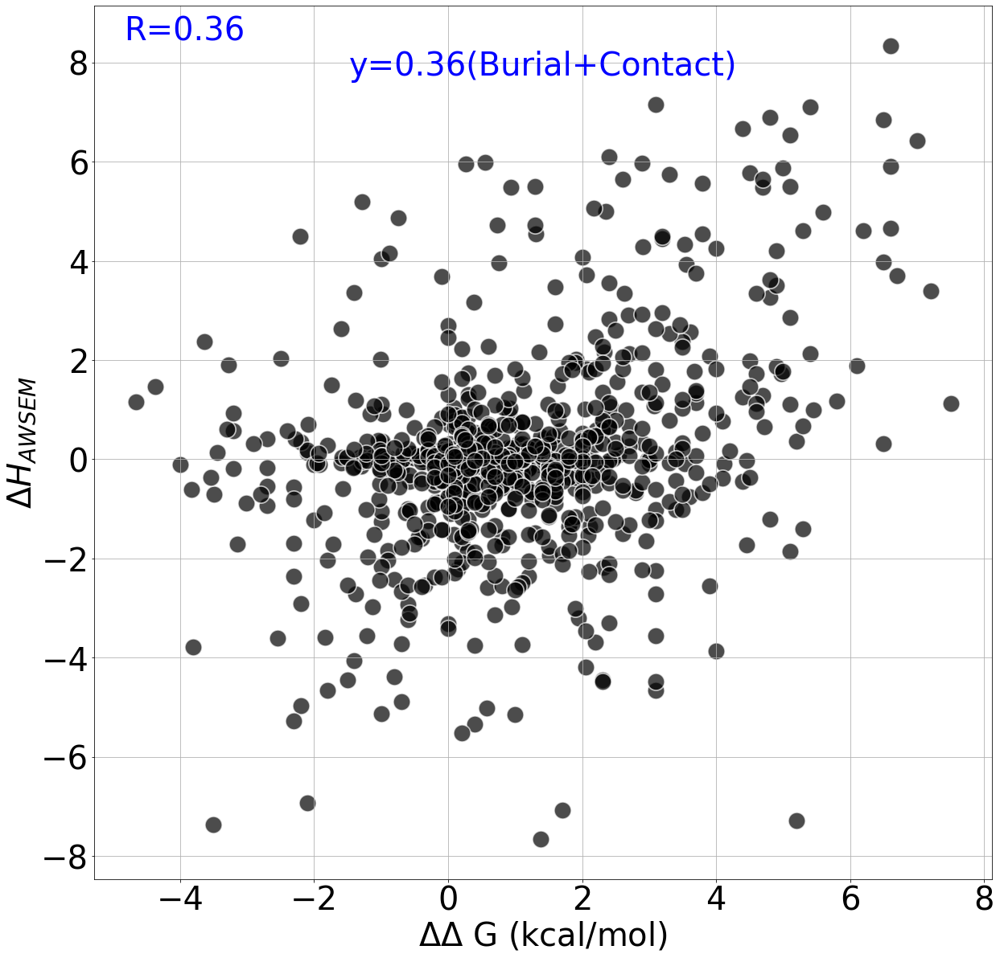

Pearson Coefficient=0.3592517946586651


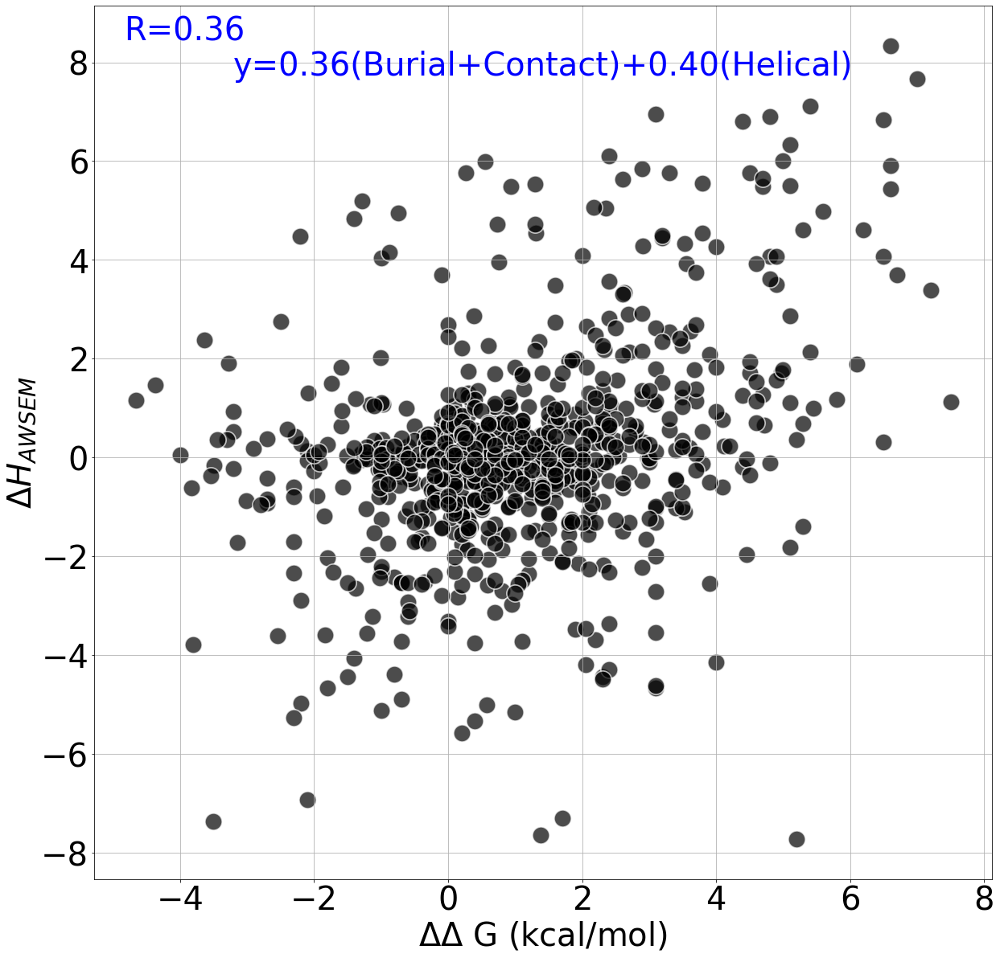

Pearson Coefficient=0.3483658785190848


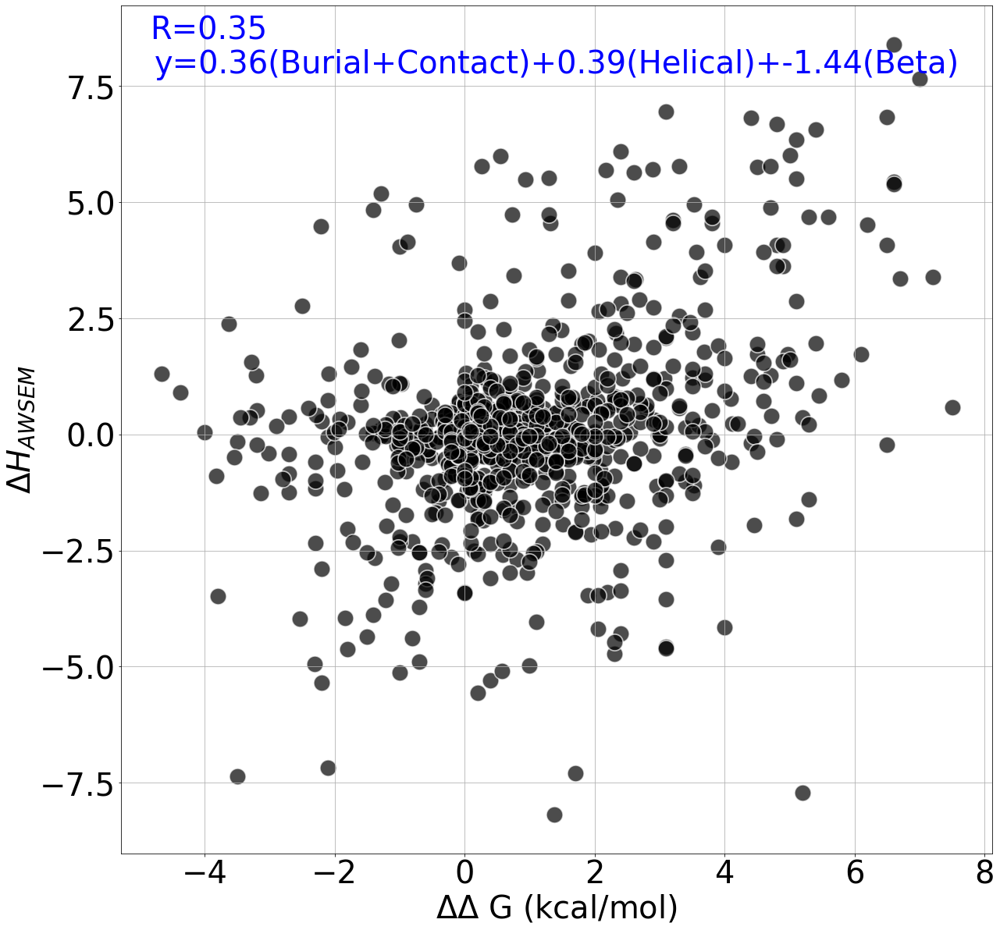

In [35]:
for awsem_terms in awsem_term_combinations:
    ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(all_single_mutations_protein_dataframe_copy_conditions_filter_1,
                                         awsem_terms,f"All_Physiological_PDBs_{('_').join(awsem_terms)}_Average_Duplicates",
                                         analysis_directory=all_single_mutation_S6_ddG_ddAWSEM_directory,
                                        ddAWSEM_calculation_type=ddAWSEM_calculation_type)

### Filter 2: With Only the Largest Dataset Per Protein Used and Duplicate Enteries Filtered

In [36]:
# Grouping dataframe elements by pdb name and each data source. For each pdb, trying to pick only data entries 
# from one experiment with the highest data count.
grouped_pdbs_experiment_highest_count=all_single_mutations_protein_dataframe_copy.groupby(["PROTEIN","REFERENCE"], as_index=False).count().sort_values(by="Steps",ascending=False).drop_duplicates('PROTEIN')
grouped_pdbs_experiment_highest_count=grouped_pdbs_experiment_highest_count.loc[grouped_pdbs_experiment_highest_count["Steps"]>5]
grouped_pdbs_experiment_highest_count_dictionary=pd.Series(grouped_pdbs_experiment_highest_count.REFERENCE.values,index=grouped_pdbs_experiment_highest_count.PROTEIN).to_dict()

all_single_mutations_protein_dataframe_copy_conditions_filter_2=pd.concat([all_single_mutations_protein_dataframe_copy[(all_single_mutations_protein_dataframe_copy['PROTEIN'] == k) & (all_single_mutations_protein_dataframe_copy['REFERENCE']==v)] for k,v in grouped_pdbs_experiment_highest_count_dictionary.items()])

In [37]:
all_single_mutations_protein_dataframe_copy_conditions_filter_2=all_single_mutations_protein_dataframe_copy_conditions_filter_2.loc[((all_single_mutations_protein_dataframe_copy_conditions_filter_2["T"].between(20,40)) & 
                                                                                                        (all_single_mutations_protein_dataframe_copy_conditions_filter_2["pH"].between(6,8)) &
                                                                                                        (all_single_mutations_protein_dataframe_copy_conditions_filter_2["EXPERIMENTAL_METHOD"].isin(['SOLUTION NMR', 'X-RAY DIFFRACTION'])) &
                                                                                                        (all_single_mutations_protein_dataframe_copy_conditions_filter_2["STATE"].isin([np.nan, 2])))]

all_single_mutations_protein_dataframe_copy_conditions_filter_2['pH-pH7'] = all_single_mutations_protein_dataframe_copy_conditions_filter_2['pH'].sub(7).abs()
all_single_mutations_protein_dataframe_copy_conditions_filter_2 = all_single_mutations_protein_dataframe_copy_conditions_filter_2.loc[all_single_mutations_protein_dataframe_copy_conditions_filter_2.groupby(["PROTEIN","MUTATION","T"])['pH-pH7'].idxmin()]

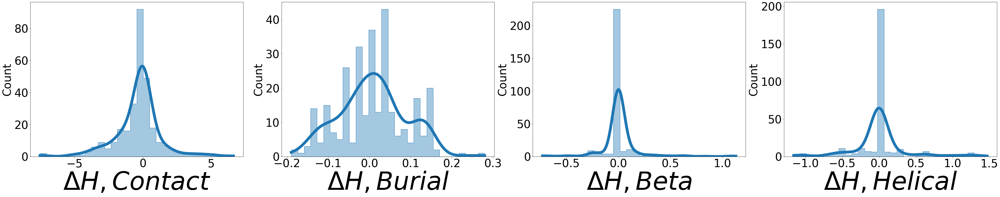

In [38]:
fig,axes=plt.subplots(1,4,figsize=(50,10))

for i,awsem_term in enumerate(["Contact","Burial","Beta","Helical"]):
    sns.histplot(data=all_single_mutations_protein_dataframe_copy_conditions_filter_2,x=awsem_term,
                 ax=axes[i],kde=True,element="step",line_kws={"linewidth":10},alpha=0.4,bins=bins)
    if ddAWSEM_calculation_type=="ddAWSEM":
        axes[i].set_xlabel(fr"$\Delta \Delta H,{awsem_term}$",fontsize=90)
    else:
        axes[i].set_xlabel(fr"$\Delta H,{awsem_term}$",fontsize=90)

plt.tight_layout()
plt.savefig(f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/{ddAWSEM_calculation_type}_Terms_Histograms_PDBs_Largest_Group.png")

Pearson Coefficient=0.32678169259027395


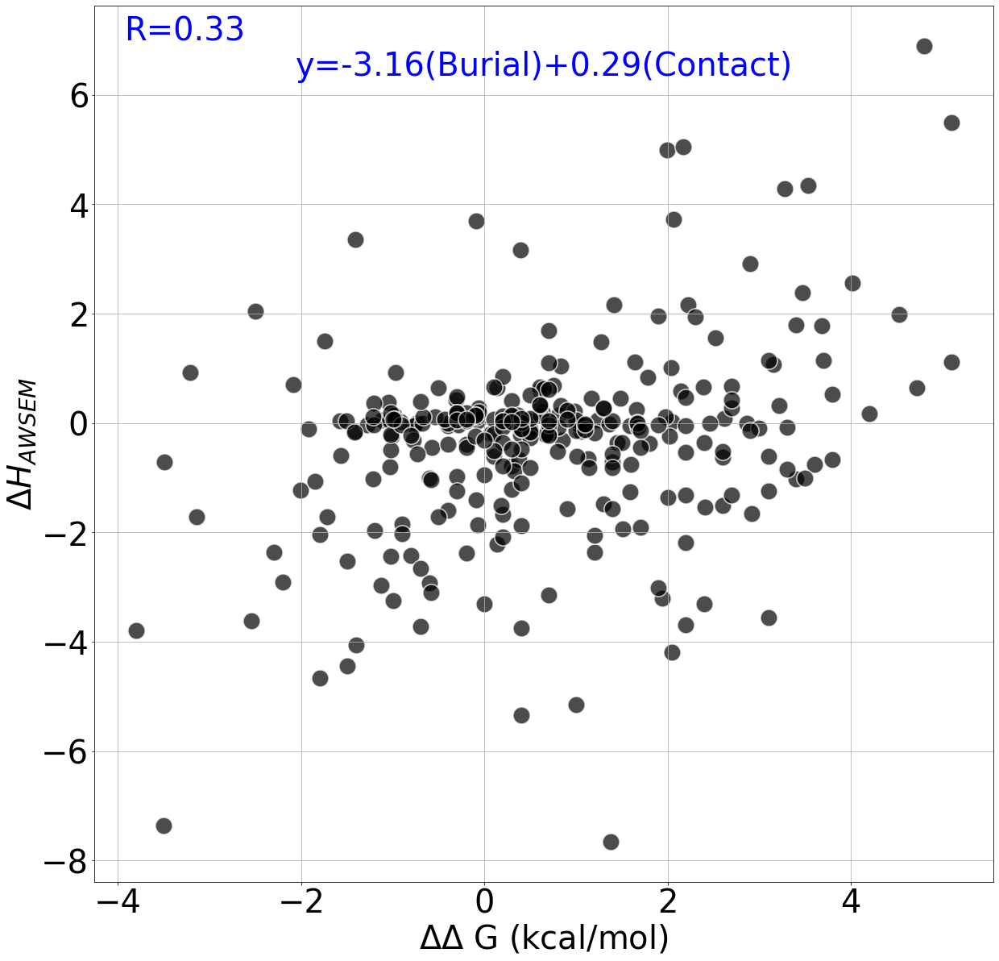

Pearson Coefficient=0.3033388863180697


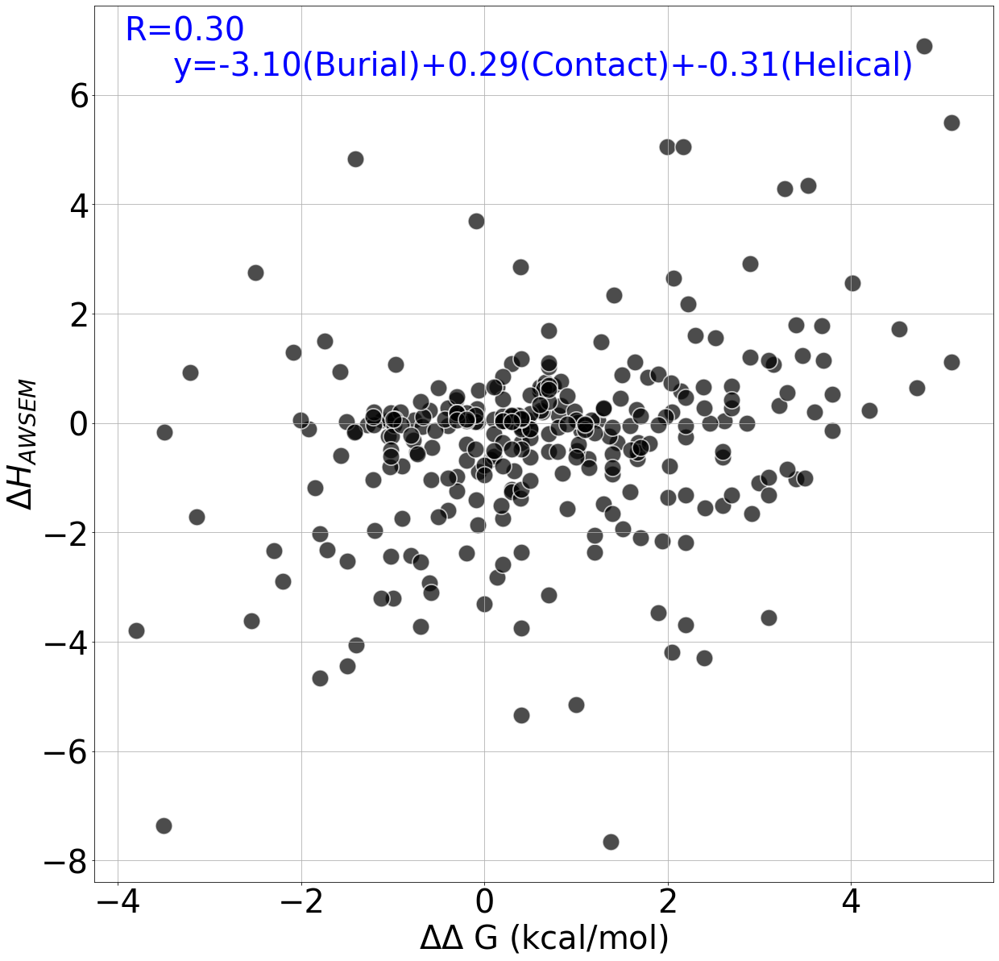

Pearson Coefficient=0.296197227474269


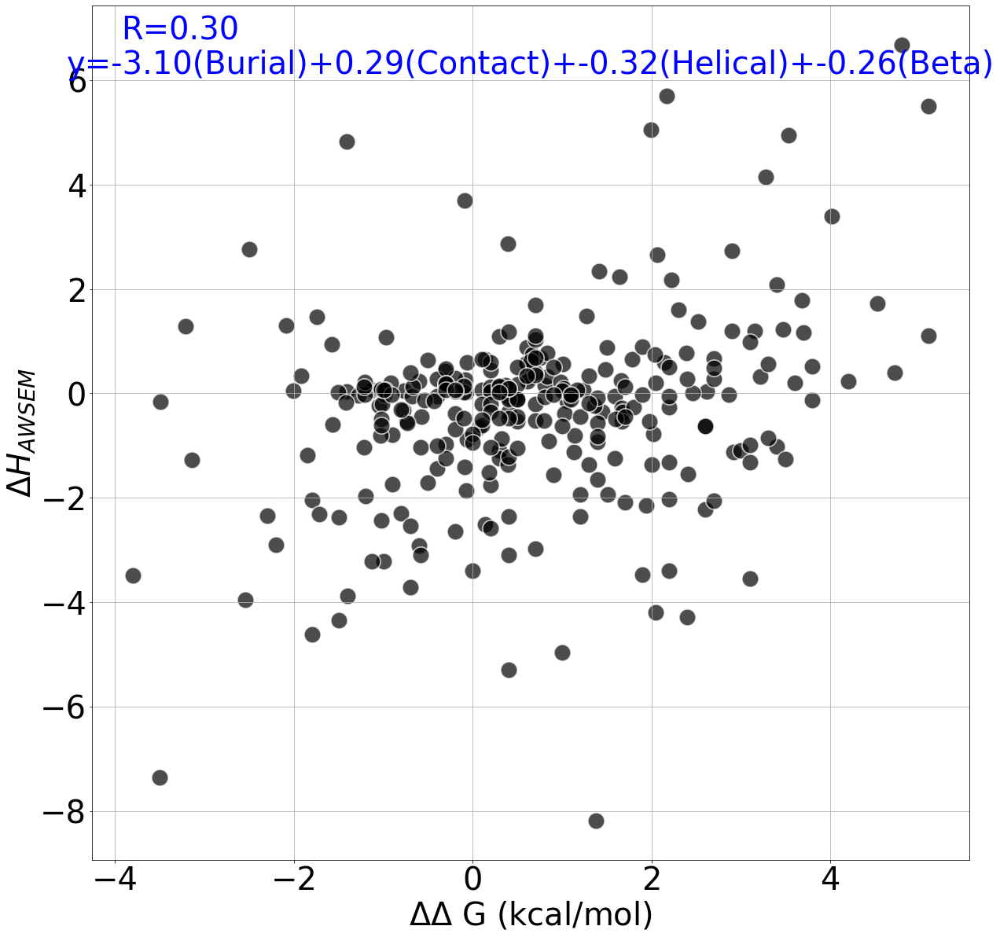

Pearson Coefficient=0.3267816925902733


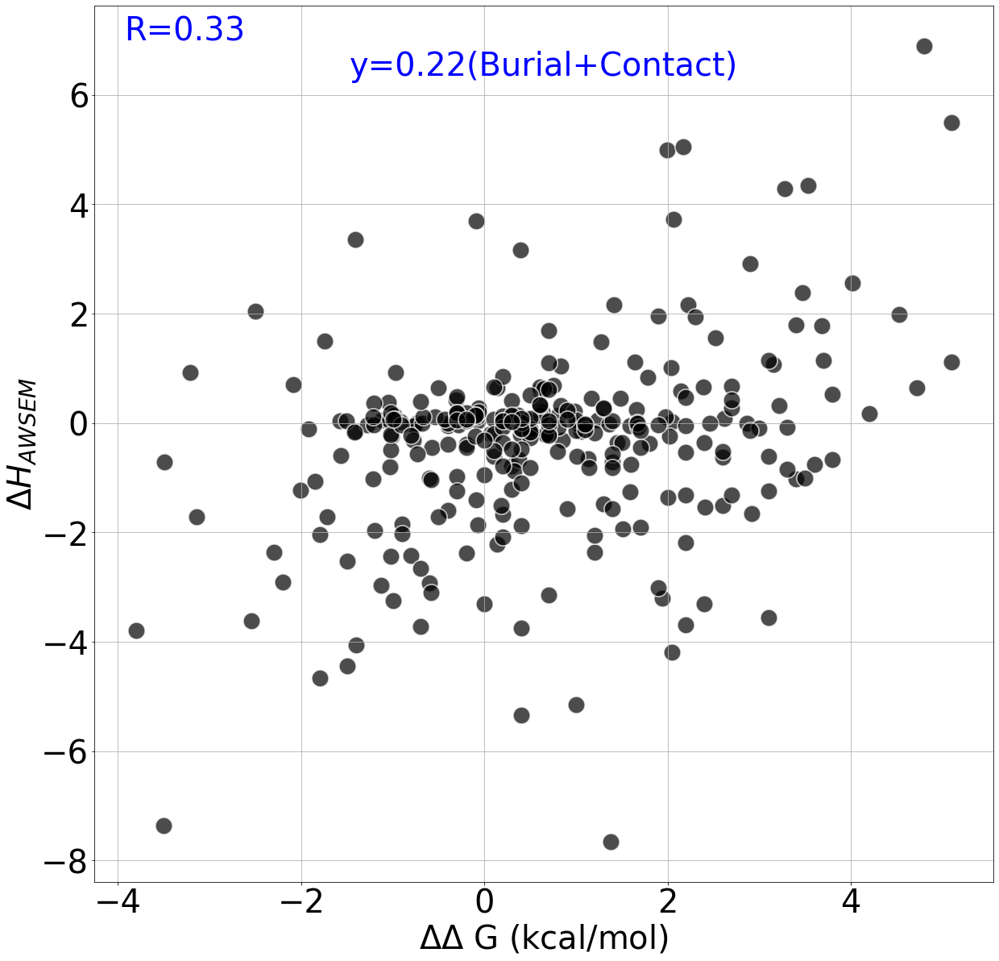

Pearson Coefficient=0.3033388863180689


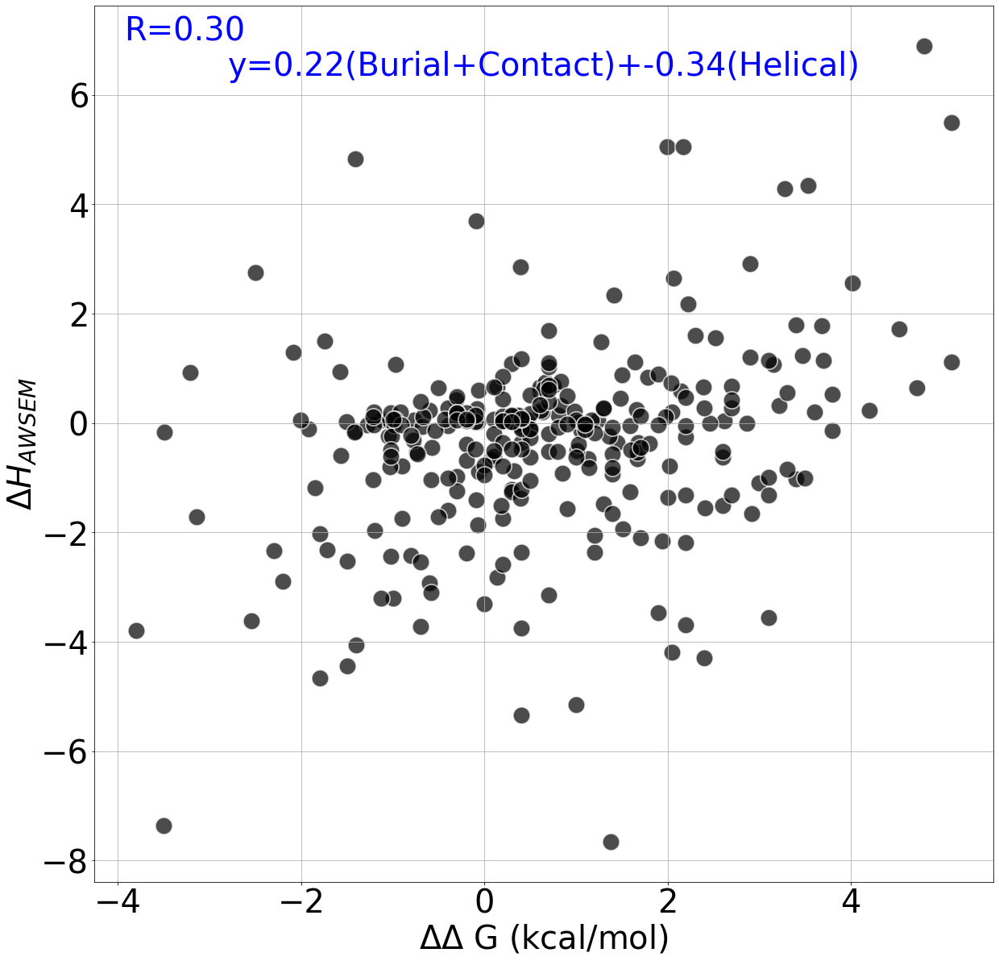

Pearson Coefficient=0.29619722747426813


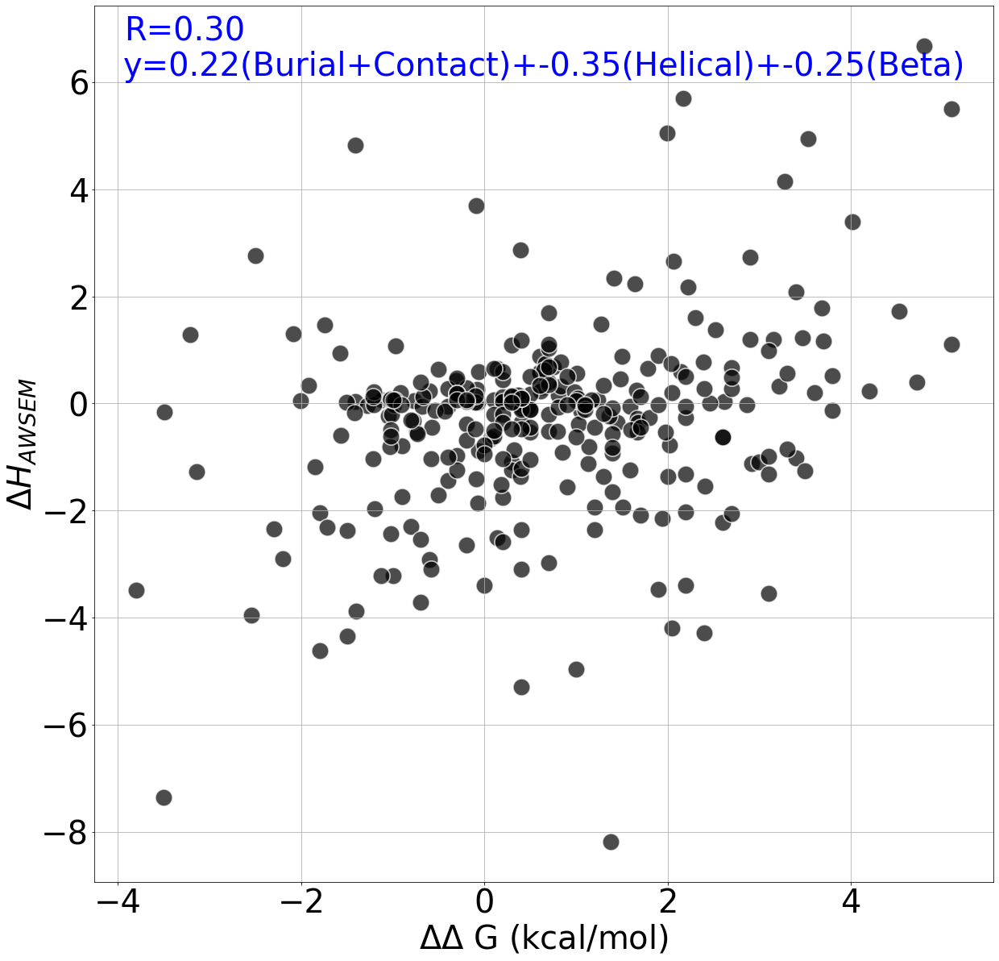

In [39]:
for awsem_terms in awsem_term_combinations:
    ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(all_single_mutations_protein_dataframe_copy_conditions_filter_2,
                                         awsem_terms,f"All_Physiological_PDBs_{('_').join(awsem_terms)}_Largest_Group",
                                         analysis_directory=all_single_mutation_S6_ddG_ddAWSEM_directory,
                                        ddAWSEM_calculation_type=ddAWSEM_calculation_type)

1QLP_A
Pearson Coefficient=0.07265704675346385


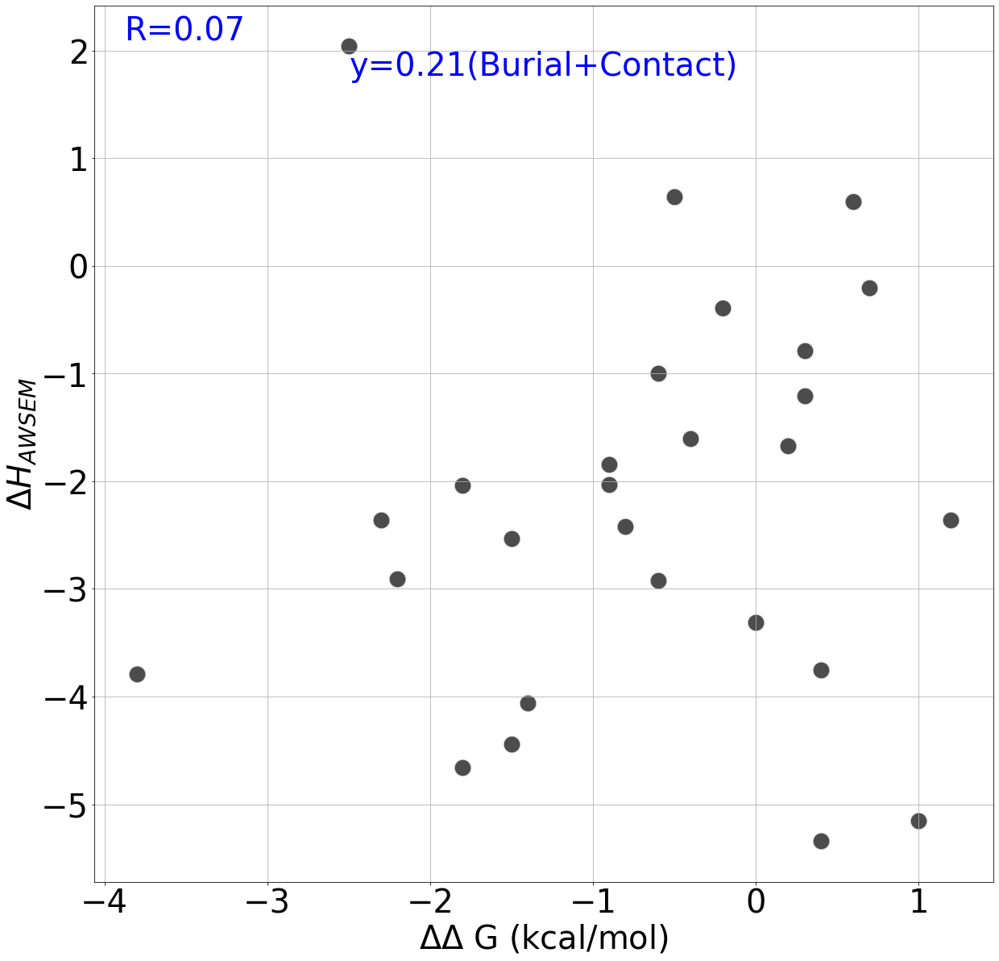

1BNI_A
Pearson Coefficient=0.41787762060992134


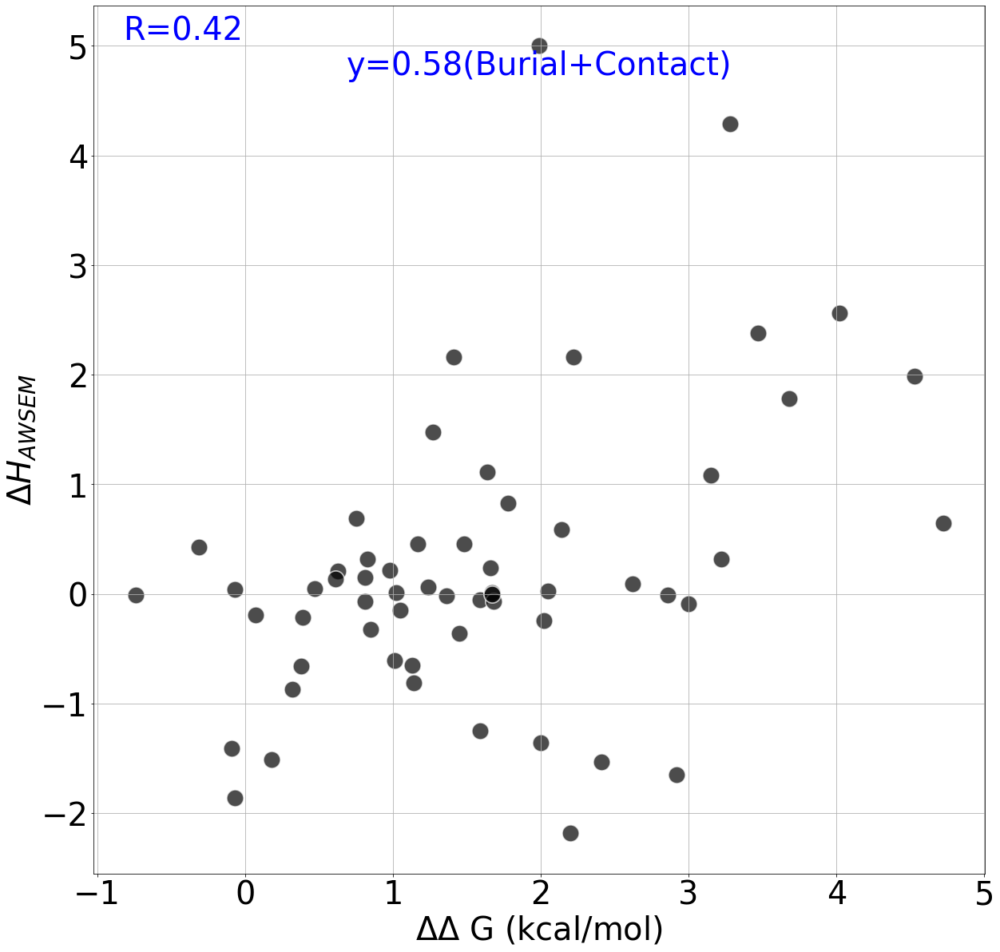

1BTA_A
Pearson Coefficient=0.6683914423096967


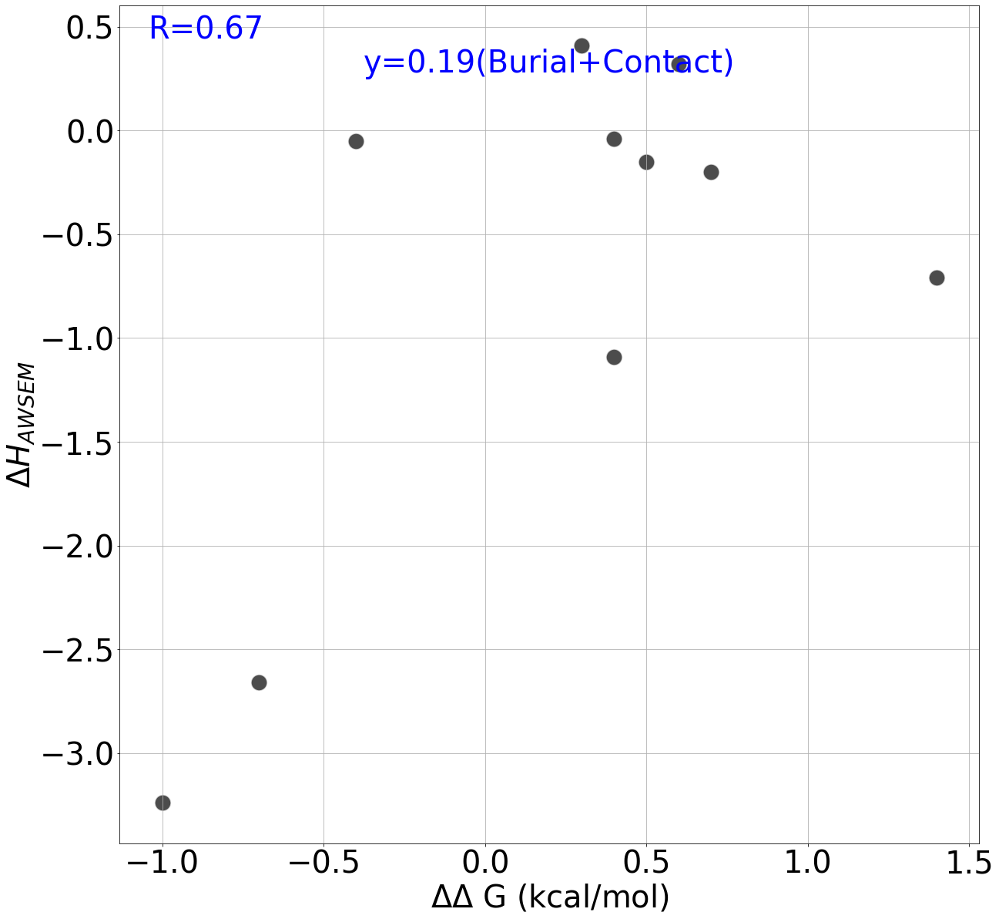

2CI2_I
Pearson Coefficient=0.21938633218591685


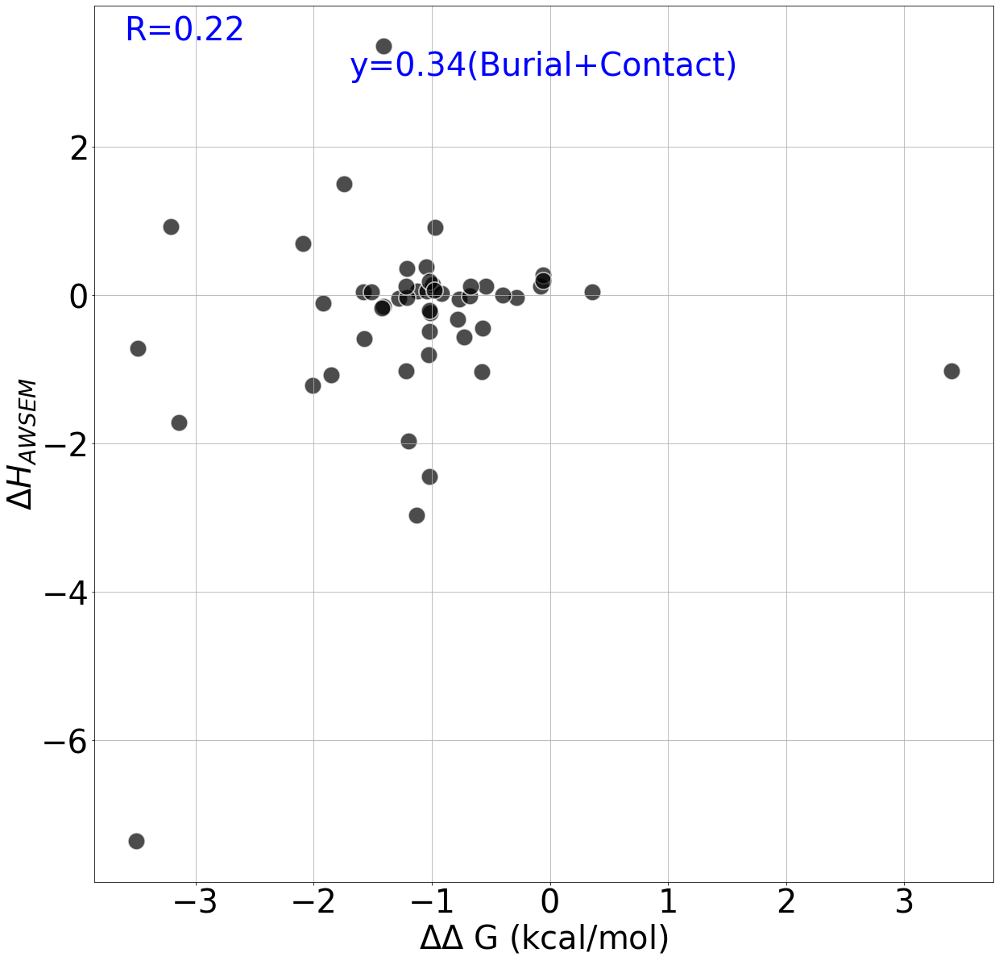

2IFB_A
Pearson Coefficient=0.7560838677734903


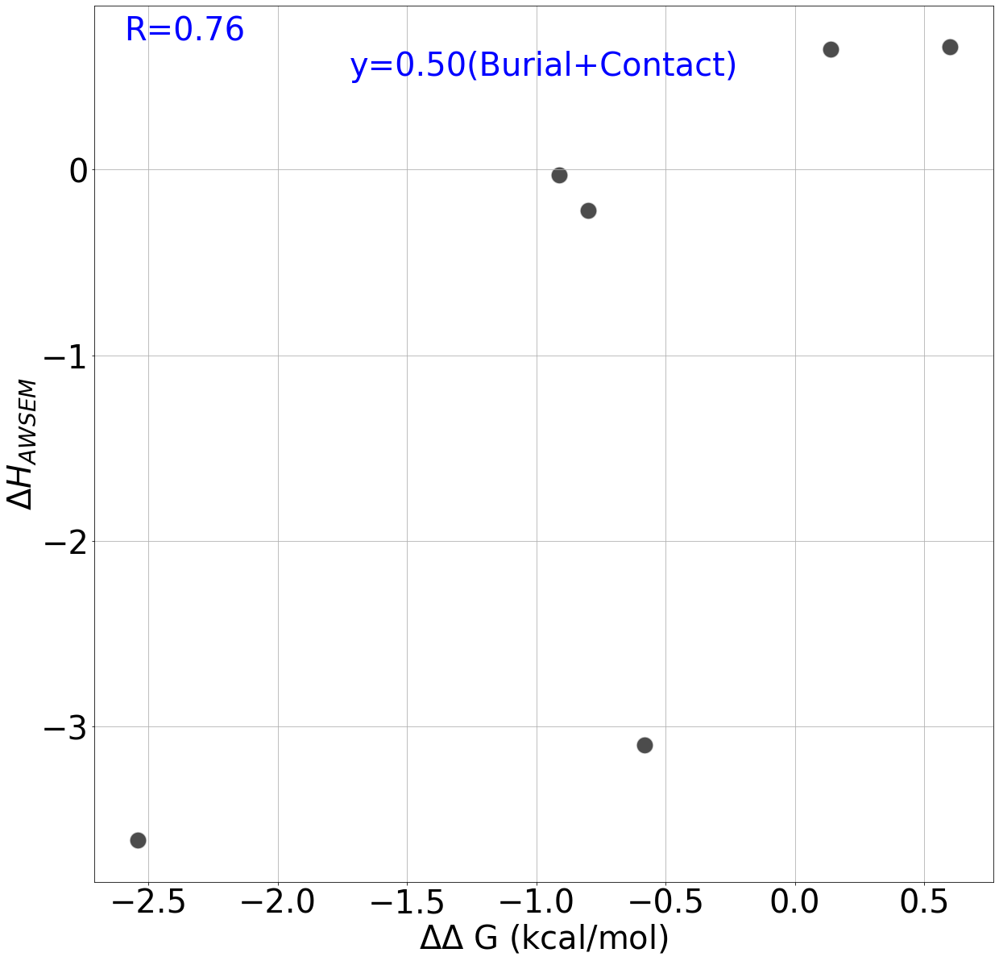

1FTG_A
Pearson Coefficient=0.13491562314472305


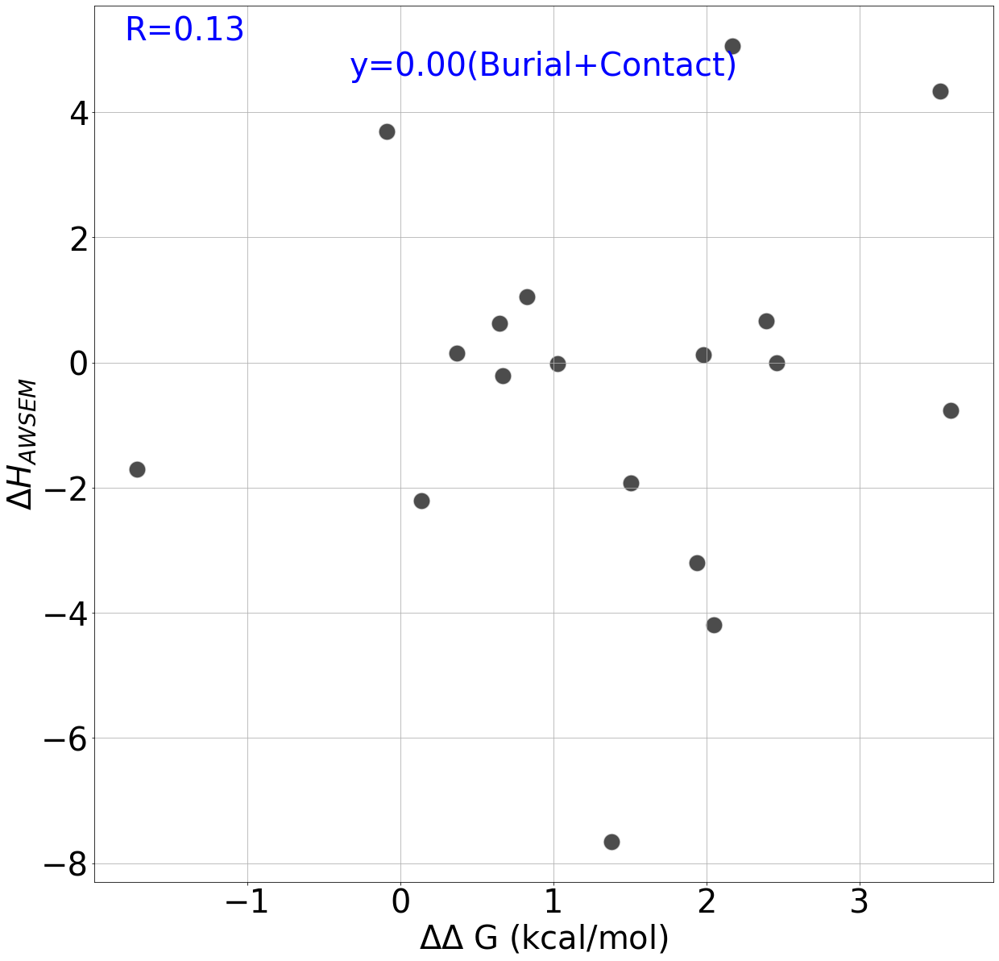

1IOB_A
Pearson Coefficient=0.7432677819126687


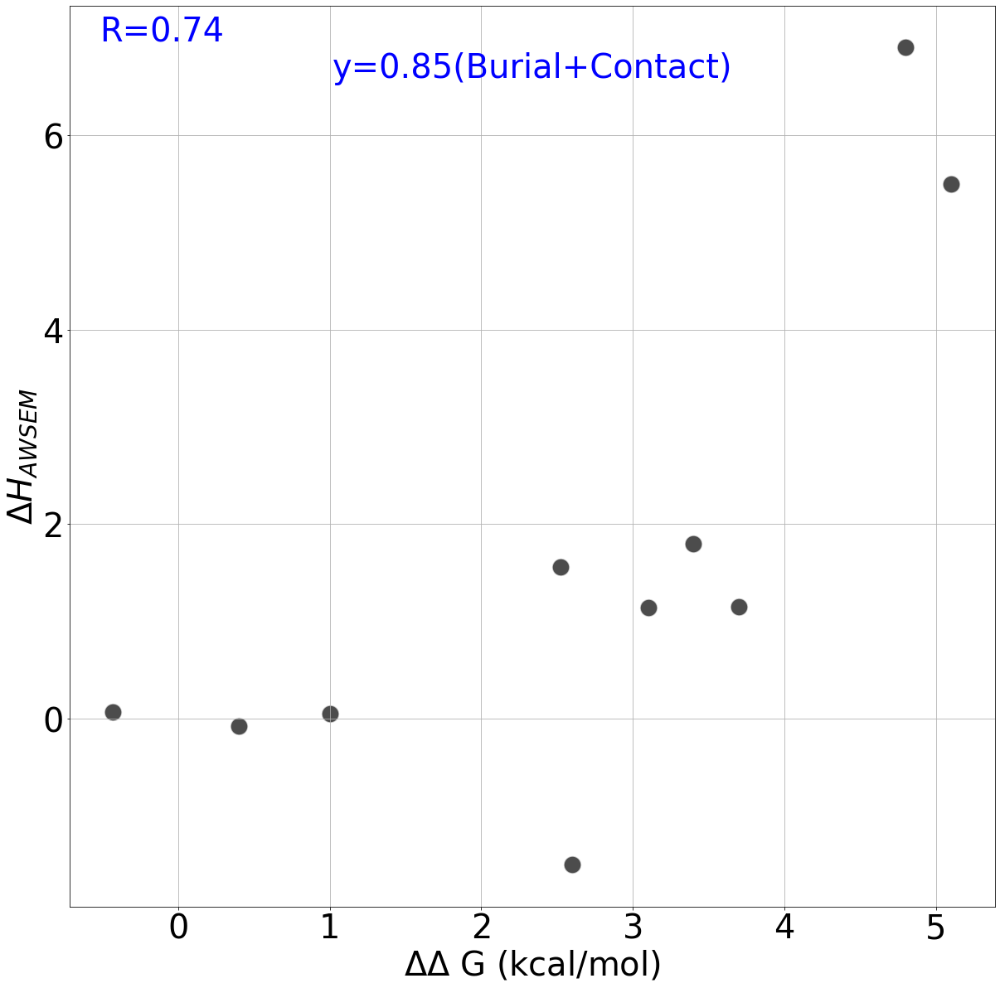

1BVC_A
Pearson Coefficient=-0.3588400152310567


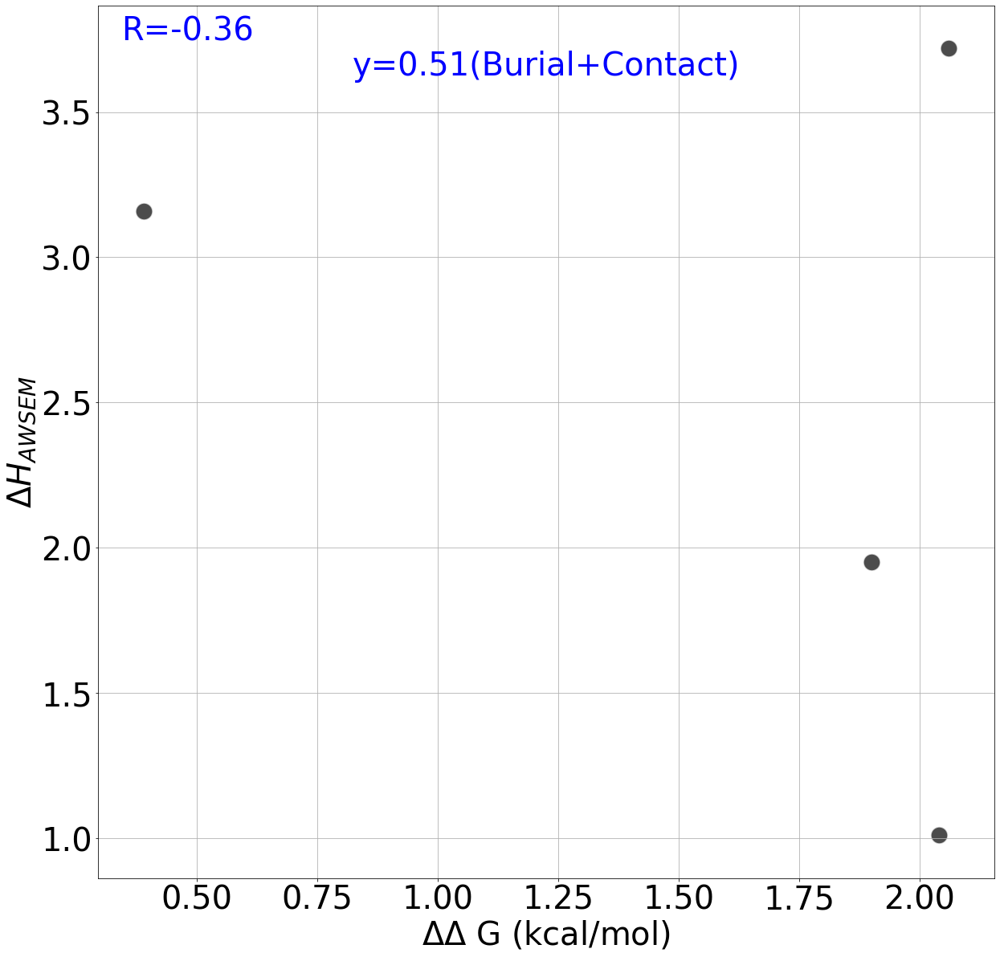

1STN_A
Pearson Coefficient=-0.16699244596463356


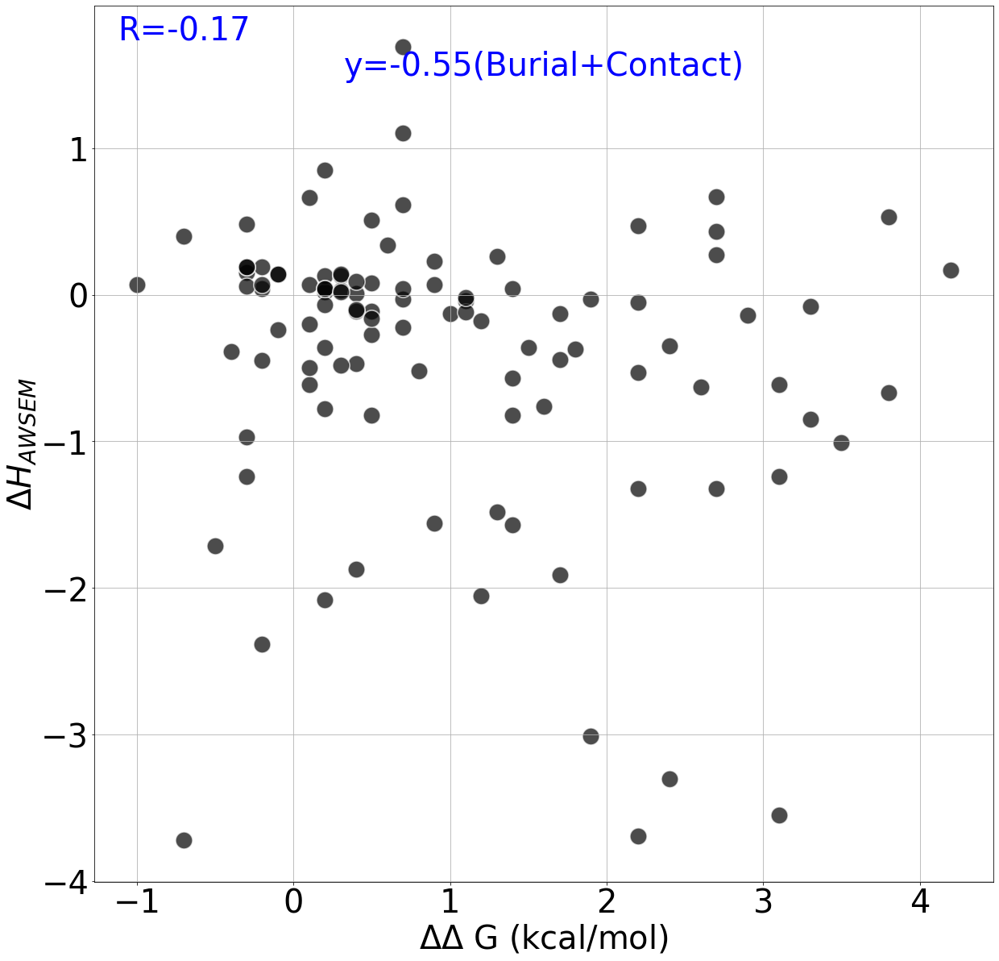

1OIA_A
Pearson Coefficient=0.5709427003524672


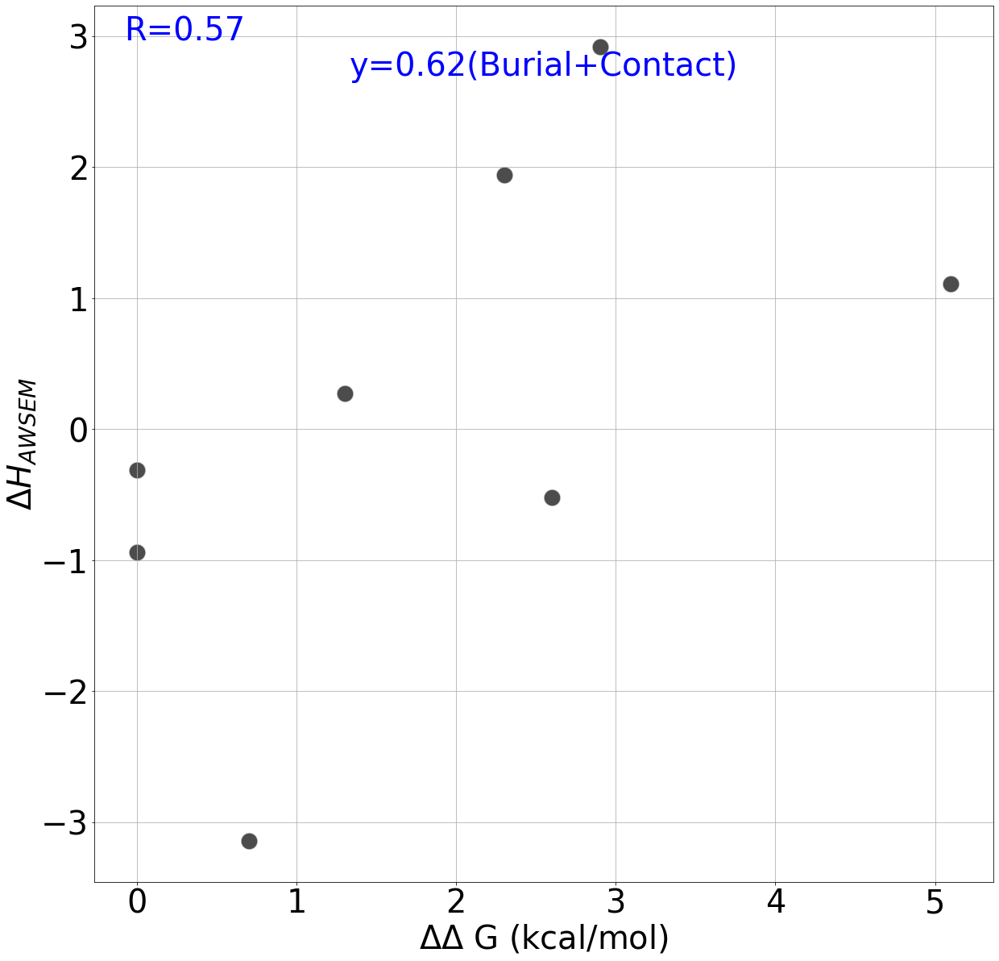

In [40]:
for pdb_name in all_single_mutations_protein_dataframe_copy_conditions_filter_2["PDB_Name"].unique():
    print(pdb_name)
    awsem_terms=["Burial+Contact"]
    pdb_all_single_mutations_protein_dataframe_copy_conditions_filter_2=all_single_mutations_protein_dataframe_copy_conditions_filter_2.loc[all_single_mutations_protein_dataframe_copy_conditions_filter_2["PDB_Name"]==pdb_name]
    if len(pdb_all_single_mutations_protein_dataframe_copy_conditions_filter_2)>3:
        ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(pdb_all_single_mutations_protein_dataframe_copy_conditions_filter_2,
                                             awsem_terms,f"{pdb_name}_{('_').join(awsem_terms)}",
                                             analysis_directory=f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/03_25_2022_{pdb_name}_Experimental_ddG_ddAWSEM",
                                             ddAWSEM_calculation_type=ddAWSEM_calculation_type)

### Filter 3: Duplicate Enteries with Same Experimental Conditions are Filtered

In [41]:
#For entries with same mutation and temperature, pick entry with pH closest to 7.0. AWSEM assumes a neutral pH 
#environment.
all_single_mutations_protein_dataframe_copy_closest_ph=all_single_mutations_protein_dataframe_copy.copy()

all_single_mutations_protein_dataframe_copy_closest_ph=all_single_mutations_protein_dataframe_copy_closest_ph.loc[((all_single_mutations_protein_dataframe_copy_closest_ph["T"].between(20,40)) & 
                                                                                                        (all_single_mutations_protein_dataframe_copy_closest_ph["pH"].between(6,8)) &
                                                                                                        (all_single_mutations_protein_dataframe_copy_closest_ph["EXPERIMENTAL_METHOD"].isin(['SOLUTION NMR', 'X-RAY DIFFRACTION'])) &
                                                                                                        (all_single_mutations_protein_dataframe_copy_closest_ph["STATE"].isin([np.nan, 2])))]

all_single_mutations_protein_dataframe_copy_closest_ph['pH-pH7'] = all_single_mutations_protein_dataframe_copy_closest_ph['pH'].sub(7).abs()
all_single_mutations_protein_dataframe_copy_closest_ph = all_single_mutations_protein_dataframe_copy_closest_ph.loc[all_single_mutations_protein_dataframe_copy_closest_ph.groupby(["PROTEIN","MUTATION","T"])['pH-pH7'].idxmin()]

In [42]:
all_single_mutations_protein_dataframe_copy_conditions_filter_3=all_single_mutations_protein_dataframe_copy_closest_ph.copy()

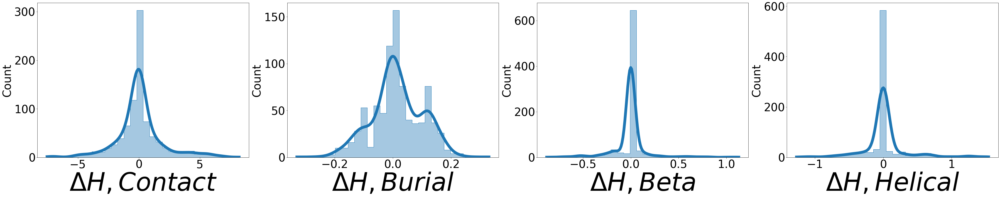

In [43]:
fig,axes=plt.subplots(1,4,figsize=(50,10))

for i,awsem_term in enumerate(["Contact","Burial","Beta","Helical"]):
    sns.histplot(data=all_single_mutations_protein_dataframe_copy_conditions_filter_3,x=awsem_term,
                 ax=axes[i],kde=True,element="step",line_kws={"linewidth":10},alpha=0.4,bins=bins)
    if ddAWSEM_calculation_type=="ddAWSEM":
        axes[i].set_xlabel(fr"$\Delta \Delta H,{awsem_term}$",fontsize=90)
    else:
        axes[i].set_xlabel(fr"$\Delta H,{awsem_term}$",fontsize=90)

plt.tight_layout()
plt.savefig(f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/{ddAWSEM_calculation_type}_Terms_Histograms.png")

Pearson Coefficient=0.35049591440552563


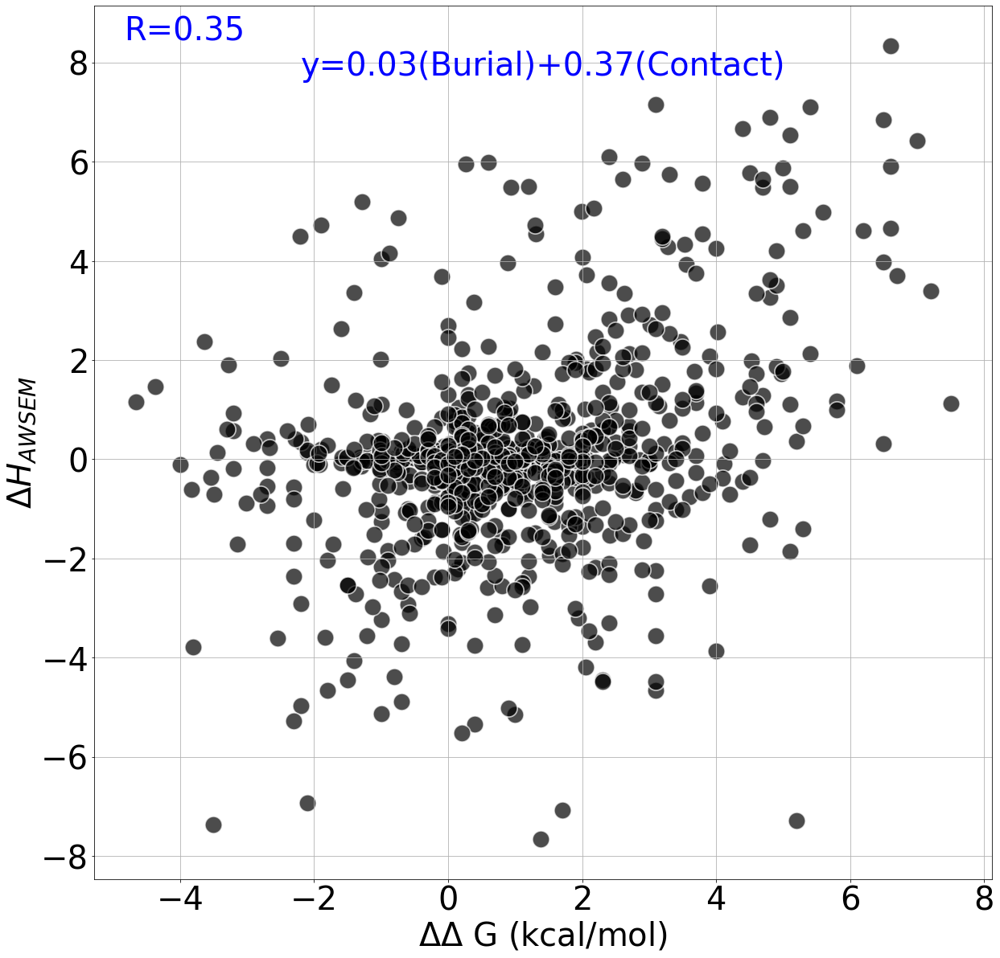

Pearson Coefficient=0.35373411005298033


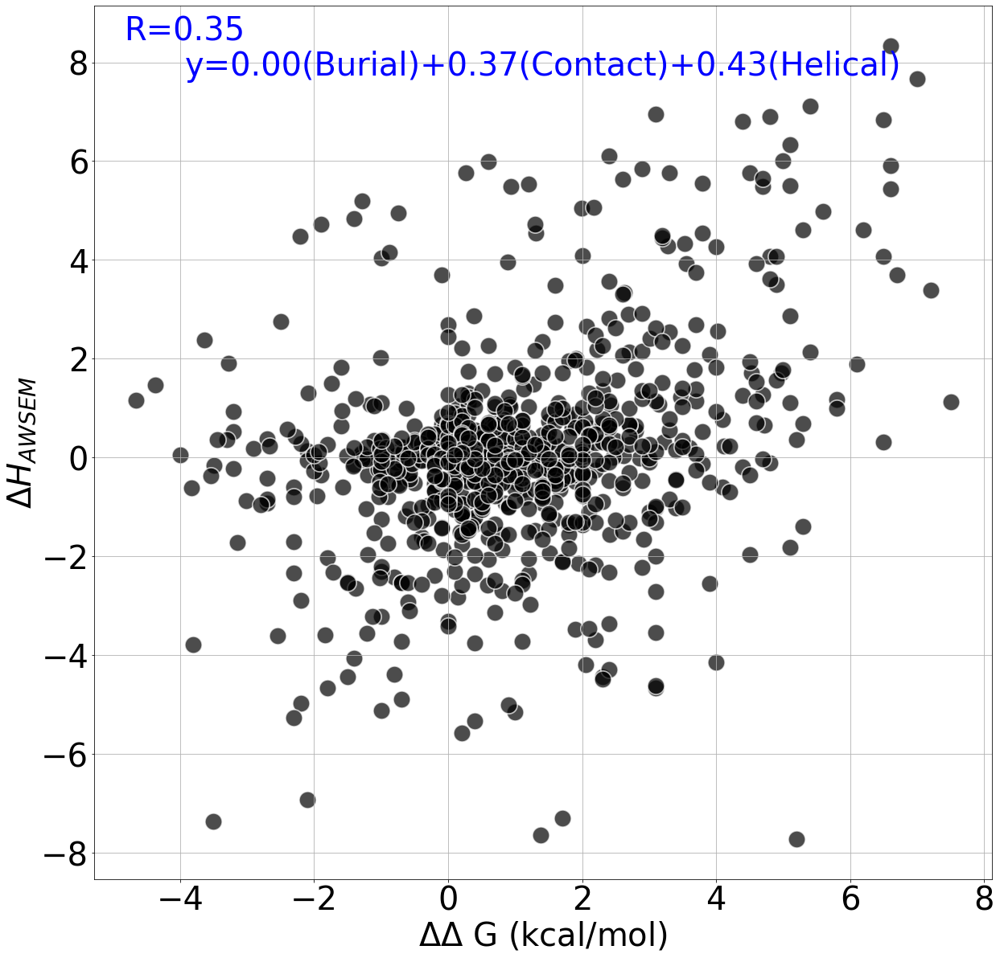

Pearson Coefficient=0.3428773886090327


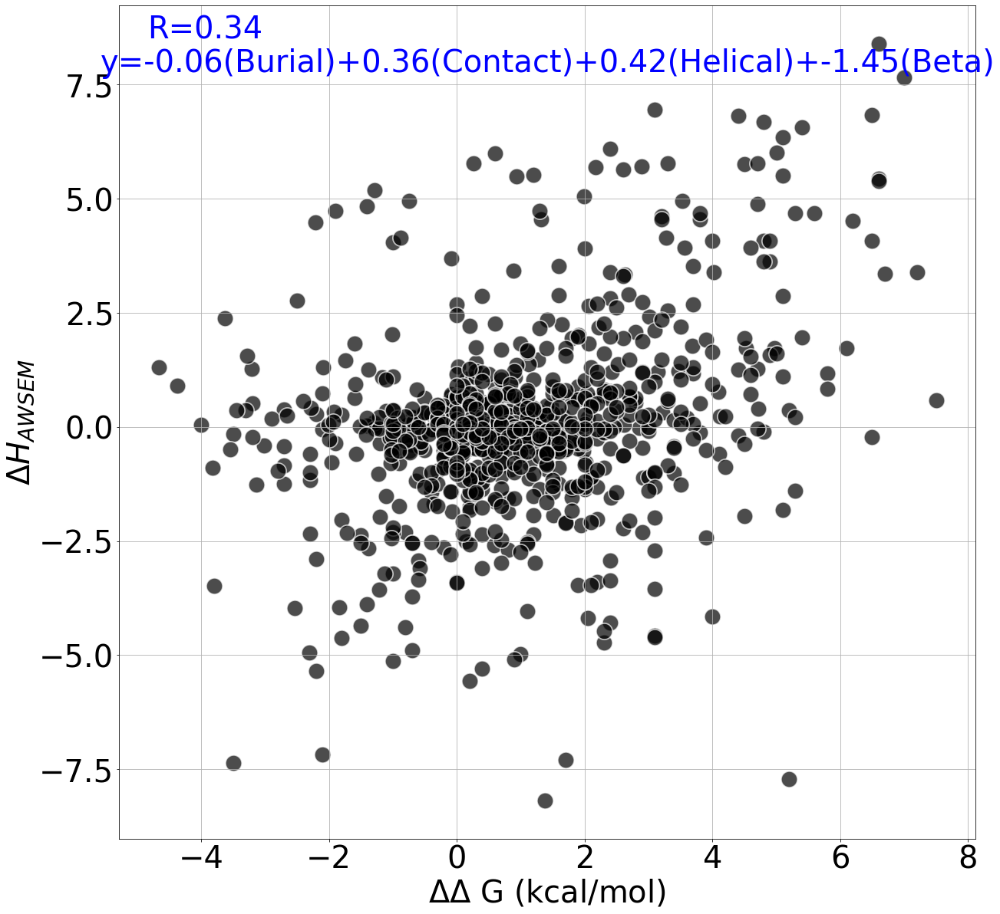

Pearson Coefficient=0.35049591440552486


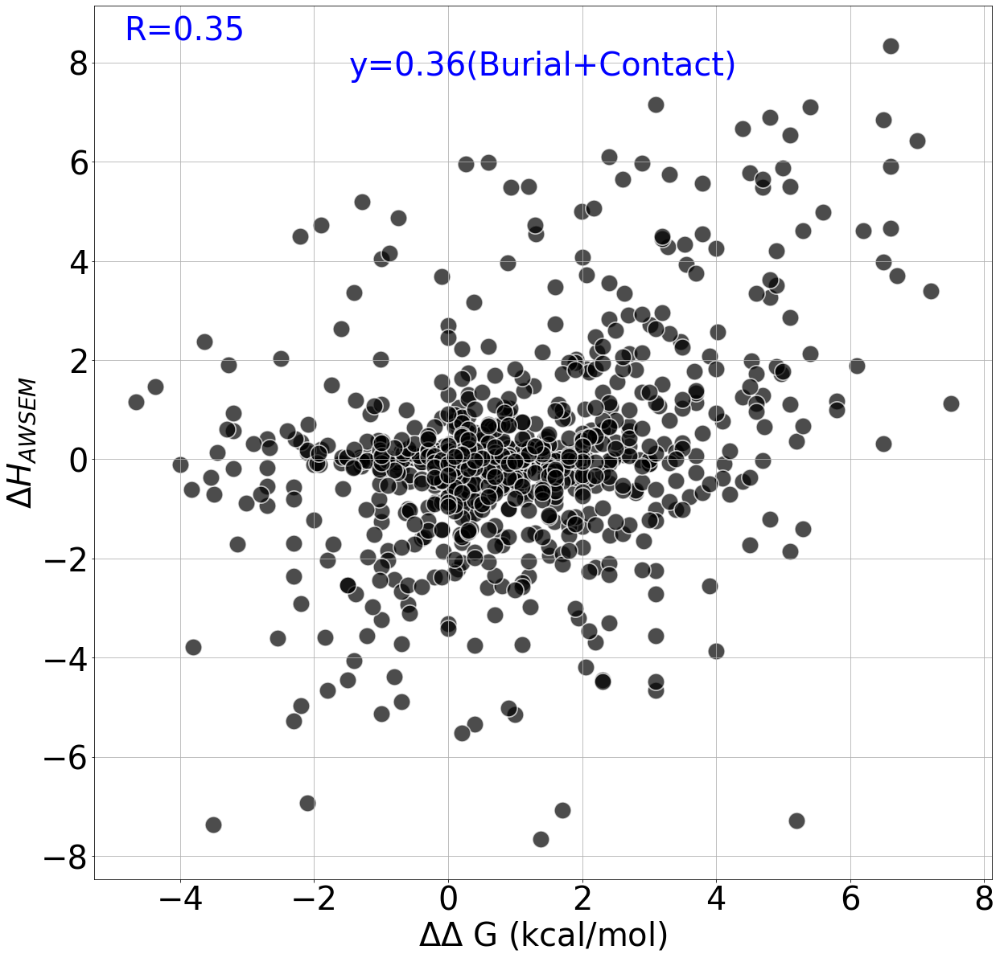

Pearson Coefficient=0.3537341100529797


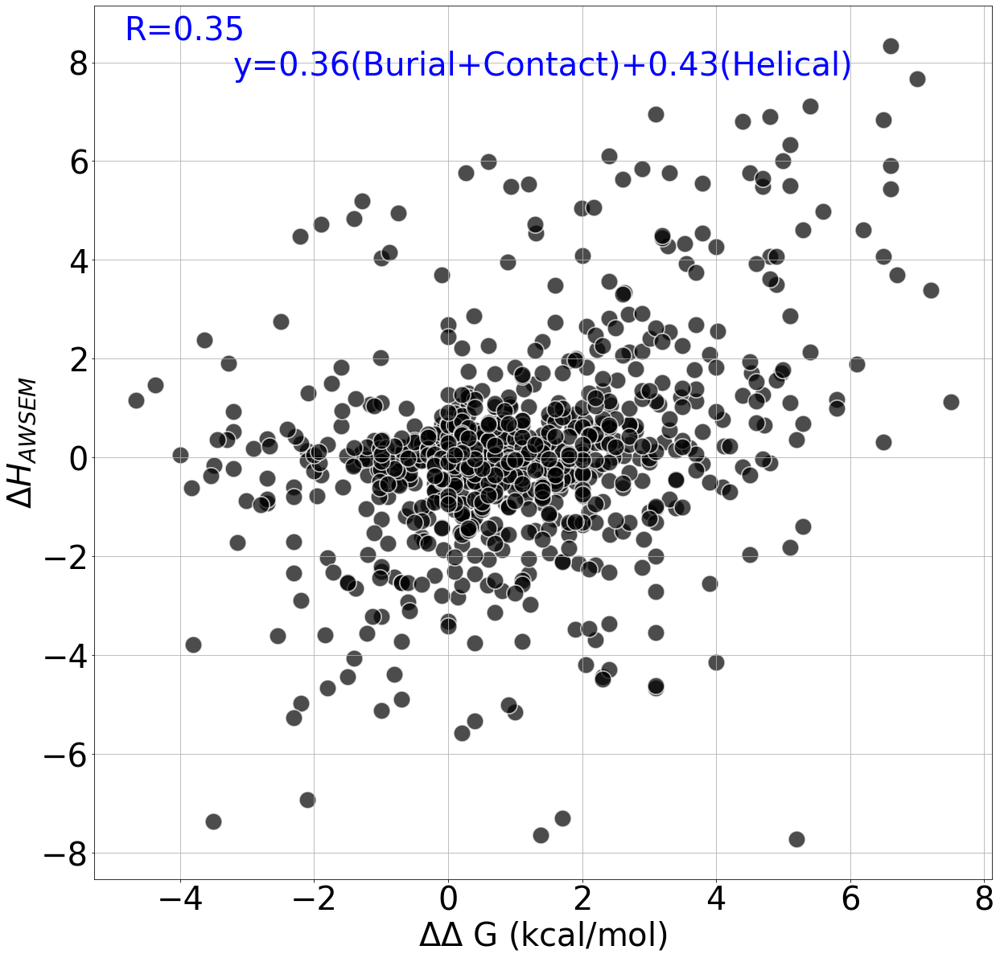

Pearson Coefficient=0.3428773886090321


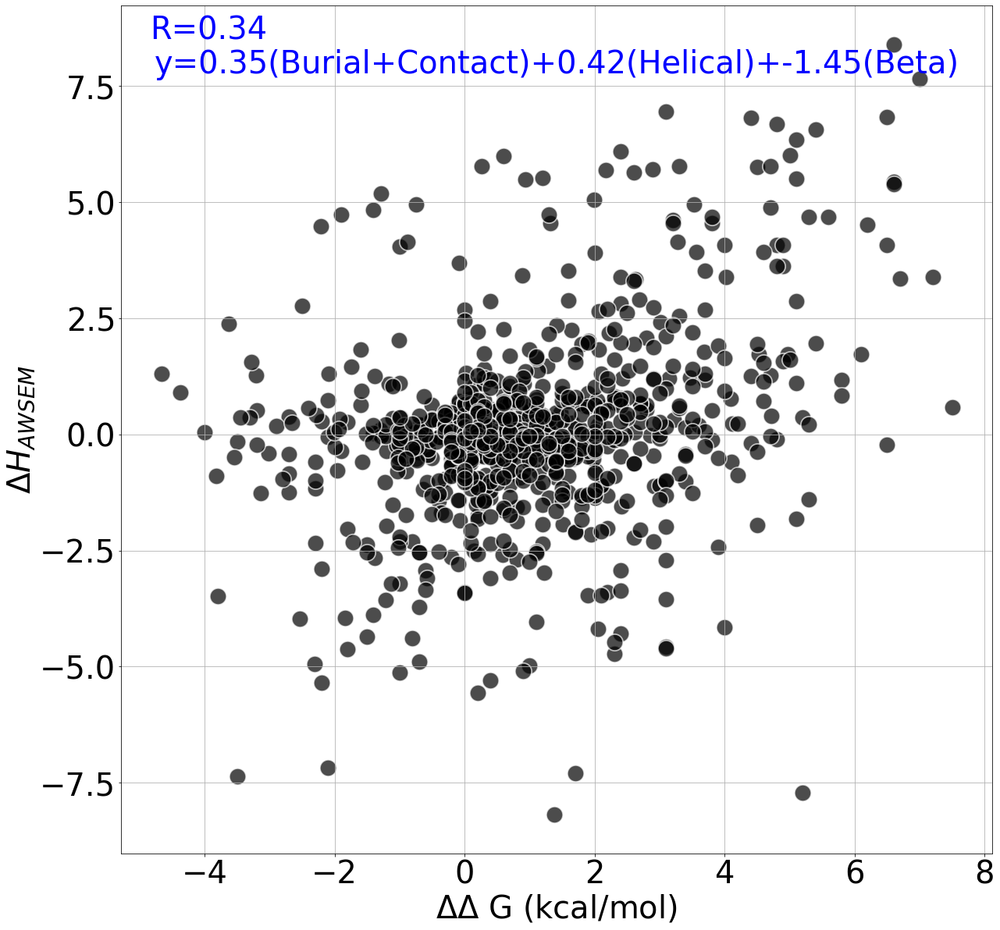

In [44]:
for awsem_terms in awsem_term_combinations:
    ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(all_single_mutations_protein_dataframe_copy_conditions_filter_3,
                                         awsem_terms,f"All_Physiological_PDBs_{('_').join(awsem_terms)}",
                                         analysis_directory=all_single_mutation_S6_ddG_ddAWSEM_directory,
                                        ddAWSEM_calculation_type=ddAWSEM_calculation_type)

Pearson Coefficient=0.9180932947375564


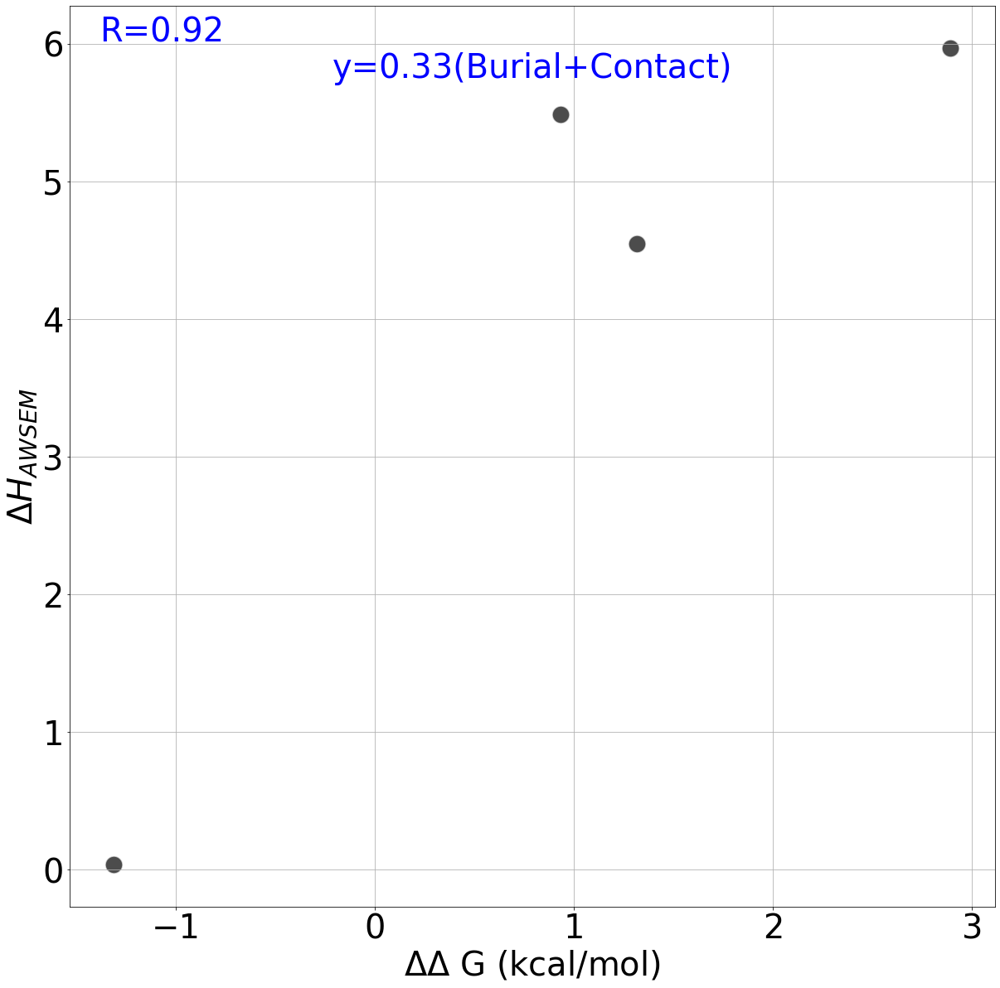

Pearson Coefficient=-0.04885477098932793


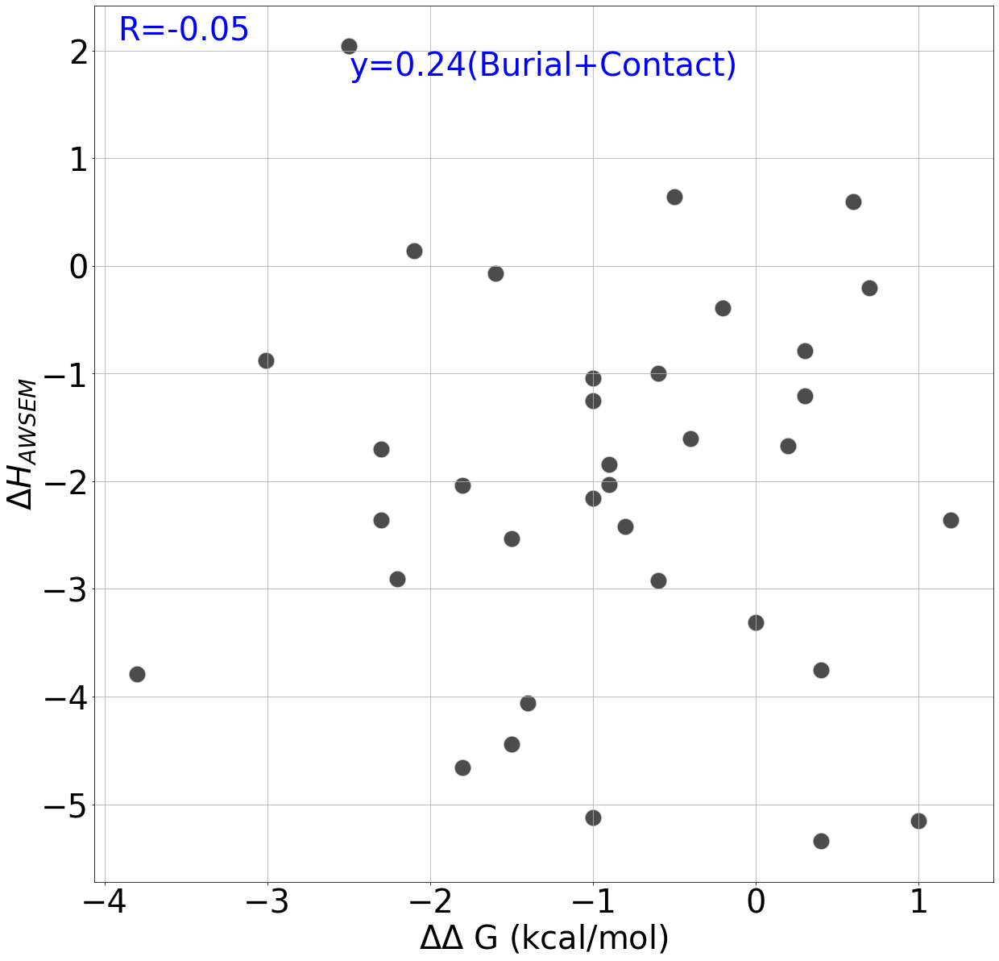

Pearson Coefficient=0.2748973474465934


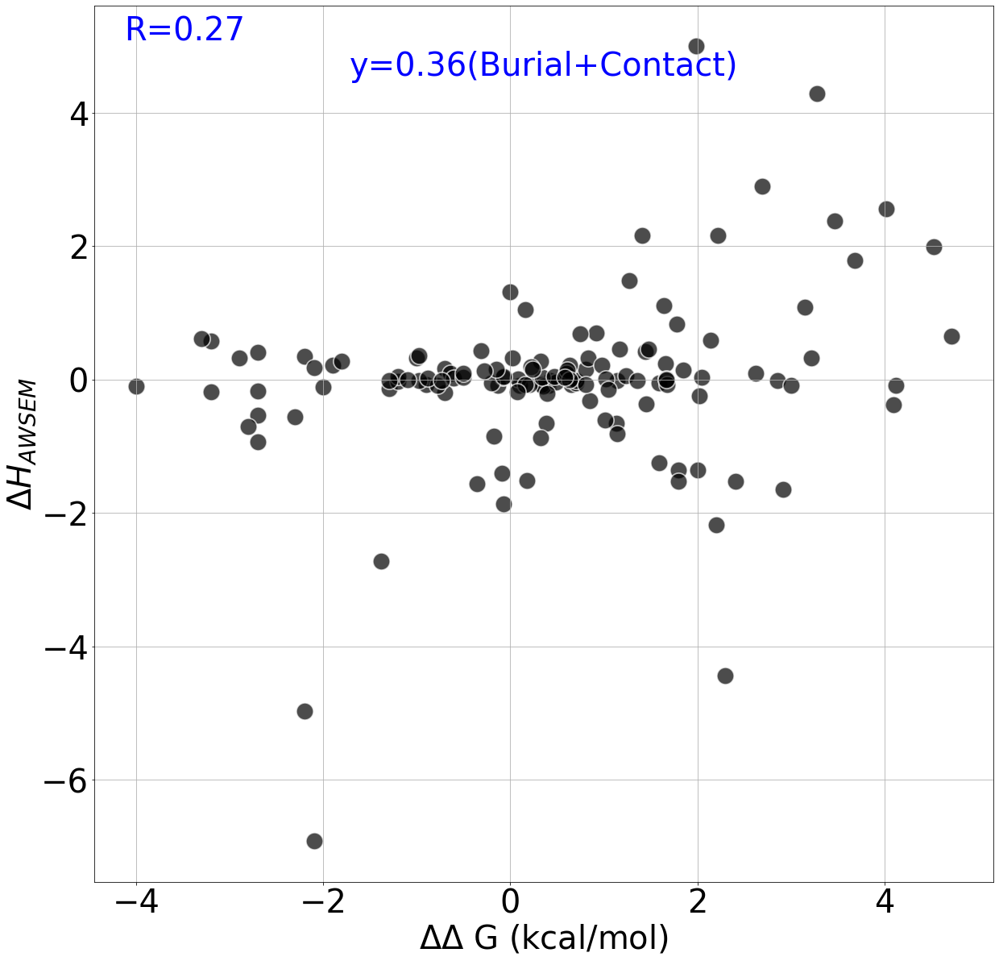

Pearson Coefficient=0.5123057204246181


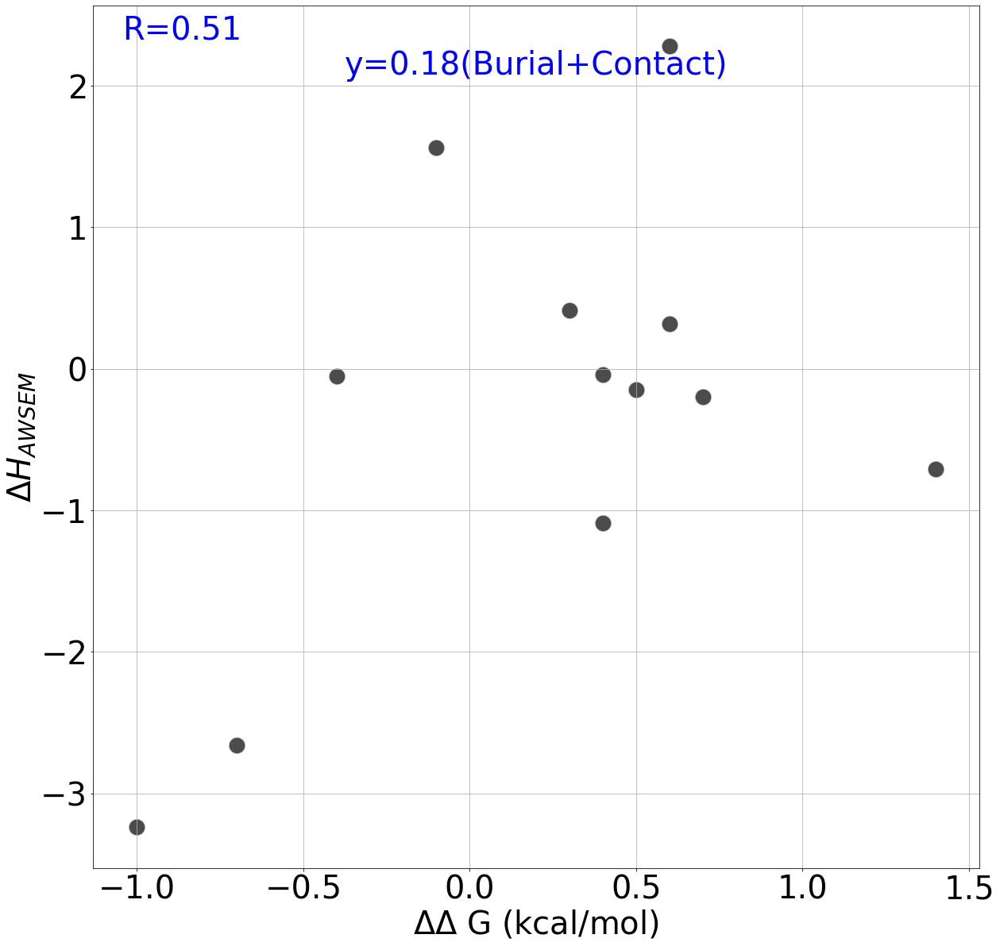

Pearson Coefficient=0.41527826123146017


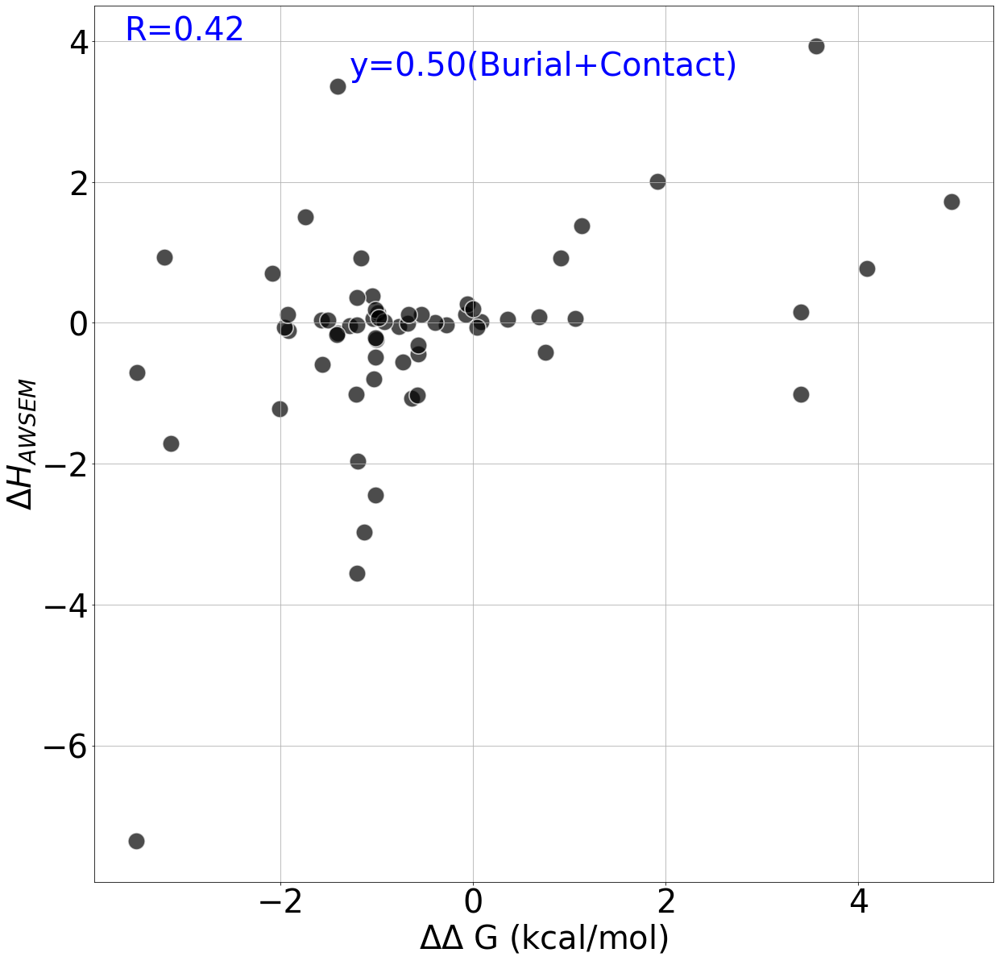

Pearson Coefficient=0.7910984680070776


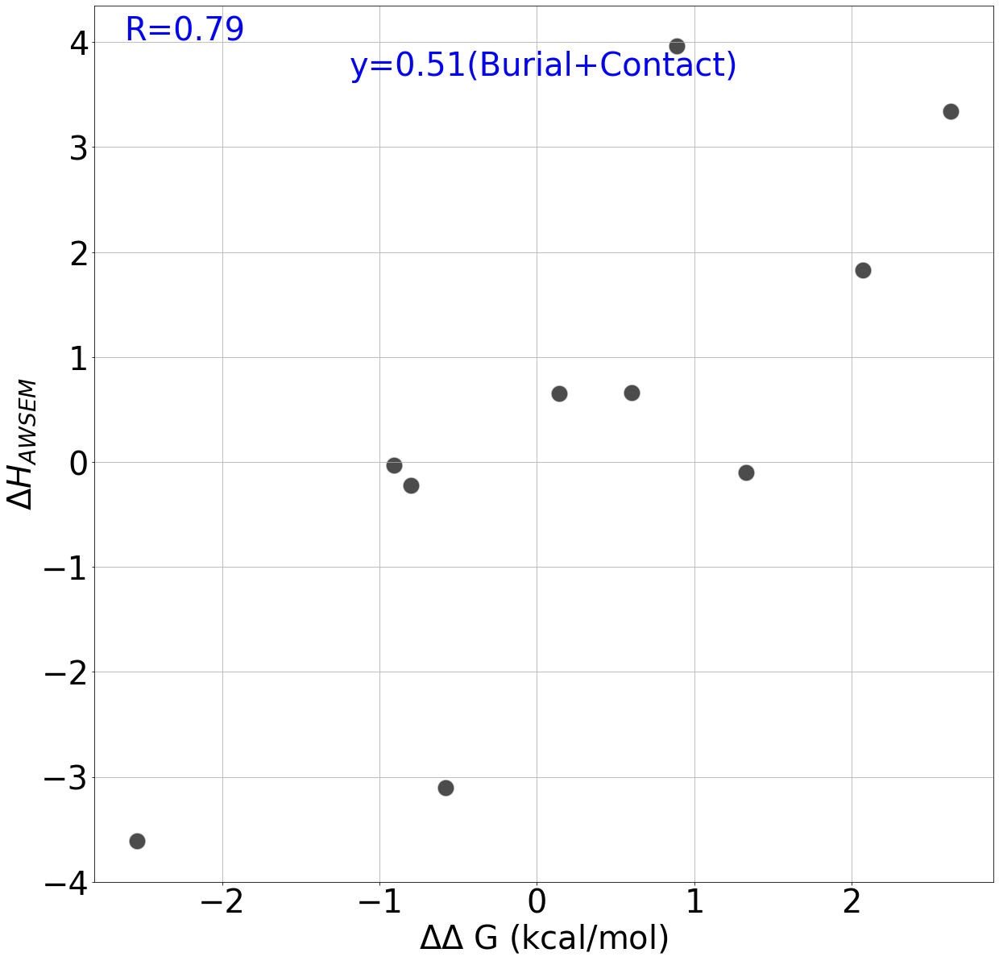

Pearson Coefficient=-0.34501011350949884


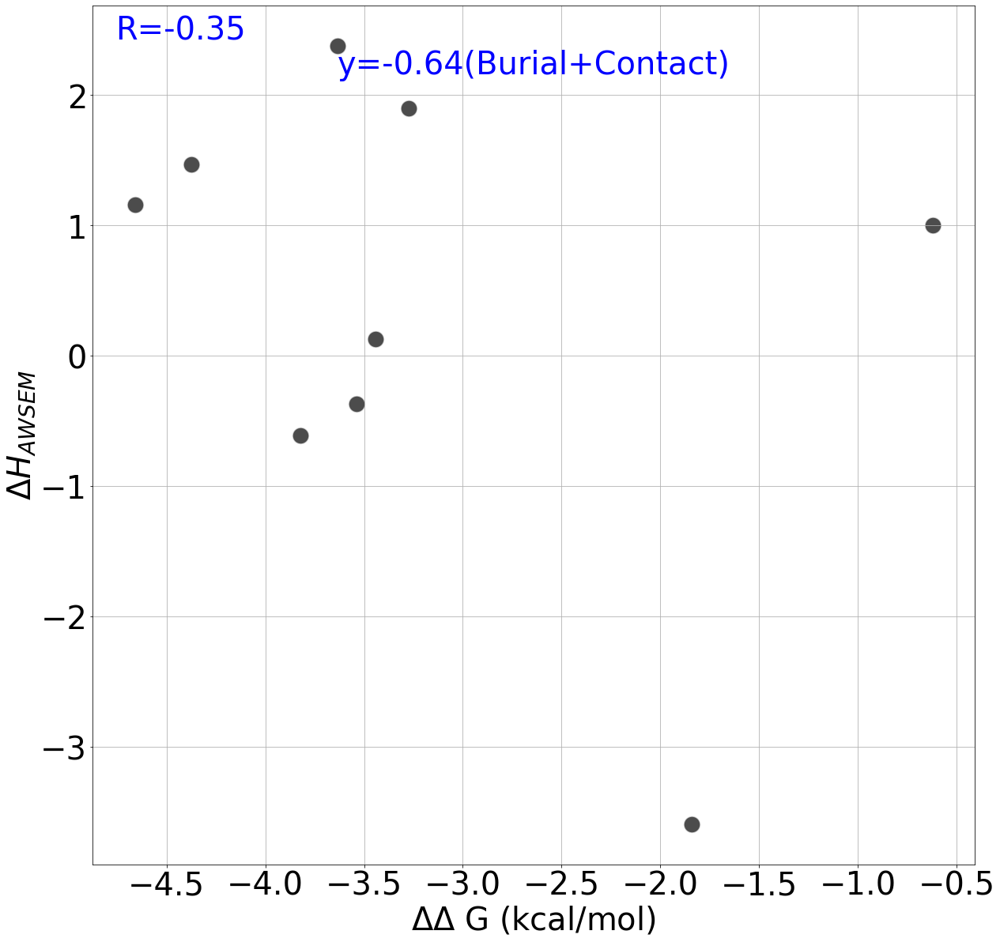

Pearson Coefficient=-0.18821709673549122


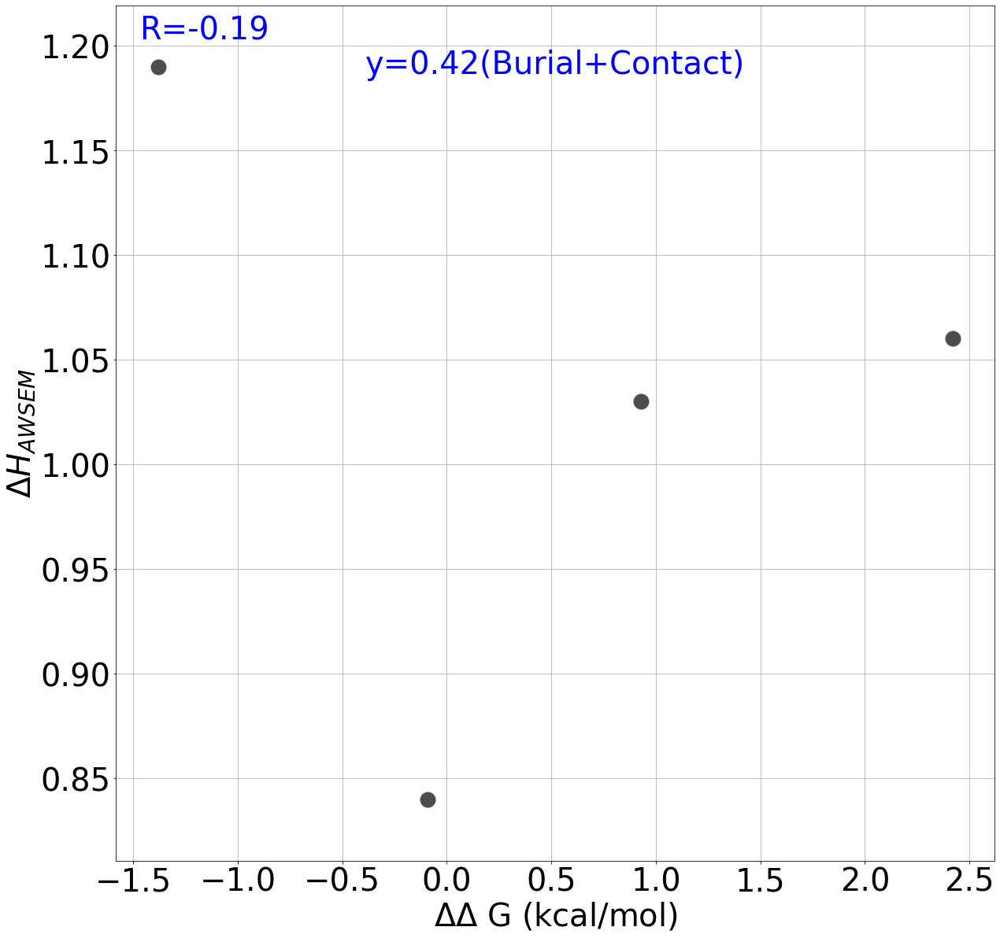

Pearson Coefficient=-0.3307119896295864


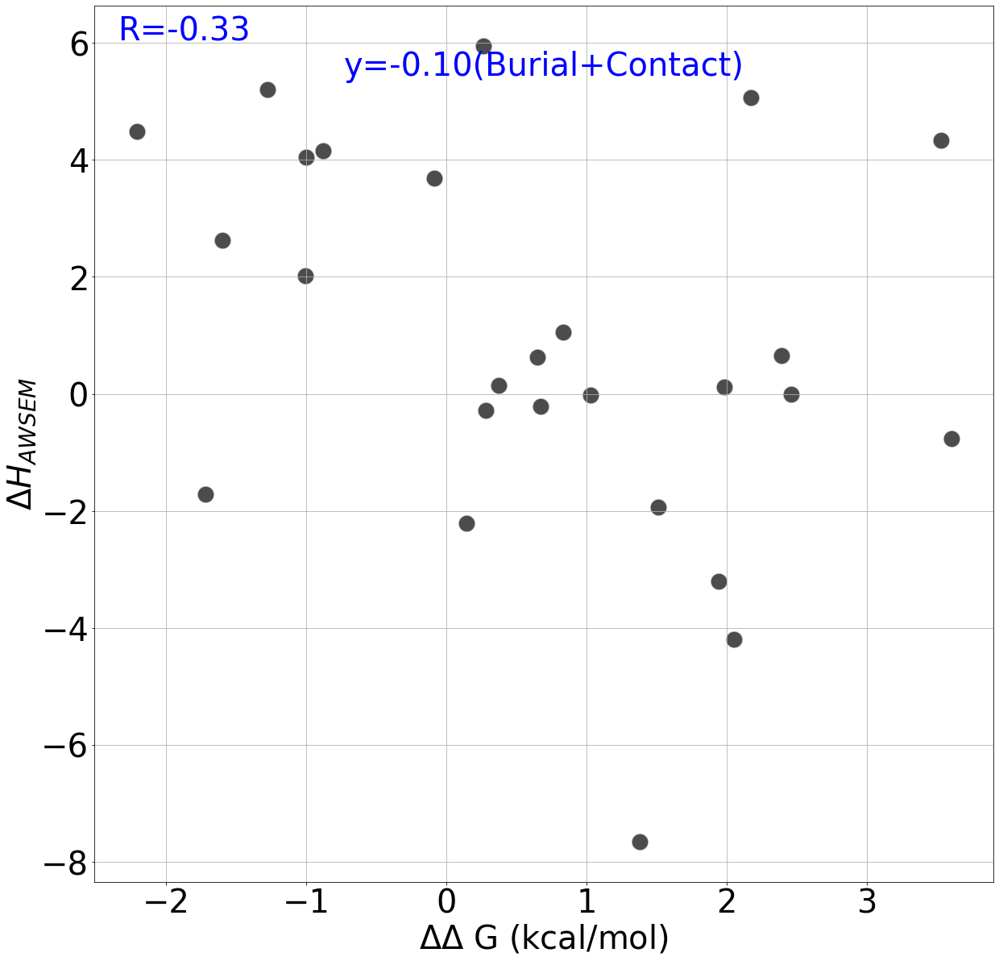

Pearson Coefficient=0.9851438473171192


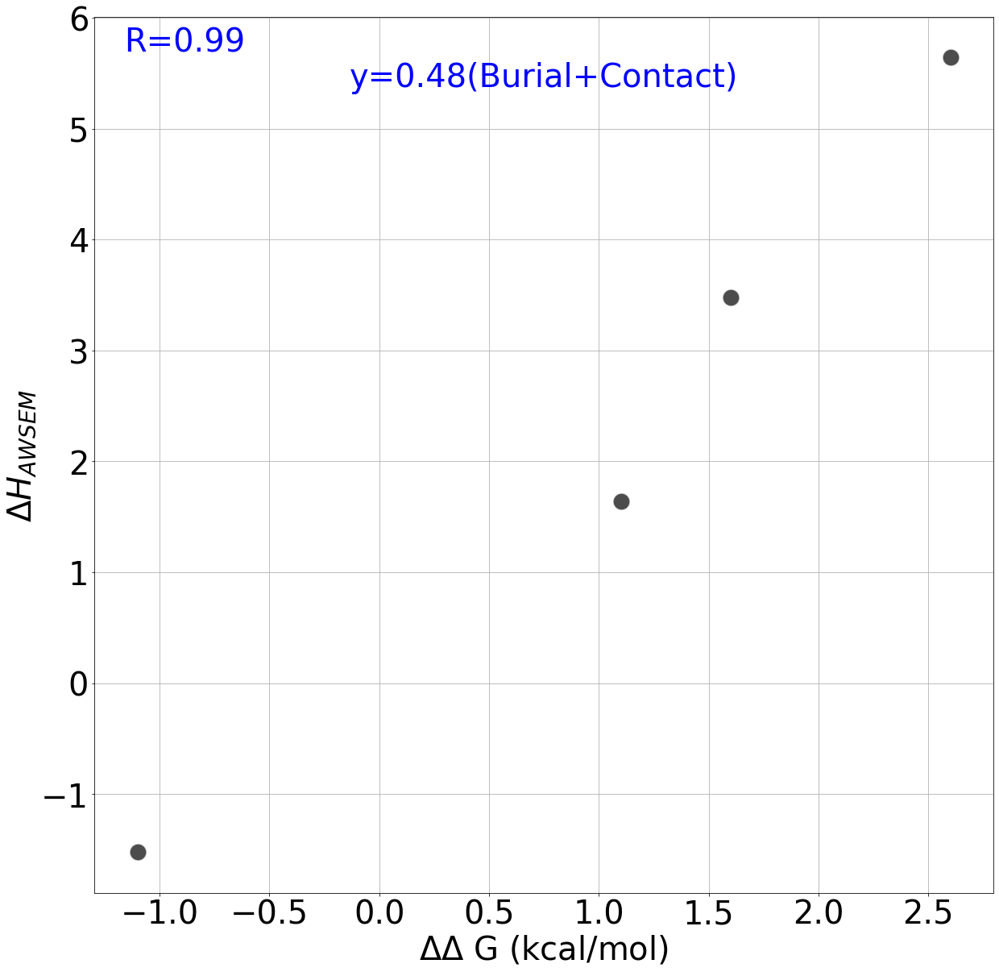

Pearson Coefficient=0.5575236129727705


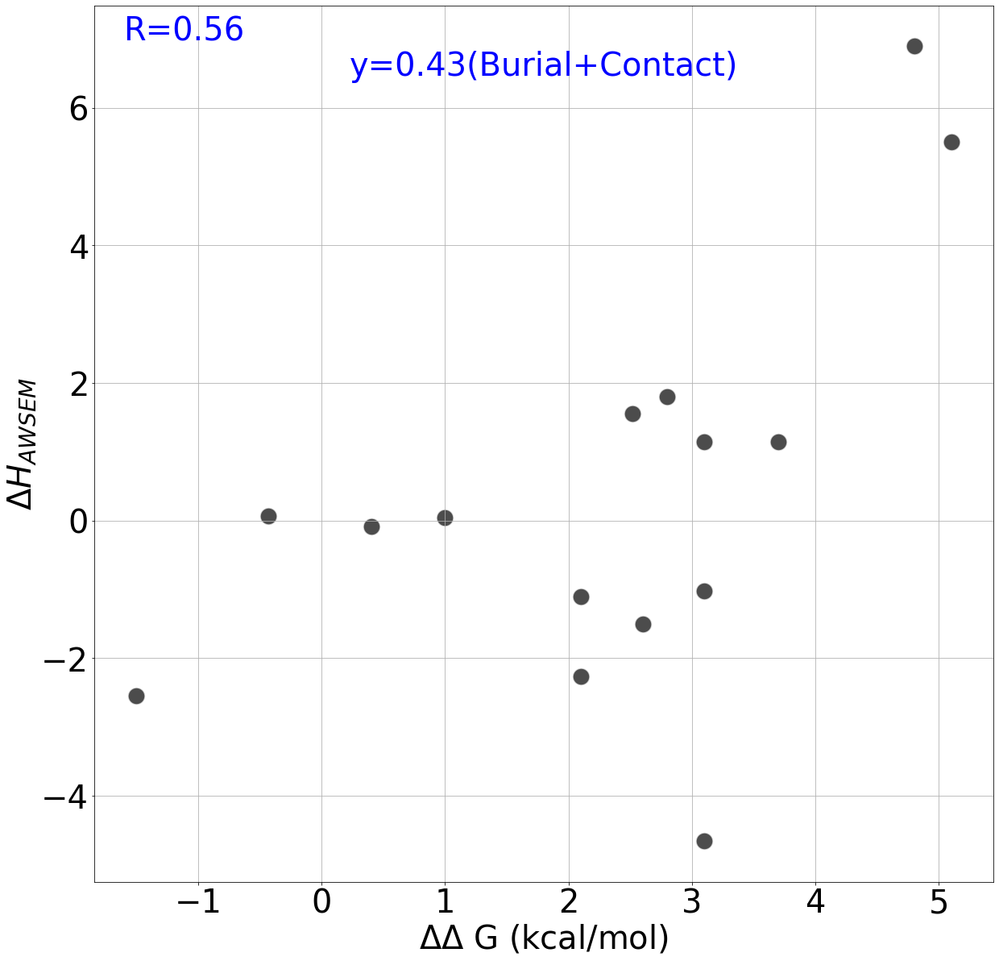

Pearson Coefficient=-0.3588400152310567


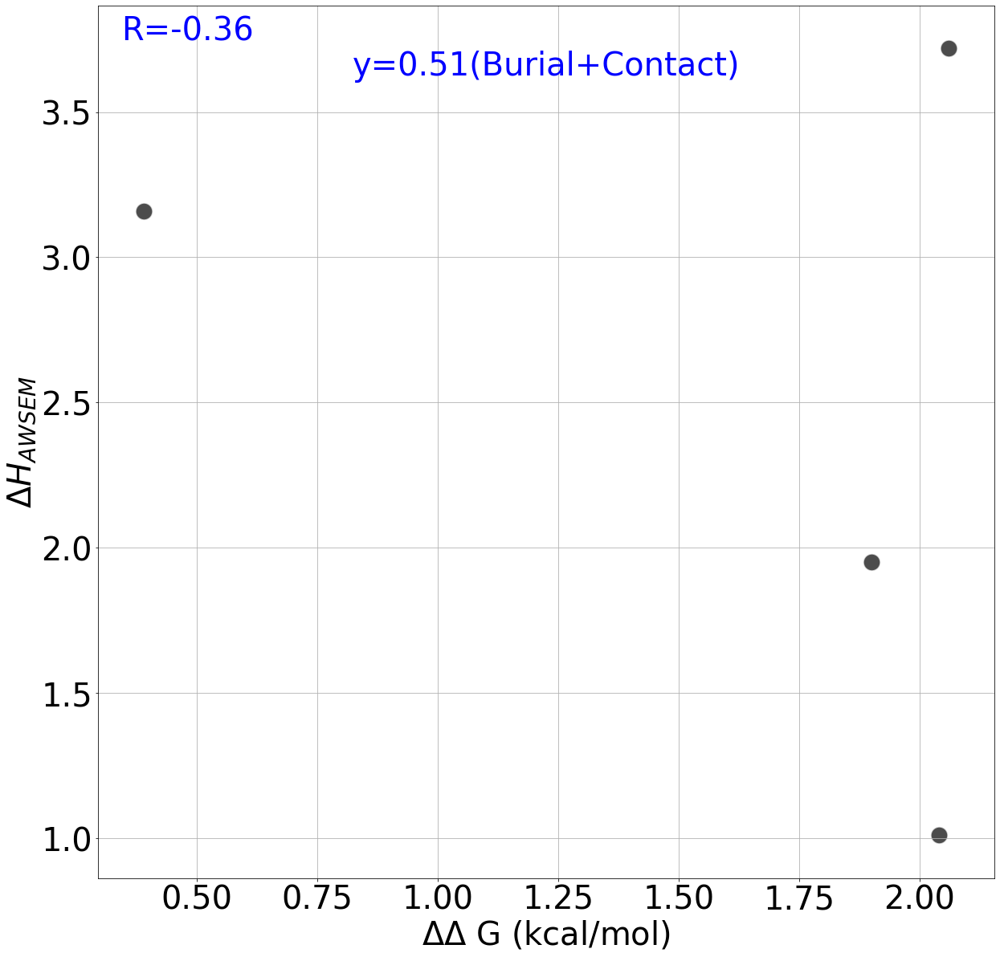

Pearson Coefficient=0.41980304129807794


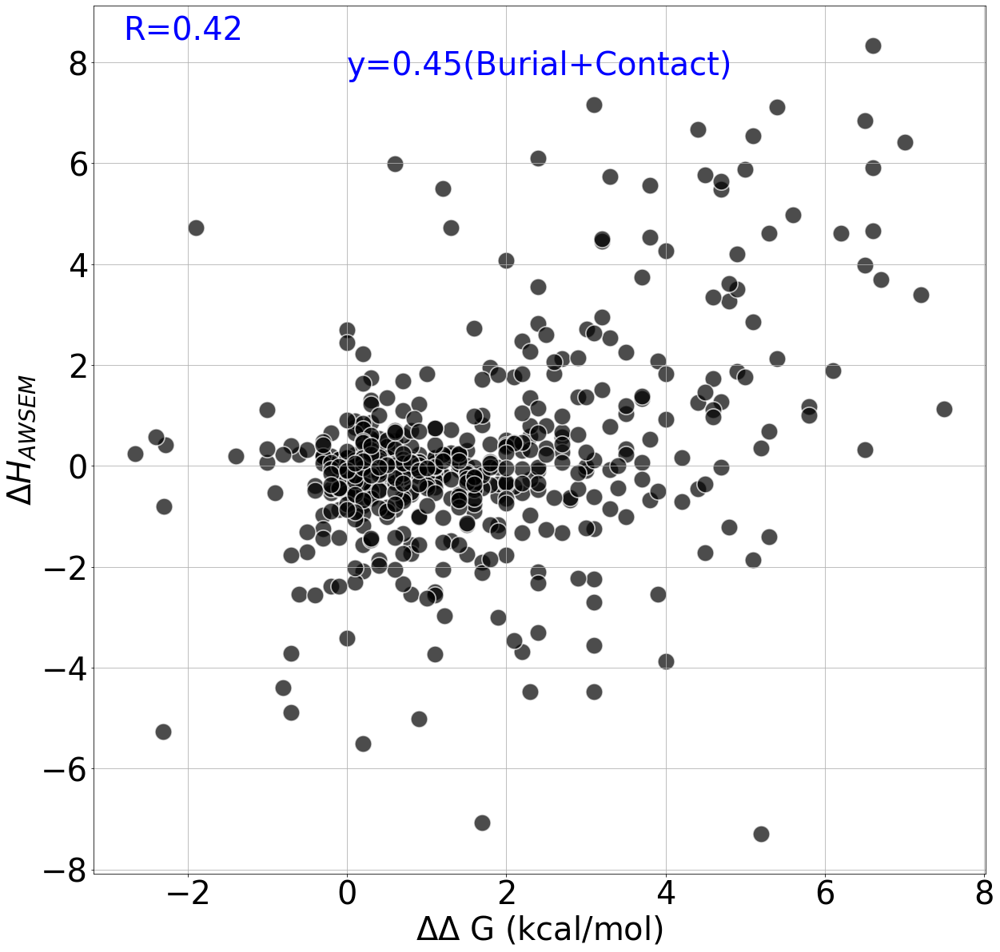

Pearson Coefficient=0.5709427003524672


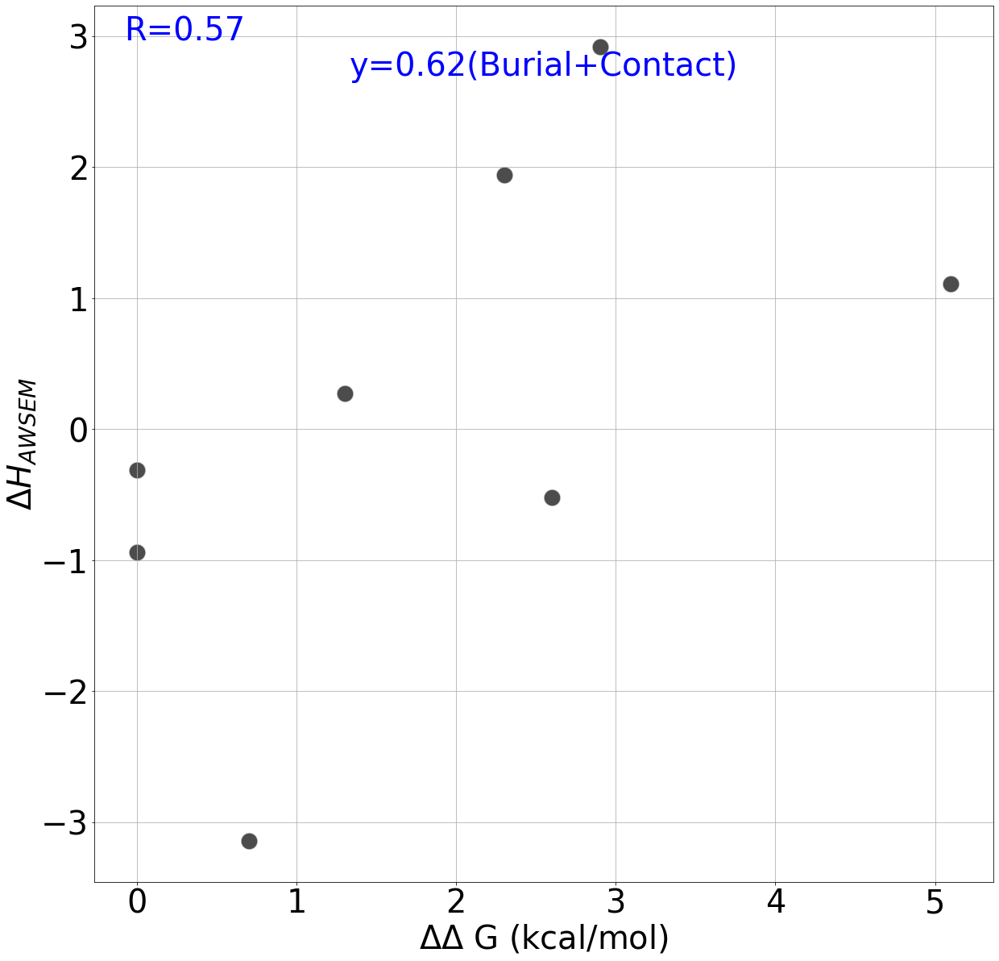

In [45]:
for pdb_name in all_single_mutations_protein_dataframe_copy_conditions_filter_3["PDB_Name"].unique():
    awsem_terms=["Burial+Contact"]
    pdb_all_single_mutations_protein_dataframe_copy_conditions_filter_3=all_single_mutations_protein_dataframe_copy_conditions_filter_3.loc[all_single_mutations_protein_dataframe_copy_conditions_filter_3["PDB_Name"]==pdb_name]
    if len(pdb_all_single_mutations_protein_dataframe_copy_conditions_filter_3)>3:
        ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(pdb_all_single_mutations_protein_dataframe_copy_conditions_filter_3,
                                             awsem_terms,f"{pdb_name}_{('_').join(awsem_terms)}",
                                             analysis_directory=f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/03_25_2022_{pdb_name}_Experimental_ddG_ddAWSEM",
                                            ddAWSEM_calculation_type=ddAWSEM_calculation_type)

### Filter 4: With Only the Largest Dataset Per Protein Used and Duplicate Enteries Filtered (Switched Order)
Maximizing number of entries measured within physiological conditions

In [46]:
all_single_mutations_protein_dataframe_copy_conditions_filter_4=all_single_mutations_protein_dataframe_copy_closest_ph.copy()

In [47]:
# Grouping dataframe elements by pdb name and each data source. For each pdb, trying to pick only data entries 
# from one experiment with the highest data count.
grouped_pdbs_experiment_highest_count=all_single_mutations_protein_dataframe_copy_conditions_filter_4.groupby(["PROTEIN","REFERENCE"], as_index=False).count().sort_values(by="Steps",ascending=False).drop_duplicates('PROTEIN')
grouped_pdbs_experiment_highest_count=grouped_pdbs_experiment_highest_count.loc[grouped_pdbs_experiment_highest_count["Steps"]>5]
grouped_pdbs_experiment_highest_count_dictionary=pd.Series(grouped_pdbs_experiment_highest_count.REFERENCE.values,index=grouped_pdbs_experiment_highest_count.PROTEIN).to_dict()

all_single_mutations_protein_dataframe_copy_conditions_filter_4=pd.concat([all_single_mutations_protein_dataframe_copy_conditions_filter_4[(all_single_mutations_protein_dataframe_copy_conditions_filter_4['PROTEIN'] == k) & (all_single_mutations_protein_dataframe_copy_conditions_filter_4['REFERENCE']==v)] for k,v in grouped_pdbs_experiment_highest_count_dictionary.items()])

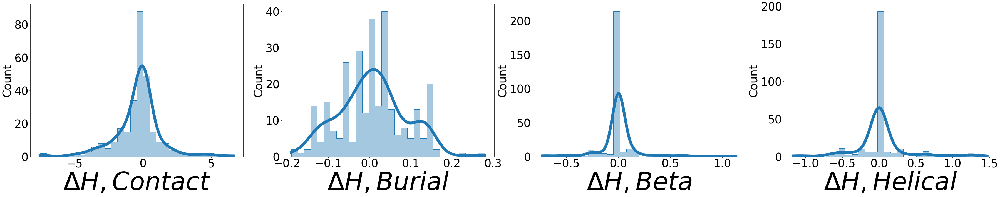

In [48]:
fig,axes=plt.subplots(1,4,figsize=(50,10))

for i,awsem_term in enumerate(["Contact","Burial","Beta","Helical"]):
    sns.histplot(data=all_single_mutations_protein_dataframe_copy_conditions_filter_4,x=awsem_term,
                 ax=axes[i],kde=True,element="step",line_kws={"linewidth":10},alpha=0.4,bins=bins)
    if ddAWSEM_calculation_type=="ddAWSEM":
        axes[i].set_xlabel(fr"$\Delta \Delta H,{awsem_term}$",fontsize=90)
    else:
        axes[i].set_xlabel(fr"$\Delta H,{awsem_term}$",fontsize=90)

plt.tight_layout()
plt.savefig(f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/{ddAWSEM_calculation_type}_Terms_Histograms_PDBs_Largest_Group_Flipped.png")

Pearson Coefficient=0.24017777044540678


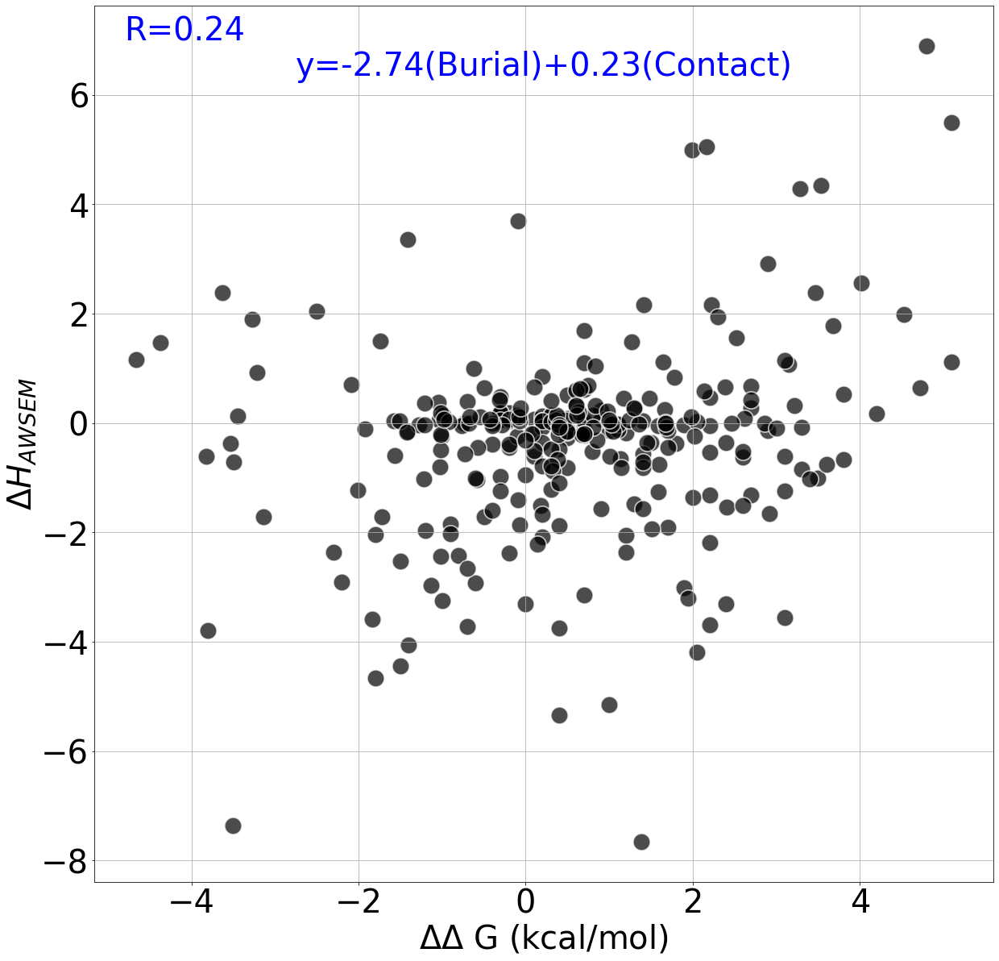

Pearson Coefficient=0.21907031726800066


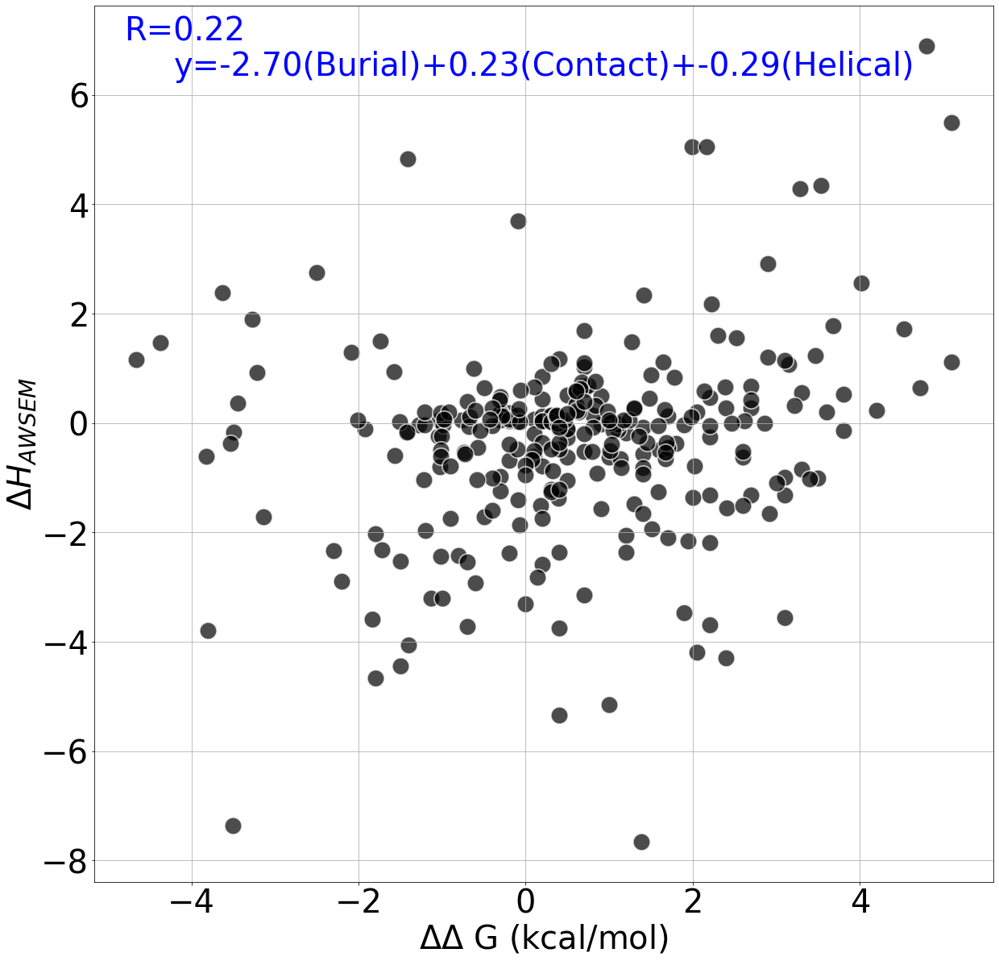

Pearson Coefficient=0.21851589395184903


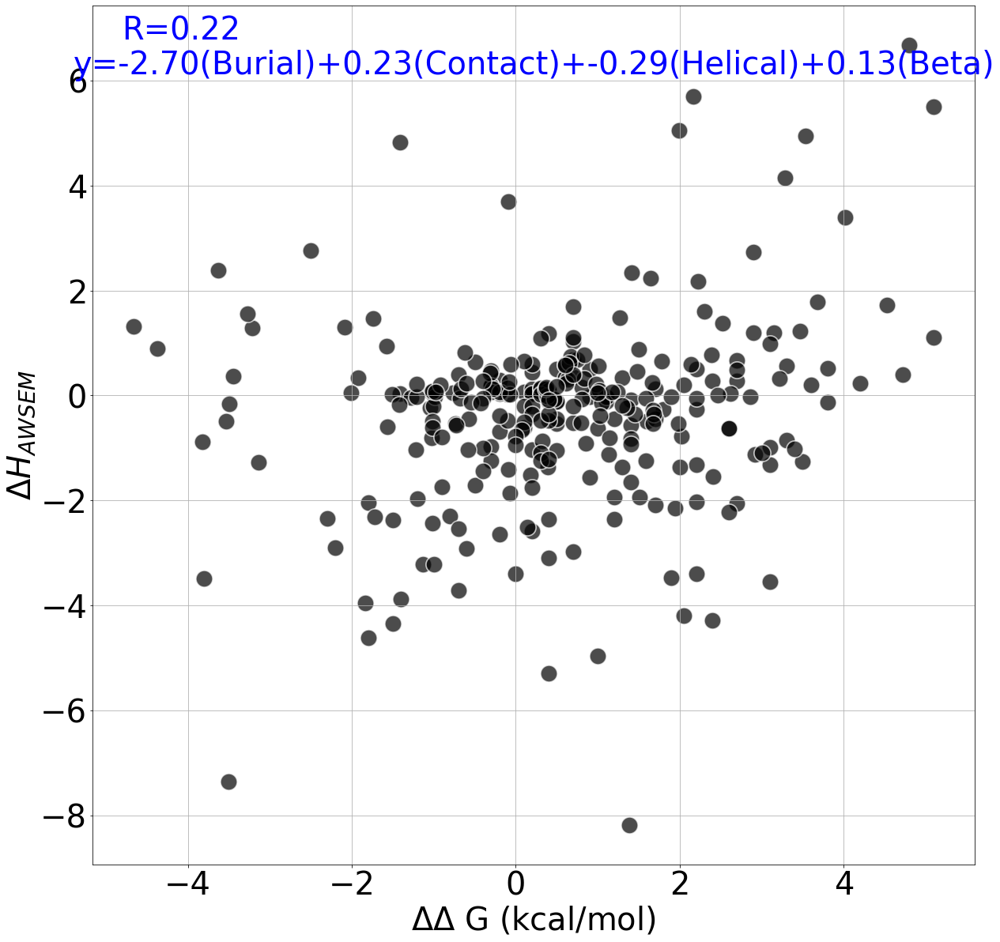

Pearson Coefficient=0.24017777044540567


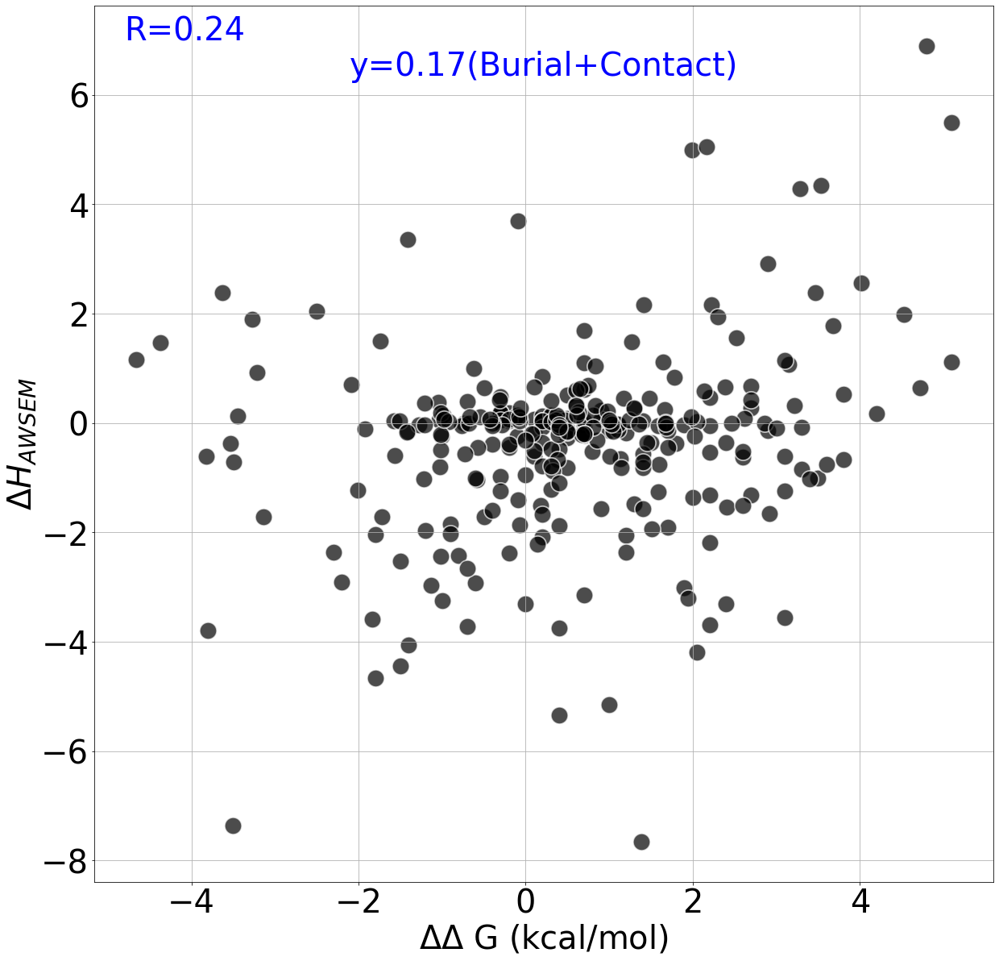

Pearson Coefficient=0.21907031726799964


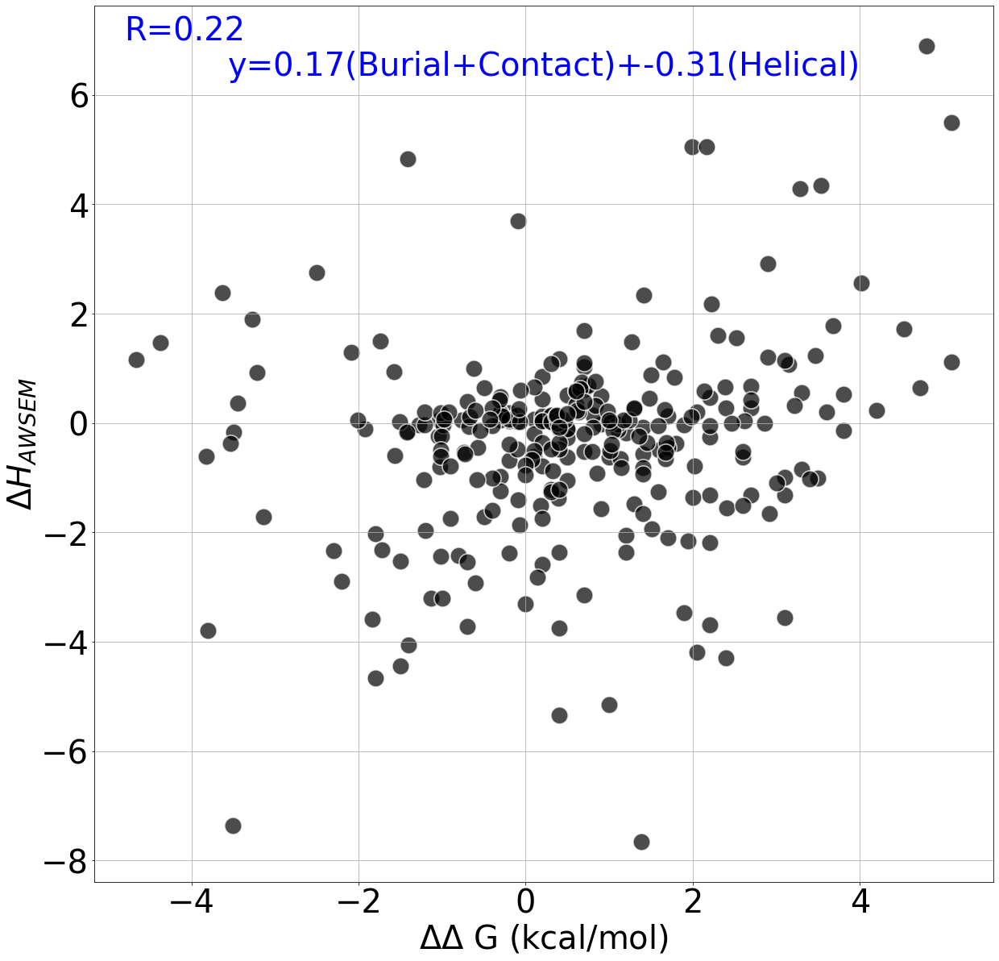

Pearson Coefficient=0.2185158939518479


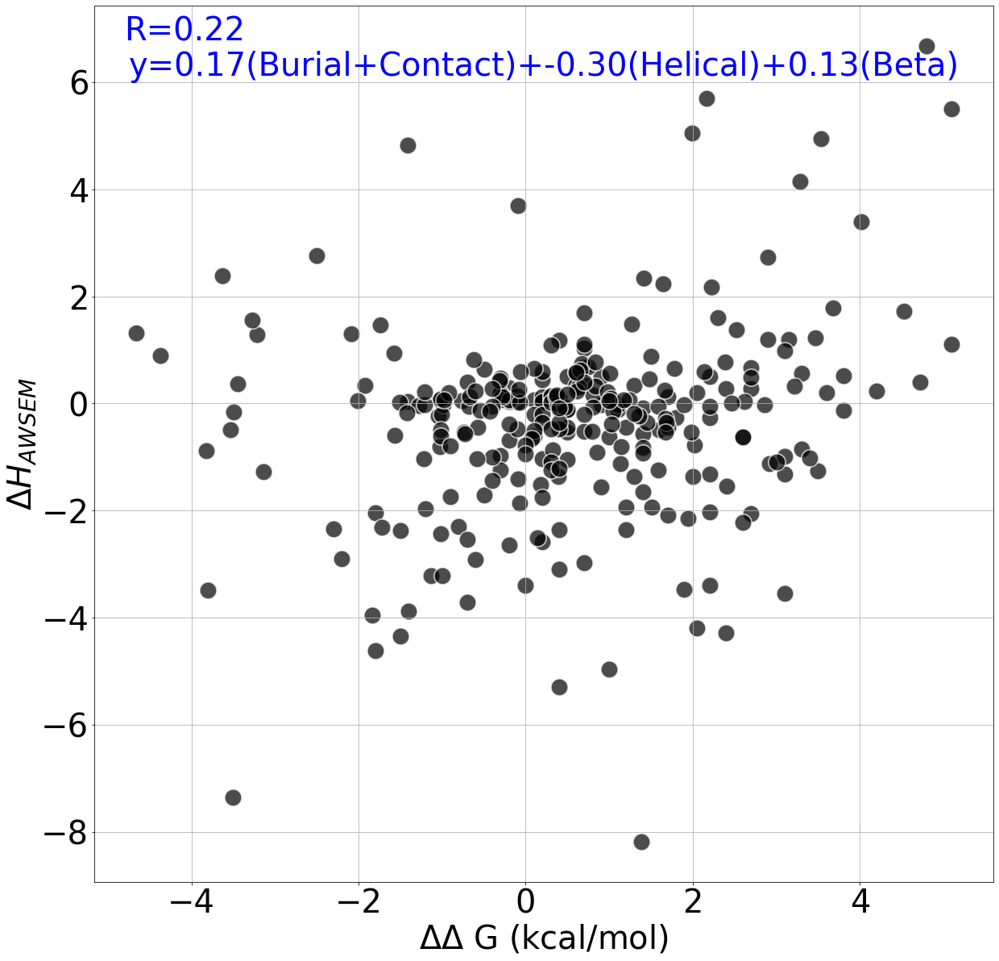

In [49]:
for awsem_terms in awsem_term_combinations:
    ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(all_single_mutations_protein_dataframe_copy_conditions_filter_4,
                                         awsem_terms,f"All_Physiological_PDBs_{('_').join(awsem_terms)}_Largest_Group_Flipped",
                                         analysis_directory=all_single_mutation_S6_ddG_ddAWSEM_directory,
                                        ddAWSEM_calculation_type=ddAWSEM_calculation_type)

1STN_A
Pearson Coefficient=-0.16699244596463356


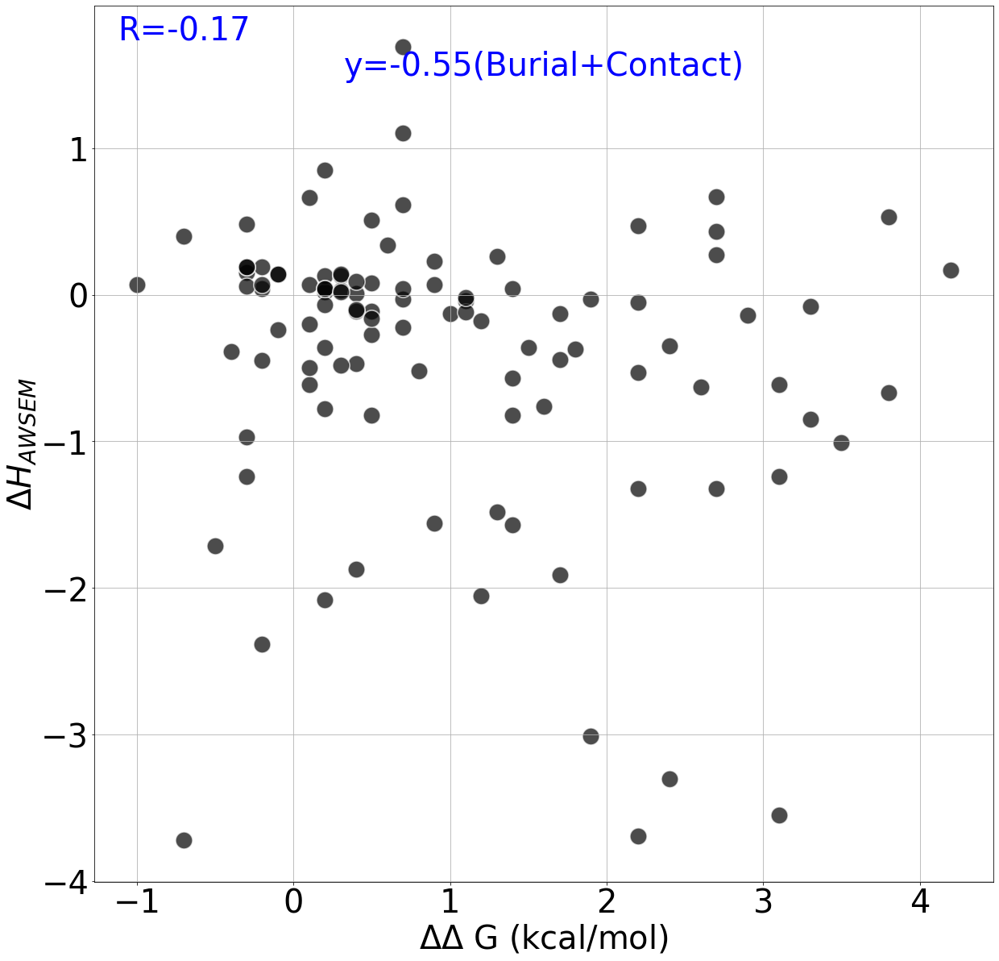

1BNI_A
Pearson Coefficient=0.41787762060992134


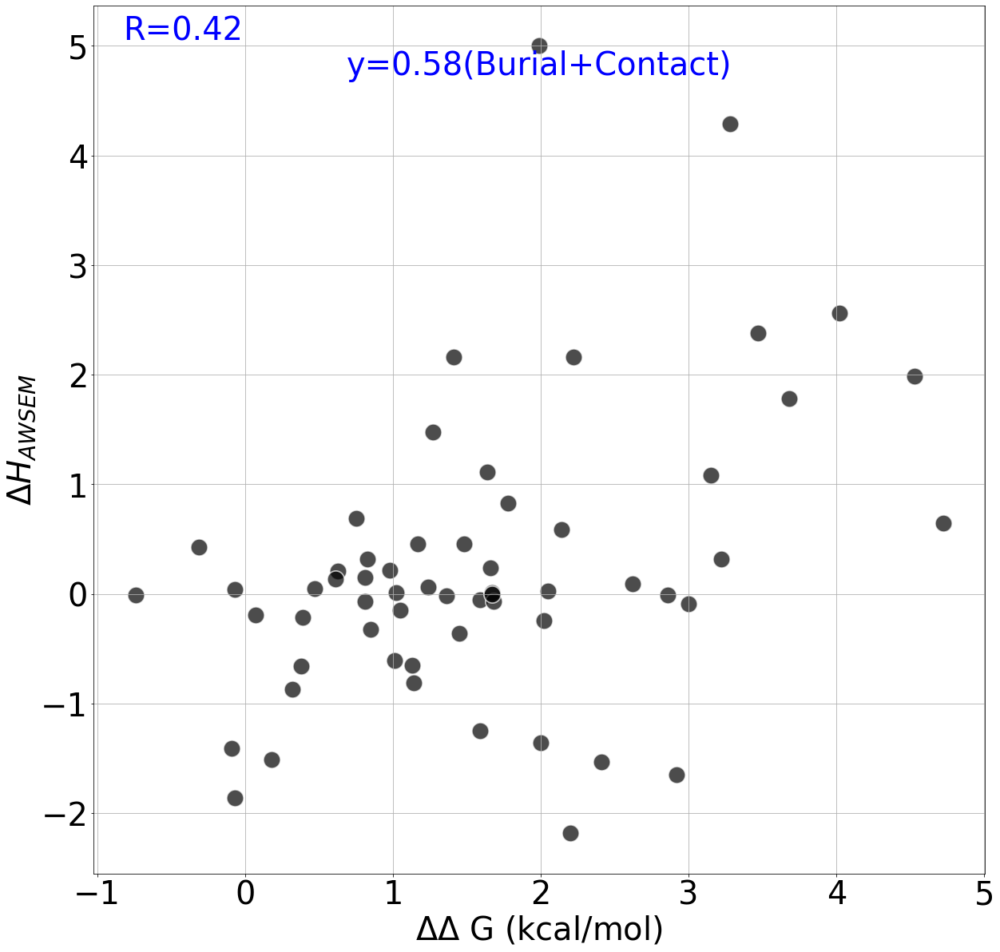

2CI2_I
Pearson Coefficient=0.20795101194772514


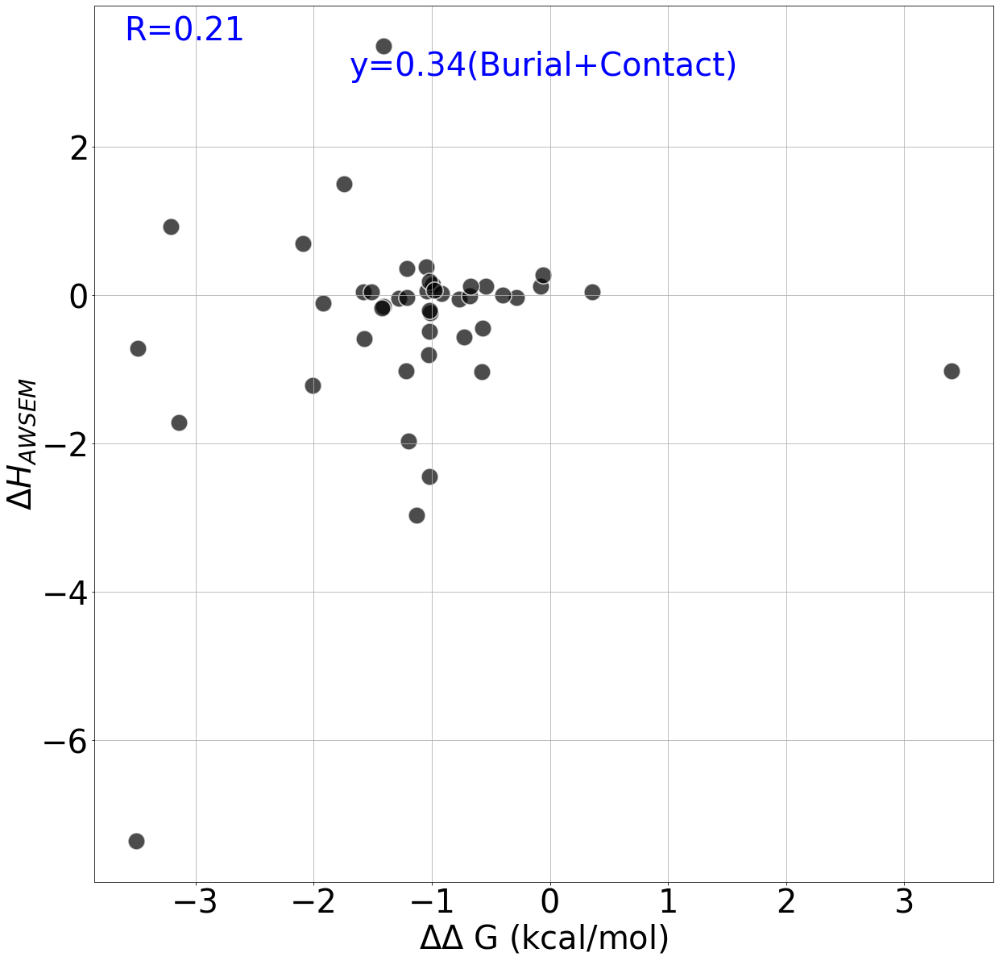

1QLP_A
Pearson Coefficient=0.07265704675346385


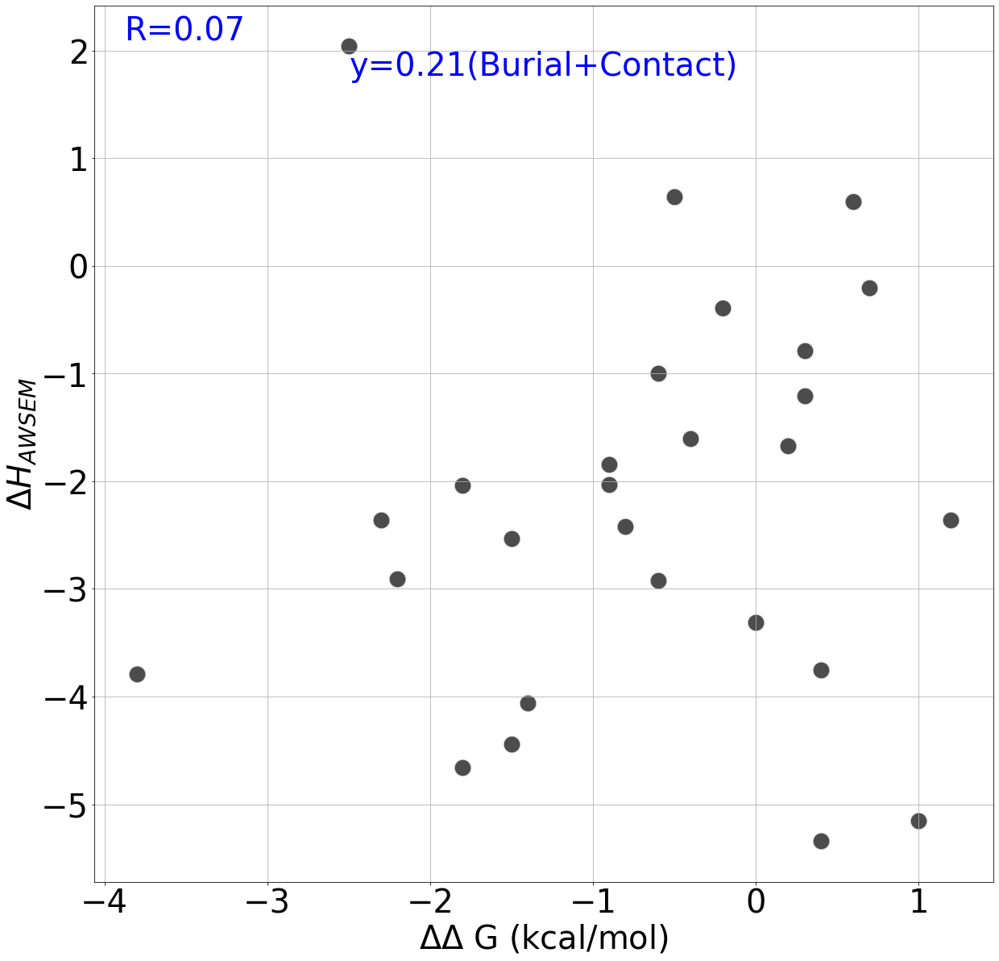

1FTG_A
Pearson Coefficient=0.13491562314472305


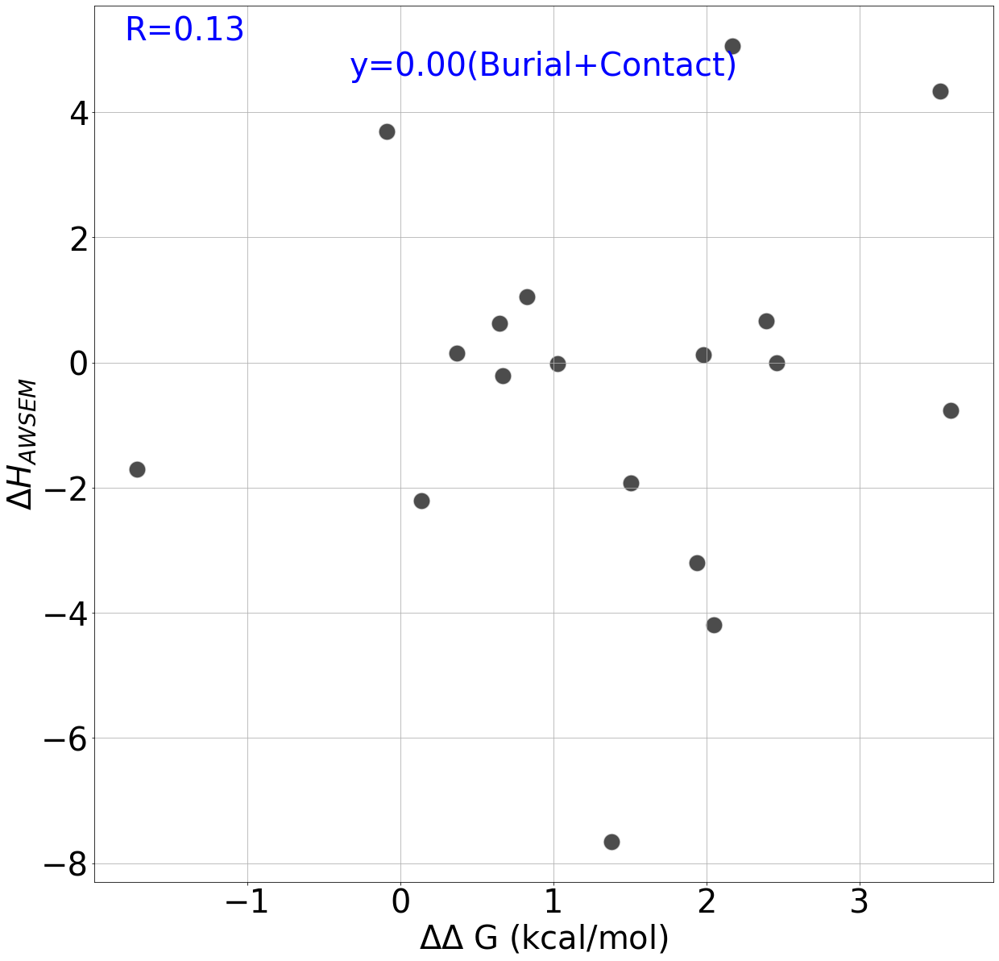

1BTA_A
Pearson Coefficient=0.6683914423096967


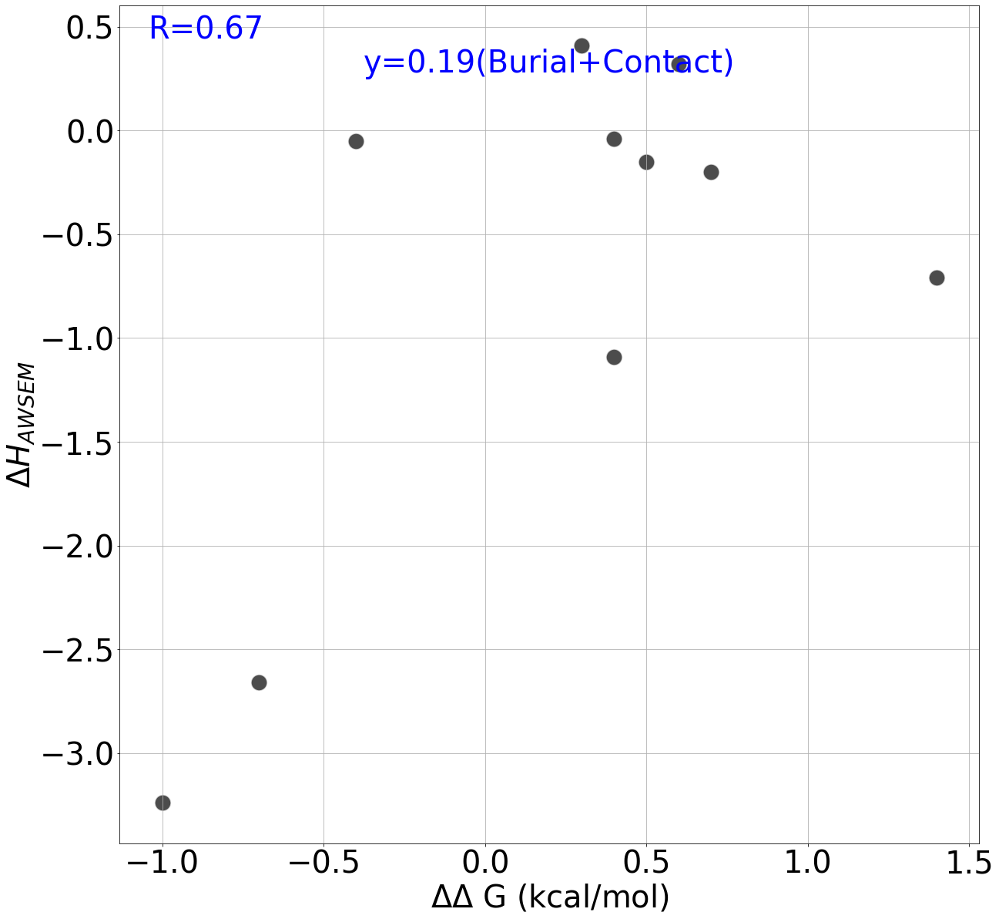

2HMB_A
Pearson Coefficient=-0.34501011350949884


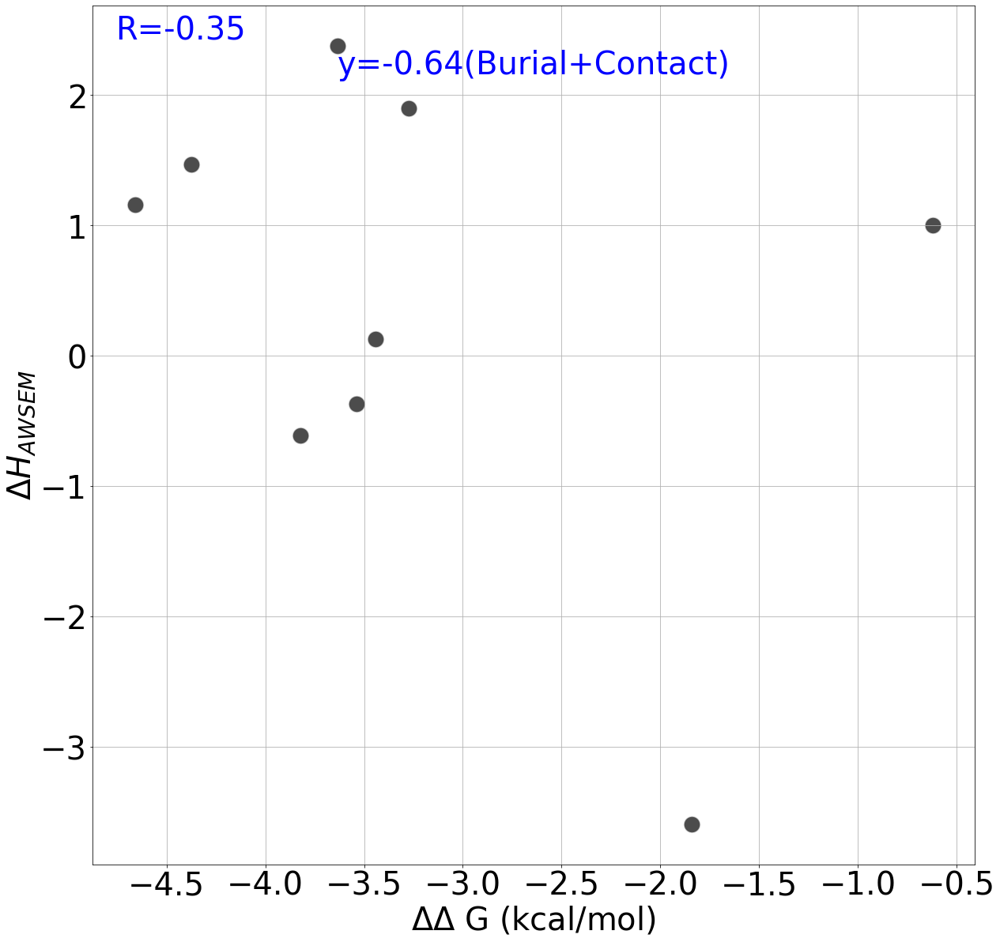

1IOB_A
Pearson Coefficient=0.787265033463726


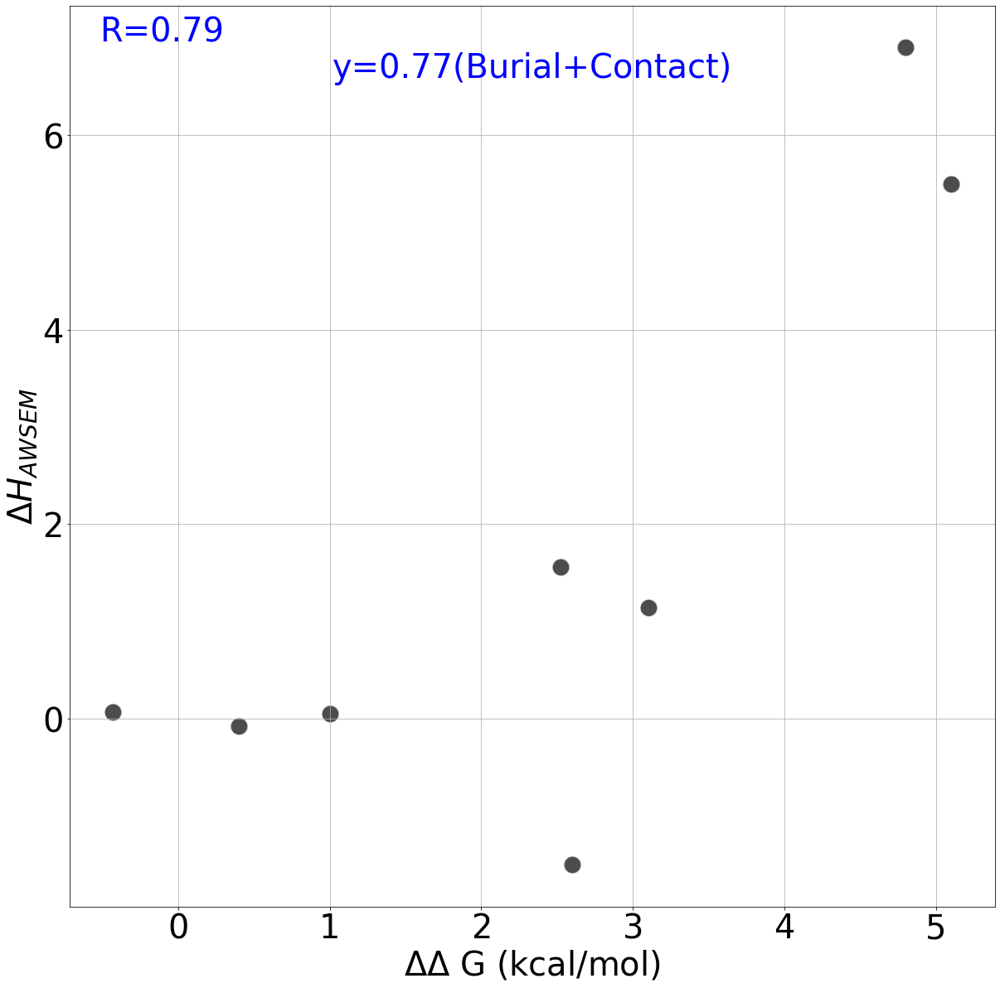

1OIA_A
Pearson Coefficient=0.5709427003524672


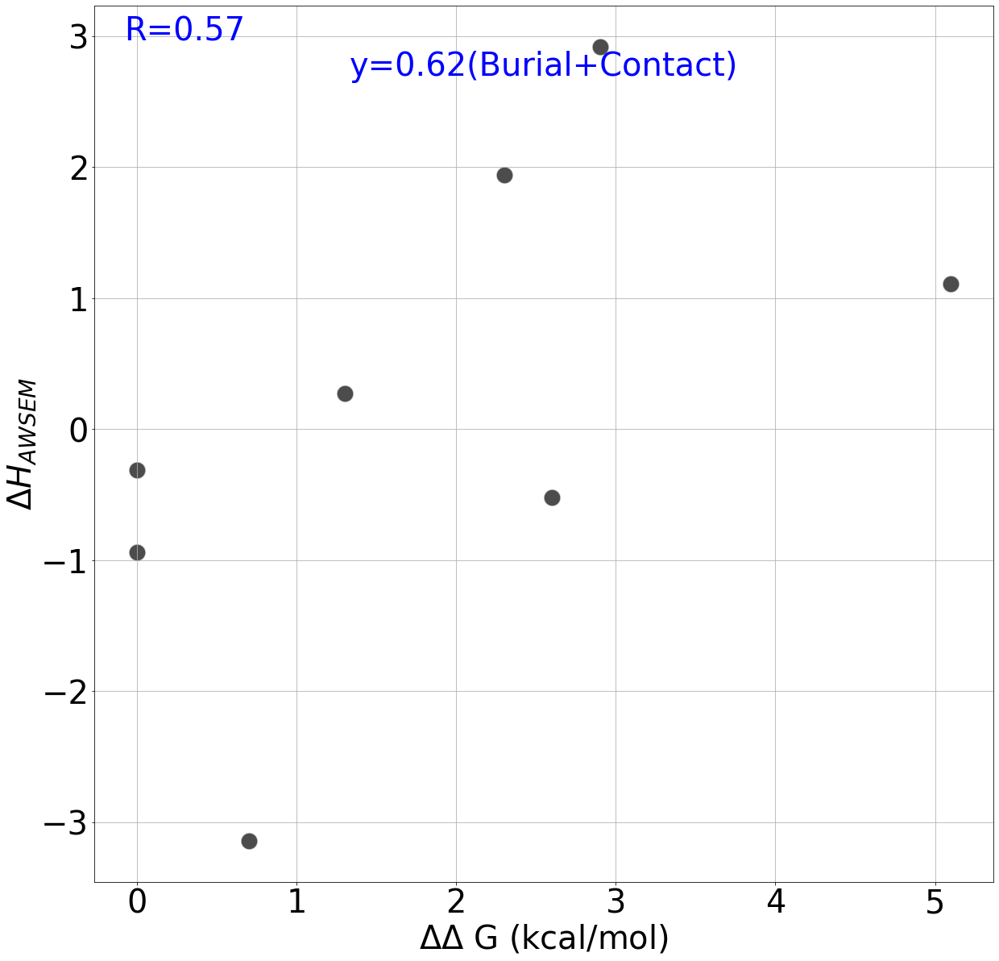

In [50]:
for pdb_name in all_single_mutations_protein_dataframe_copy_conditions_filter_4["PDB_Name"].unique():
    print(pdb_name)
    awsem_terms=["Burial+Contact"]
    pdb_all_single_mutations_protein_dataframe_copy_conditions_filter_4=all_single_mutations_protein_dataframe_copy_conditions_filter_4.loc[all_single_mutations_protein_dataframe_copy_conditions_filter_4["PDB_Name"]==pdb_name]
    if len(pdb_all_single_mutations_protein_dataframe_copy_conditions_filter_4)>3:
        ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(pdb_all_single_mutations_protein_dataframe_copy_conditions_filter_4,
                                             awsem_terms,f"{pdb_name}_{('_').join(awsem_terms)}",
                                             analysis_directory=f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/03_25_2022_{pdb_name}_Experimental_ddG_ddAWSEM",
                                            ddAWSEM_calculation_type=ddAWSEM_calculation_type)

### Filter 5: With Duplicate Enteries and Exposed Residues Filtered

In [51]:
all_single_mutations_protein_dataframe_copy_conditions_filter_5=all_single_mutations_protein_dataframe_copy_closest_ph.copy()

No handles with labels found to put in legend.


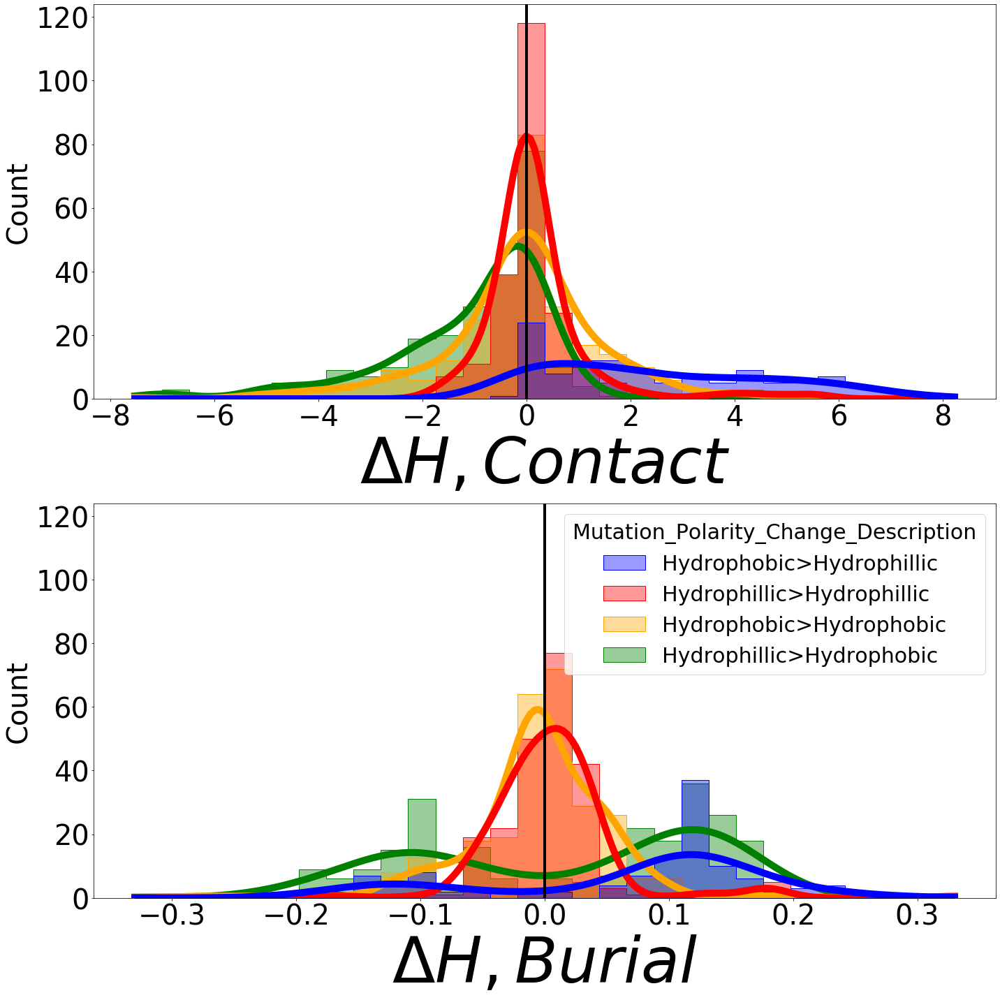

In [52]:
fig,axes=plt.subplots(2,1,figsize=(20,20),sharey=True)

for i,awsem_term in enumerate(["Contact","Burial"]):
    sns.histplot(data=all_single_mutations_protein_dataframe_copy_conditions_filter_5,x=awsem_term,
                 hue="Mutation_Polarity_Change_Description",ax=axes[i],kde=True,element="step",
                 line_kws={"linewidth":10},alpha=0.4,bins=bins,palette=hue_palette)
    if ddAWSEM_calculation_type=="ddAWSEM":
        axes[i].set_xlabel(fr"$\Delta \Delta H,{awsem_term}$",fontsize=90)
    else:
        axes[i].set_xlabel(fr"$\Delta H,{awsem_term}$",fontsize=90)
    if i!=1:
        axes[i].legend().remove()
    axes[i].axvline(linewidth=4, color='black')
    plt.tight_layout()
    plt.savefig(f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/{ddAWSEM_calculation_type}_Terms_Mutation_Polarity_Class_Change_Histograms.png")

Pearson Coefficient=0.48285035196787984


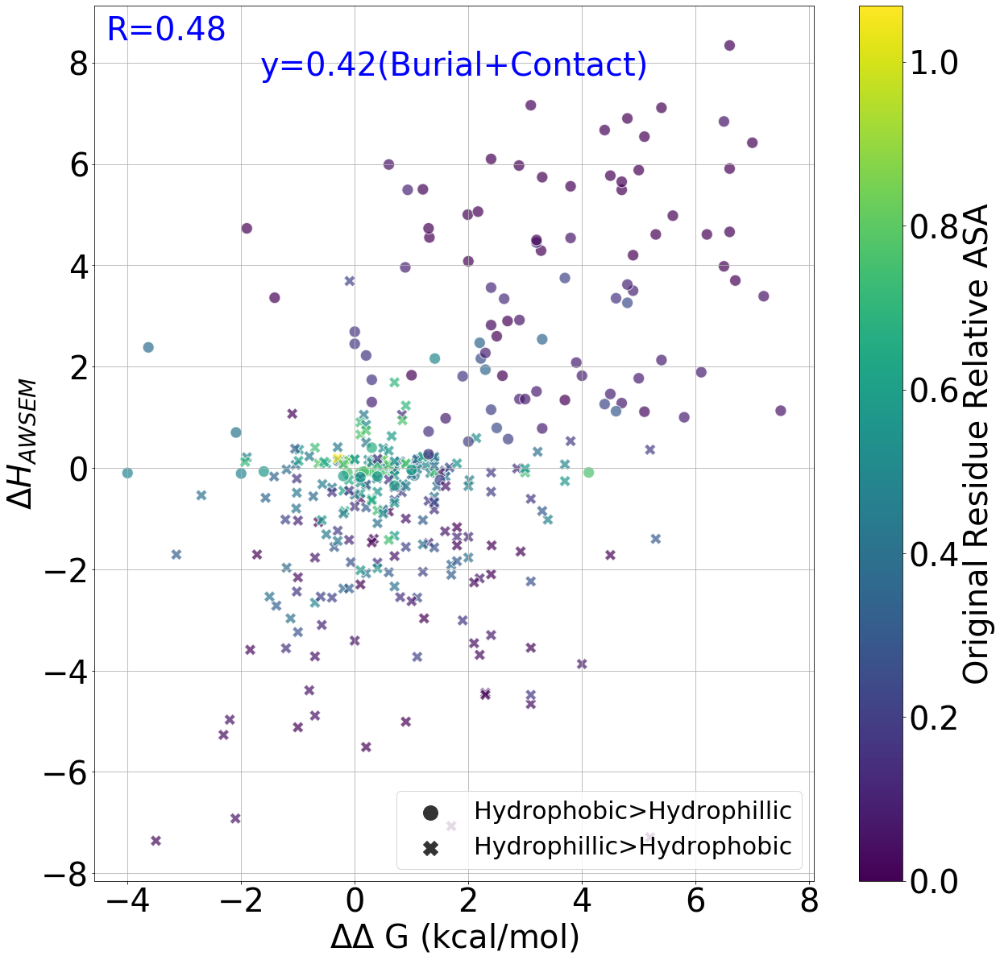

In [53]:
polarity_change_residues_dataframe=all_single_mutations_protein_dataframe_copy_conditions_filter_5.loc[all_single_mutations_protein_dataframe_copy_conditions_filter_5["Original_Residue_Polarity"]!=all_single_mutations_protein_dataframe_copy_conditions_filter_5["Mutated_Residue_Polarity"]]
###
ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(polarity_change_residues_dataframe,
                                     awsem_terms,f"All_Physiological_PDBs_{('_').join(awsem_terms)}_Buried_Mutation_Polarity_Class_Change_Relative_ASA",
                                     analysis_directory=all_single_mutation_S6_ddG_ddAWSEM_directory,
                                     ddAWSEM_calculation_type=ddAWSEM_calculation_type,
                                     hue_parameter="Mutation_Polarity_Change_Description",
                                     hue_palette=hue_palette,colorbar_parameter="Relative_ASA",
                                     colorbar_title="Original Residue Relative ASA")

Pearson Coefficient=0.52917083255088


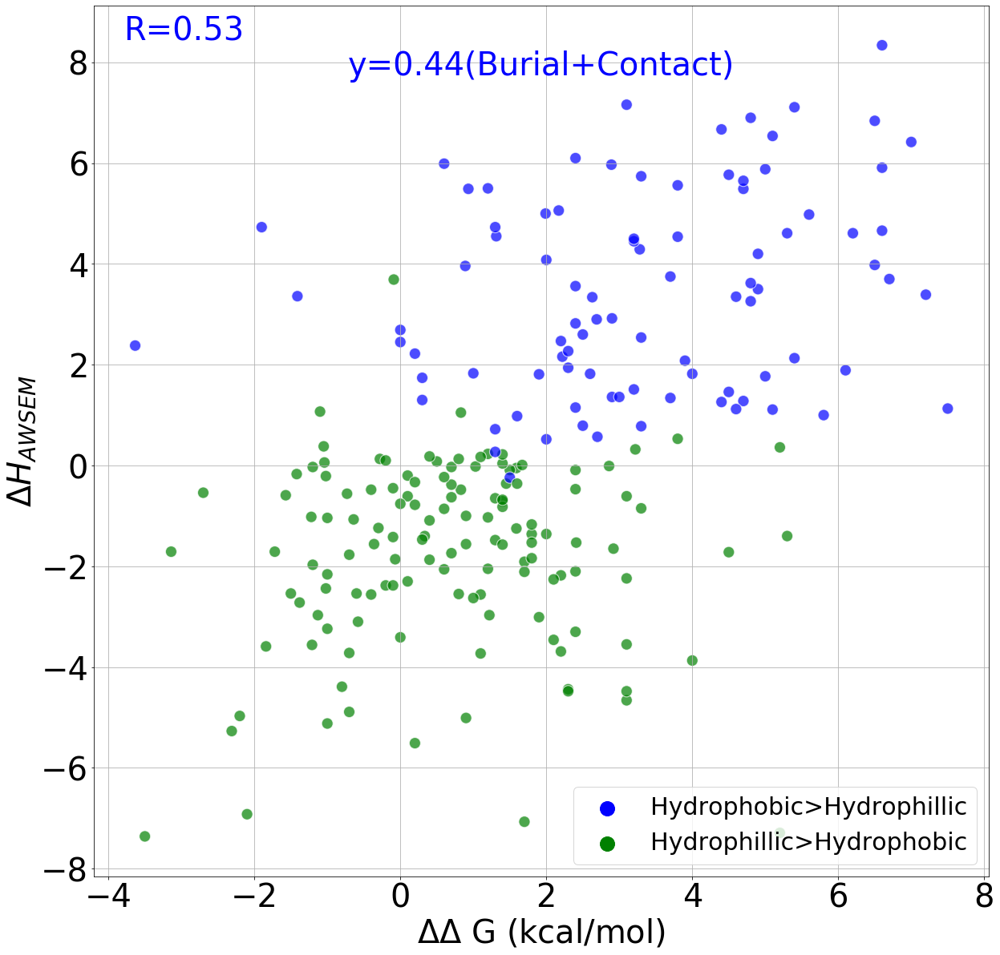

In [54]:
polarity_change_buried_residues_dataframe=polarity_change_residues_dataframe.loc[polarity_change_residues_dataframe["Original_Residue_Exposure"]!="Exposed"]
###
ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(polarity_change_buried_residues_dataframe,
                                     awsem_terms,f"All_Physiological_PDBs_{('_').join(awsem_terms)}_Buried_Mutation_Polarity_Class_Change",
                                     analysis_directory=all_single_mutation_S6_ddG_ddAWSEM_directory,
                                     ddAWSEM_calculation_type=ddAWSEM_calculation_type,
                                     hue_parameter="Mutation_Polarity_Change_Description",
                                     hue_palette=hue_palette)

Pearson Coefficient=0.52917083255088


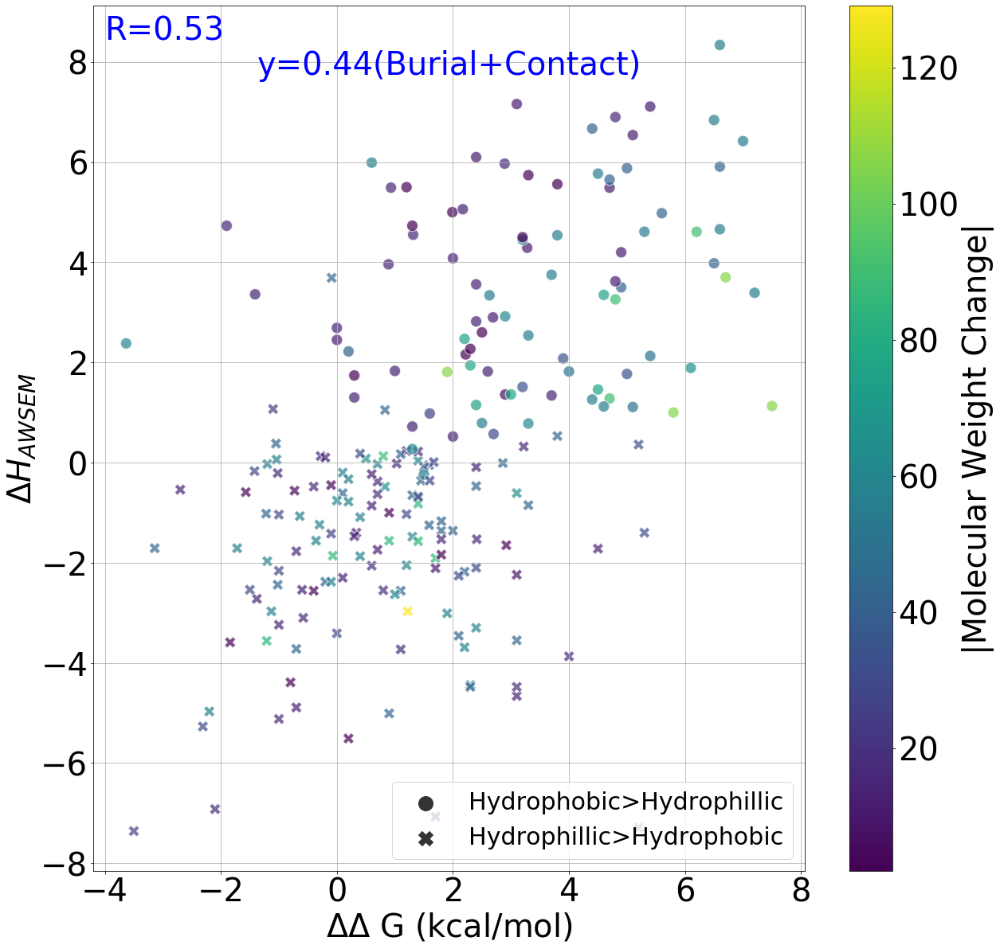

In [55]:
ddAWSEM_coef=plot_pdb_ddAWSEM_vs_ddG(polarity_change_buried_residues_dataframe,
                                     awsem_terms,f"All_Physiological_PDBs_{('_').join(awsem_terms)}_Buried_Mutation_Polarity_Class_Change_MW_Change",
                                     analysis_directory=all_single_mutation_S6_ddG_ddAWSEM_directory,
                                     ddAWSEM_calculation_type=ddAWSEM_calculation_type,
                                     hue_parameter="Mutation_Polarity_Change_Description",
                                     hue_palette=hue_palette,
                                     colorbar_parameter="Mutation_MW_Change",colorbar_title="|Molecular Weight Change|")

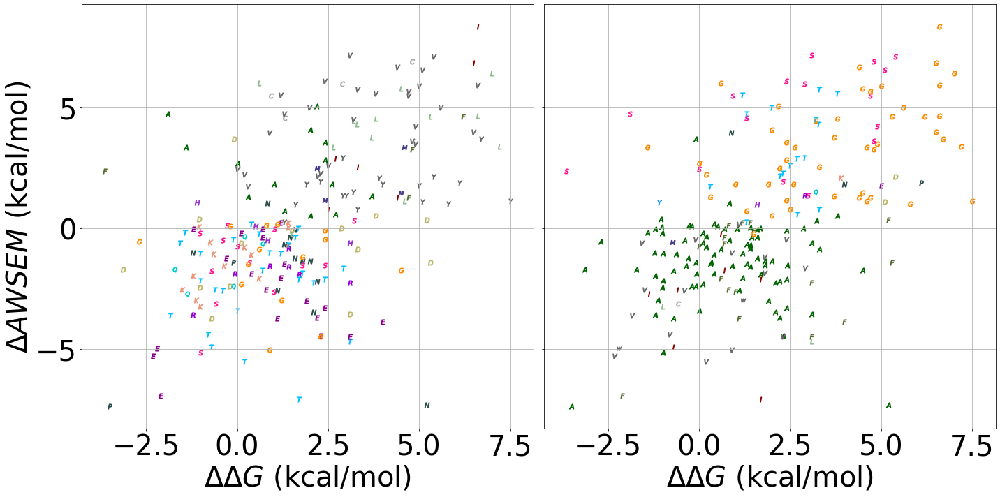

In [65]:
#Using residue identity as marker.
import matplotlib.colors as mcolors
fig,axes=plt.subplots(1,2,sharey=True,sharex=True,figsize=(20,10))

markers=[r"${}$".format(i) for i in polarity_change_buried_residues_dataframe["Original_Residue"]]
palette=dict(zip(np.unique(markers), (list(mcolors.CSS4_COLORS.keys())[25:])))

for y,x,m in zip (polarity_change_buried_residues_dataframe["Burial+Contact"],
                  polarity_change_buried_residues_dataframe["ddG_H2O_Corrected"],markers):
    axes[0].scatter(x,y,marker=m, s=50,color=palette[m])
axes[0].set_xlabel(r"$\Delta \Delta G$ (kcal/mol)")
axes[0].set_ylabel(r"$\Delta AWSEM$ (kcal/mol)")
axes[0].grid()
###
markers=[r"${}$".format(i) for i in polarity_change_buried_residues_dataframe["Mutation_Residue"]]
palette=dict(zip(np.unique(markers), (list(mcolors.CSS4_COLORS.keys())[25:])))

for y,x,m in zip (polarity_change_buried_residues_dataframe["Burial+Contact"],
                  polarity_change_buried_residues_dataframe["ddG_H2O_Corrected"],markers):
    axes[1].scatter(x,y,marker=m, s=50,color=palette[m])
axes[1].set_xlabel(r"$\Delta \Delta G$ (kcal/mol)")
axes[1].grid()
plt.tight_layout()

plt.savefig(f"{all_single_mutation_S6_ddG_ddAWSEM_directory}/All_Physiological_PDBS_dAWSEM_Buried_Mutation_Polarity_Class_Change_Letter_Marker.png")

{'$A$': 'darkgreen', '$C$': 'darkgrey', '$D$': 'darkkhaki', '$E$': 'darkmagenta', '$F$': 'darkolivegreen', '$G$': 'darkorange', '$H$': 'darkorchid', '$I$': 'darkred', '$K$': 'darksalmon', '$L$': 'darkseagreen', '$M$': 'darkslateblue', '$N$': 'darkslategray', '$P$': 'darkslategrey', '$Q$': 'darkturquoise', '$R$': 'darkviolet', '$S$': 'deeppink', '$T$': 'deepskyblue', '$U$': 'dimgray', '$V$': 'dimgrey', '$W$': 'dodgerblue', '$Y$': 'firebrick'}
2AFG_A
1QLP_A
1BNI_A
1BTA_A
2CI2_I
2HMB_A
2IFB_A
1FTG_A
1FLV_A
1POH_A
1IOB_A
1STN_A
1OIA_A
1QQV_A


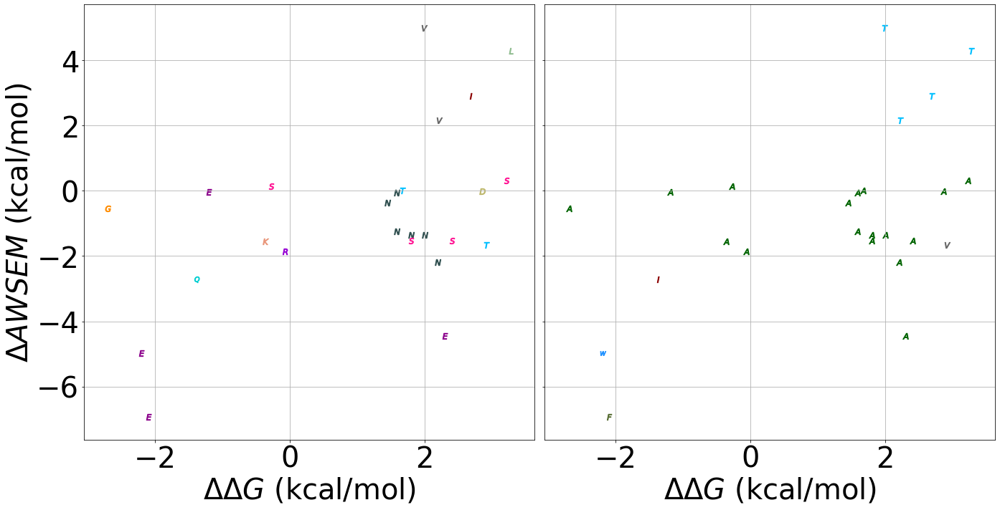

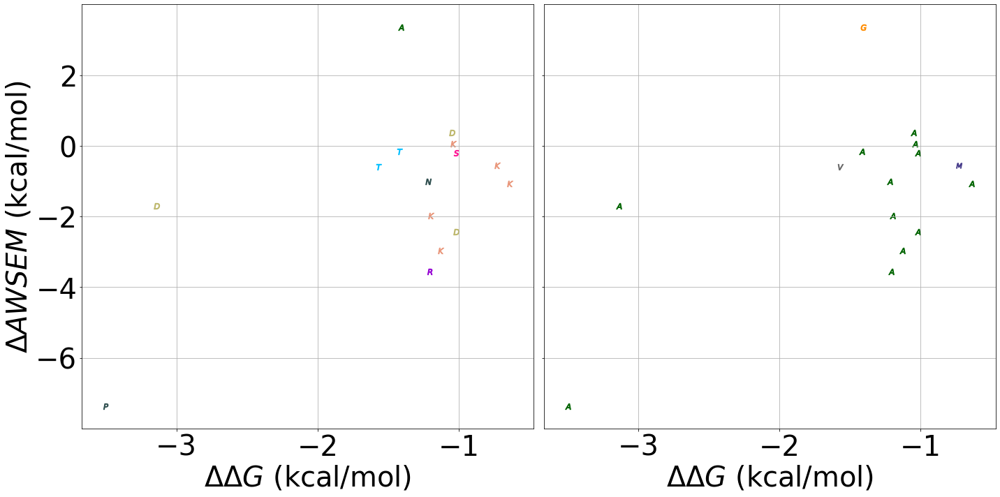

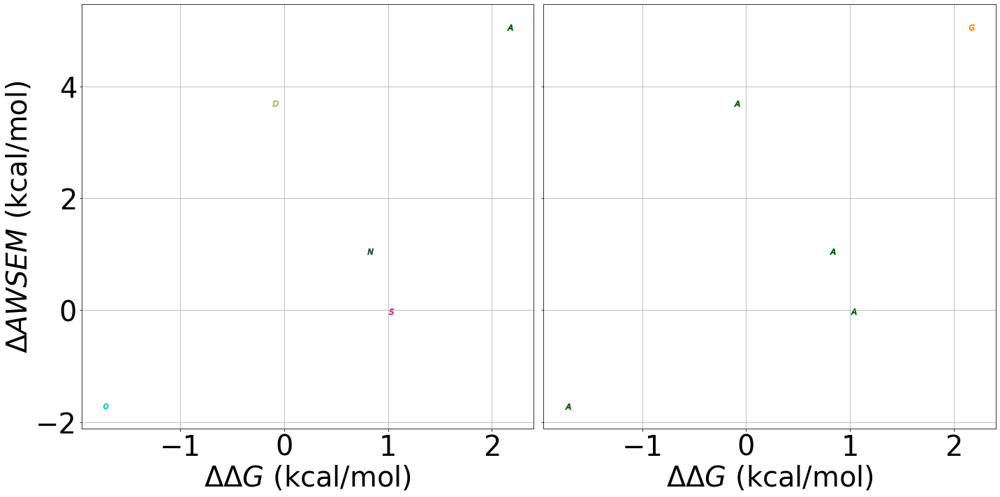

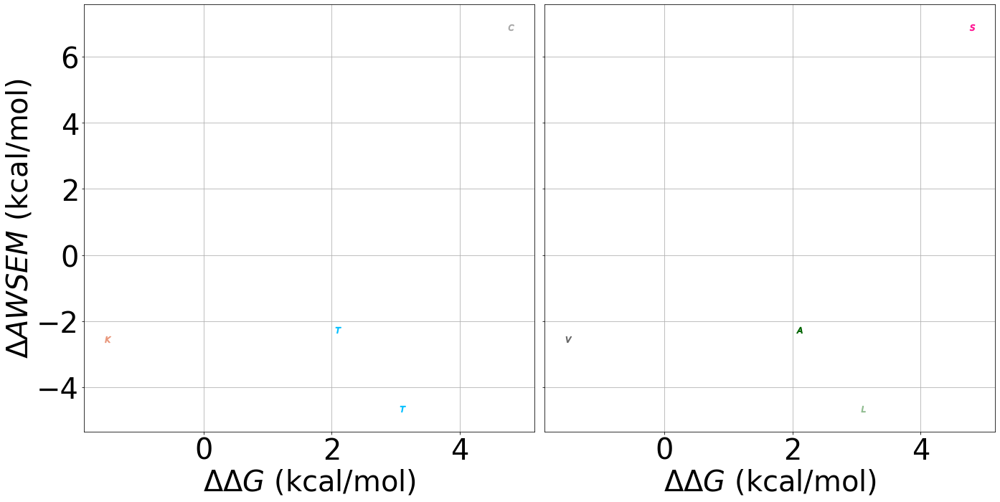

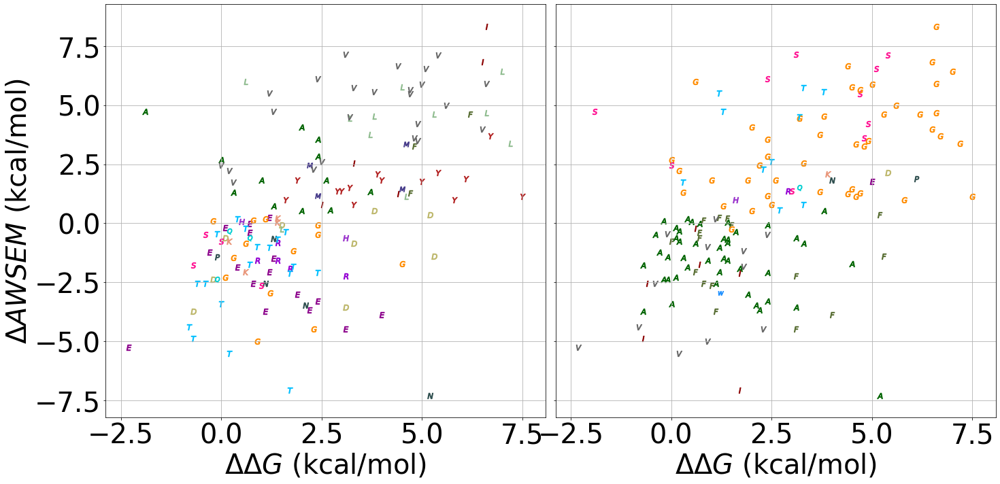

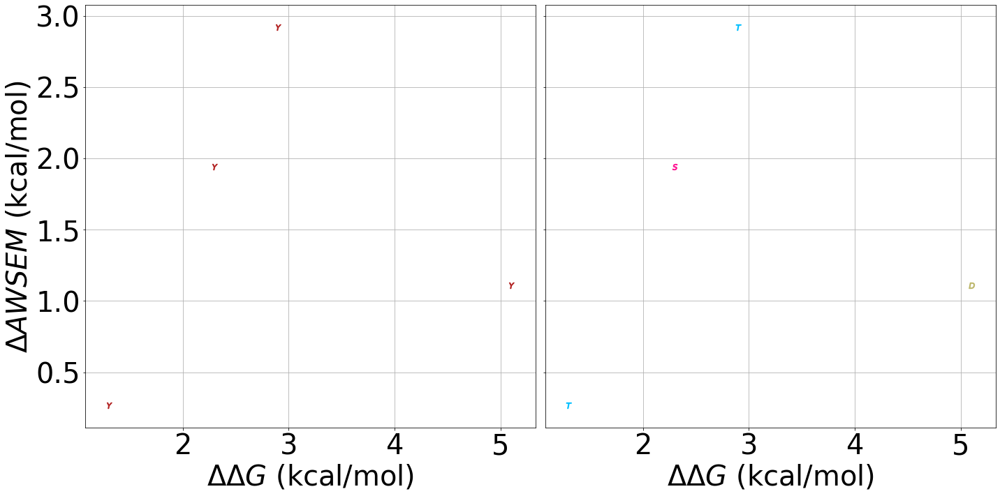

In [59]:
palette=dict(zip(["$A$","$C$","$D$","$E$","$F$","$G$","$H$","$I$","$K$","$L$","$M$","$N$","$P$","$Q$","$R$",
                  "$S$","$T$","$U$","$V$","$W$","$Y$"],(list(mcolors.CSS4_COLORS.keys())[25:])))
print(palette)
for pdb_name in polarity_change_buried_residues_dataframe["PDB_Name"].unique():
    print(pdb_name)
    awsem_terms=["Burial+Contact"]
    pdb_polarity_change_buried_residues_dataframe=polarity_change_buried_residues_dataframe.loc[polarity_change_buried_residues_dataframe["PDB_Name"]==pdb_name]
    if len(pdb_polarity_change_buried_residues_dataframe)>3:
        fig,axes=plt.subplots(1,2,sharey=True,sharex=True,figsize=(20,10))

        originial_markers=[r"${}$".format(i) for i in pdb_polarity_change_buried_residues_dataframe["Original_Residue"]]
        mutation_markers=[r"${}$".format(i) for i in pdb_polarity_change_buried_residues_dataframe["Mutation_Residue"]]

        for y,x,m in zip (pdb_polarity_change_buried_residues_dataframe["Burial+Contact"],
                          pdb_polarity_change_buried_residues_dataframe["ddG_H2O_Corrected"],originial_markers):
            axes[0].scatter(x,y,marker=m, s=70,color=palette[m])
        axes[0].set_xlabel(r"$\Delta \Delta G$ (kcal/mol)")
        axes[0].set_ylabel(r"$\Delta AWSEM$ (kcal/mol)")
        axes[0].grid()
        ###
        for y,x,m in zip (pdb_polarity_change_buried_residues_dataframe["Burial+Contact"],
                          pdb_polarity_change_buried_residues_dataframe["ddG_H2O_Corrected"],mutation_markers):
            axes[1].scatter(x,y,marker=m, s=70,color=palette[m])
        axes[1].set_xlabel(r"$\Delta \Delta G$ (kcal/mol)")
        axes[1].grid()
        plt.tight_layout()